In [1]:
import numpy as np
import matplotlib.pyplot as plt
import math
import pandas as pd
#import uproot
import uproot3
from scipy import optimize as op

*Bin Conversions*
Available Functions:
Note: All functions return new arrays rather than altering the previous array
	New_Merged_Size(array_,merge_size_) returns what the size of the new merged array will be
	Merge_Bin_Edges(edges_,merge_size) merges the bin edges 
	Merge_Bins(array_,merge_size_) adds together every <merge_size_> values in an array
	Merge_Vals(yarray_,merge_size_) adds together every <merge_size_> ybin together in an array
	Merge_Bins(xarray_,merge_size_) averages every <merge_size_> xbins together in an array
	Count_Non_Zero(array_) counts the number of nonzero values in an array
	Count_Zero(array_) counts the number of zeros in an array
	Remove_Zeros(array_) remove zeros from an array
	Remove_Zeros_Y(yarray_) removes zero values from yarray
	Remove_Zeros_X(xarray_,yarray_) removes xbins where the corresponding y value was zero
	Count_InBounds(yarray_,low_,high_) counts the number of values that fall between bounds (or equal to)
	Count_OutBounds(yarray_,low_,high_) co

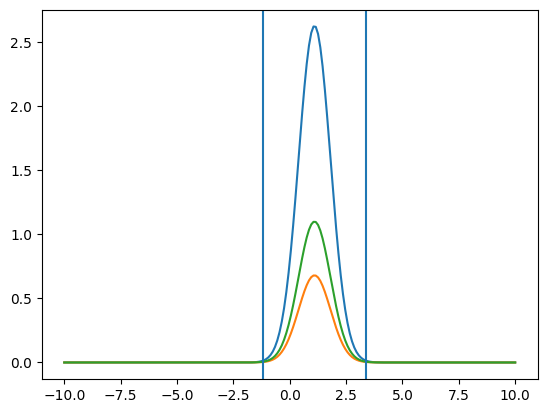

*Extracting Pieces for TH1*
Available Functions:
	Num_Xbins(TH1_) returns number of X bins for a TH1
	XEdges_1d(TH1_) returns edges of x bins for a TH1
	Center_Xbins(TH1_) returns center values for x bins for a TH1
	Values_1d(TH1_) returns the y values for a TH1
	Errors_1d(TH1_) returns the error values for TH1
	Errors2_1d(TH1_) returns the squared error values for TH1
Enjoy using TH1s

0.014000000000000012
You have access to information regarding all bin numbers, bin maxes, bin mins
Each goes _VAR_max_ min, bins, res, etc. 
All the names of them as well as edges.
Q2_Bin_Name[ 5 ]
W_Bin_Name[ 29 ]
MM1_Bin_Name[ 14 ]
MM2_Bin_Name[ 14 ]
theta_Bin_Name[ 10 ]
alpha_Bin_Name[ 10 ]
phi_Bin_Name[ 10 ]
_var_set_name_ [i]
_Xij_name_[i][j]
Also _mm1_name_ etc. for all Xijs
def Q2_Corr(Q2bin_) corrects the cross section for simulation so far as Q2 is concerned
def Xij_Bin_Name(var_, Xij_, Xijbin_,Wbin_=0):
def Xij_Plot_Name(var_, Xij_, Xijbin_,Wbin_=0):
def Xij_Var_Name(var_, Xij_):
$M(p',\pi^{+}

In [2]:
#Gain access to functions used to change some of the aspects regarding arrays and the things in them
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/Bin\ Conversions.ipynb

#Gain Access to functions used to work with momentum binning
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/Momentum\ Bins.ipynb

#Gain Access to functions used to work with Fitting Functions
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/Fitting\ Functions.ipynb

#Gain Access to functions used for TH2s 
#uproot or uproo4
#%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/TH2\ Functions.ipynb
#uproot3
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/TH1\ Functions-uproot3.ipynb

#Gain Access to the proper binning for the the various variables
%run /Users/cmc/analysis_phd/fitting/single_diff/Friend\ Binning\ Values.ipynb

In [6]:
#date="06-13-2022"
date="07-09-2024"
par="pim"
sim="exp"
run="e16"
#SLURM_ID="13866486"
top="m"+par
#dir="/Users/cmc/analysis_phd/root_files/cut_determination/cut_det_e16/"+date
dir="/Users/cmc/analysis_phd/root_files/cut_determination/cut_det_e16/"+date
#root_file=dir+"/exp_mm_"+par+"_e16_"+date+"_"+SLURM_ID+".root"
root_file=dir+"/"+sim+"_"+run+"_clas6_mm_"+par+"_"+date+".root"
file=uproot3.open(root_file)

In [7]:
Particle=''
if par == "pro":
    Particle = "Proton"
elif par == "pip":
    Particle = "\u03C0 +"
elif par == "pim":
    Particle = "\u03C0 -"
else:
    Particle = "Explicit"

In [8]:
#The Various layers of TDirectories to get to the histograms
layer0='MM'
layer1='MM_'+top
layer2=layer1+"_no-cut"
layer3=[layer2+"_sec"+str(i+1) for i in range(6)]
layer4=[layer3[i]+"_clean" for i in range(6)]
layer51=[layer4[i]+"_W_dep" for i in range(6)]
layer52=[layer4[i]+"_W_Range" for i in range(6)]
dir_loc=[([layer0+'/'+layer1+'/'+layer2+'/'+layer3[i]+'/'+layer4[i]+'/'+layer51[i]],[layer0+'/'+layer1+'/'+layer2+'/'+layer3[i]+'/'+layer4[i]+'/'+layer52[i]]) for i in range(6)]
names1=[["MM_"+top+"_no-cut_clean_sec"+str(i+1)+"_W:"+W_Bin_Name[j] for j in range(_W_bins_)] for i in range(6)]
names2=["MM_"+top+"_no-cut_clean_sec"+str(i+1)+"_W:in_range" for i in range(6)]
#Histogram Names
hist_name=[[[file[dir_loc[i][0][0]][names1[i][j]] for j in range(_W_bins_)],file[dir_loc[i][1][0]][names2[i]]] for i in range(6)]
          

In [9]:
def sign(n_):
    if n_ >= 0:
        return 1
    else:
        return -1

initial bw fit:  [1.34221777e+03 1.71167426e-01 1.31371283e-01]
-0.012884185129929414 0.06720944989785313
Breit-Wigner Peak [1.21697671e+03 1.64810899e-01 1.15537609e-01]
Gaus2 [5.00094414e+02 6.50476815e-02 1.64557695e-02]
Gaus3 [7.06094734e+02 8.00000000e-02 3.22487496e-02]


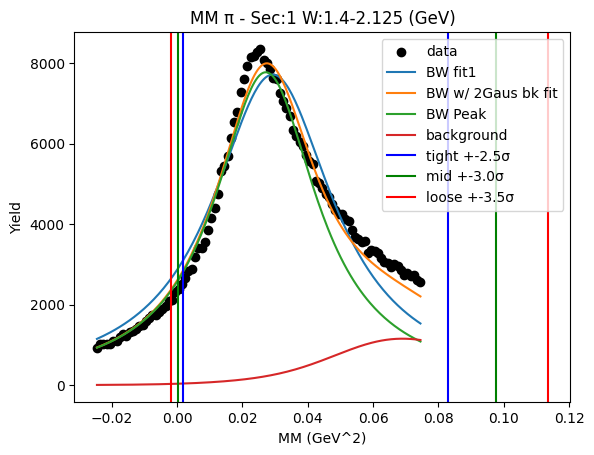

W bin: 1 1.425 GeV-1.450 GeV
initial bw fit:  [8.91751193 0.16520972 0.07543278]


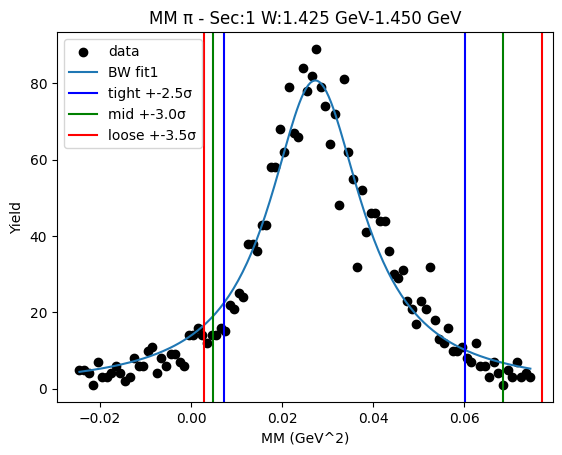

W bin: 2 1.450 GeV-1.475 GeV
initial bw fit:  [11.93407701  0.16876349  0.07300037]


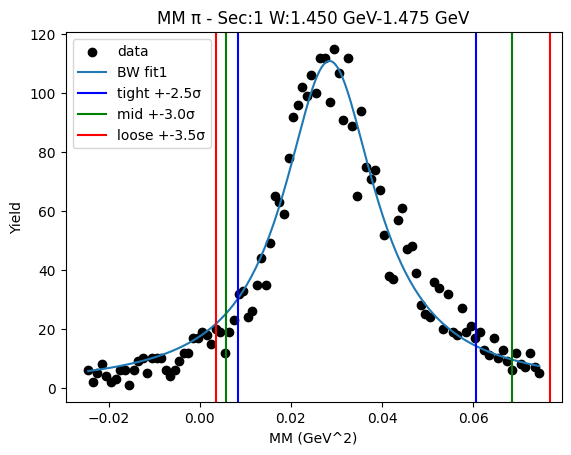

W bin: 3 1.475 GeV-1.500 GeV
initial bw fit:  [14.75707715  0.17002035  0.07571907]


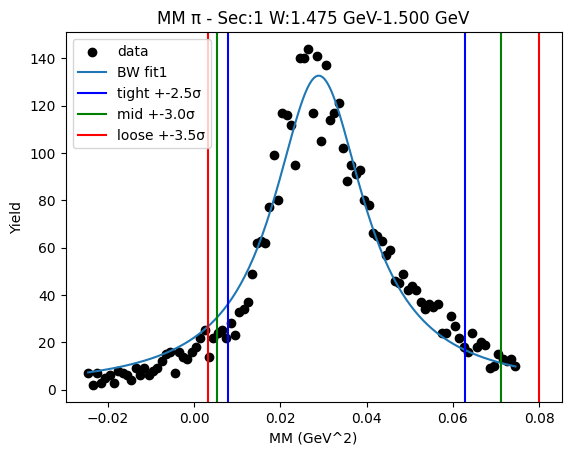

W bin: 4 1.500 GeV-1.525 GeV
initial bw fit:  [17.15581353  0.17354526  0.084576  ]


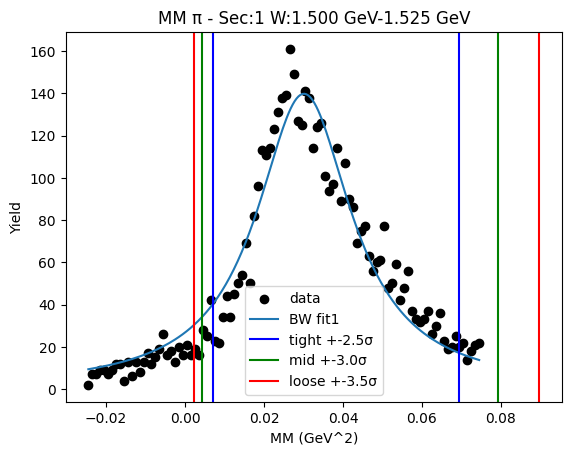

W bin: 5 1.525 GeV-1.550 GeV
initial bw fit:  [18.81464144  0.17525207  0.08211622]


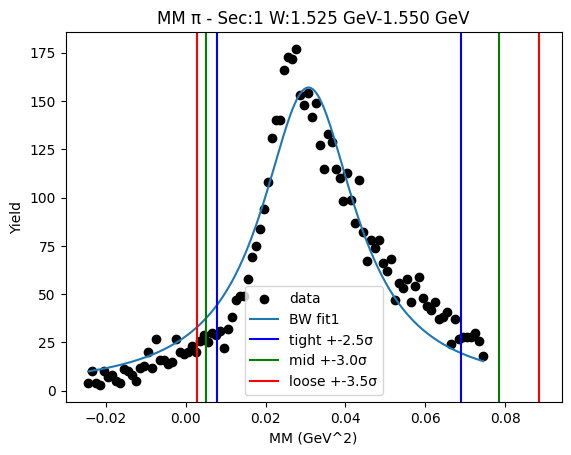

W bin: 6 1.550 GeV-1.575 GeV
initial bw fit:  [19.13184334  0.17681904  0.08888288]


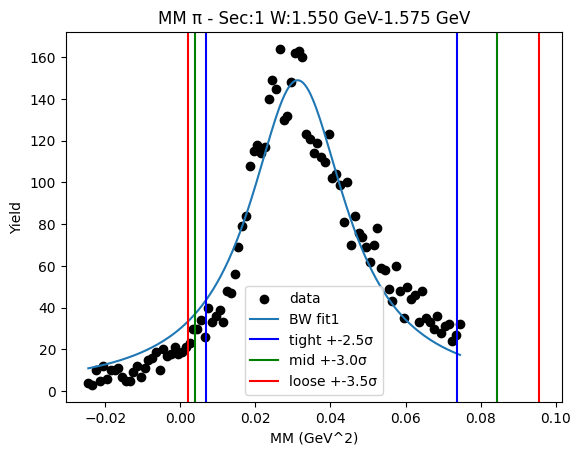

W bin: 7 1.575 GeV-1.600 GeV
initial bw fit:  [19.59823946  0.17589329  0.09249419]


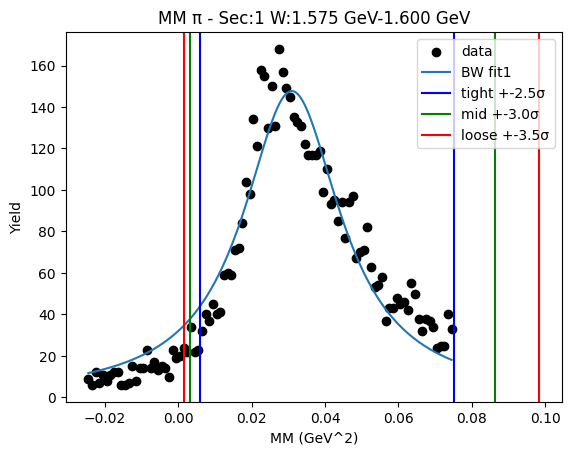

W bin: 8 1.600 GeV-1.625 GeV
initial bw fit:  [18.74241907  0.1749009   0.0977806 ]


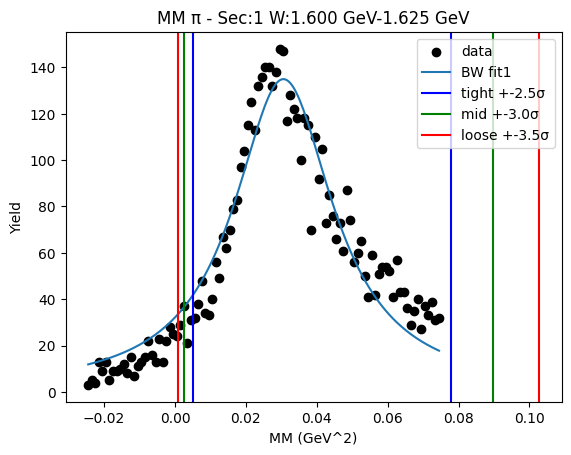

W bin: 9 1.625 GeV-1.650 GeV
initial bw fit:  [20.49431692  0.1726382   0.09929858]


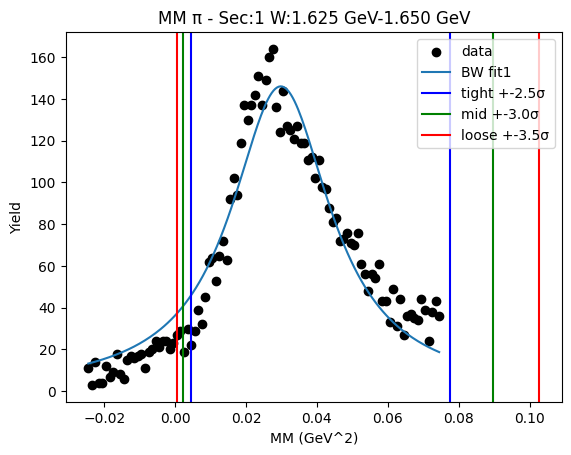

W bin: 10 1.650 GeV-1.675 GeV
initial bw fit:  [23.47074183  0.1692245   0.09576604]


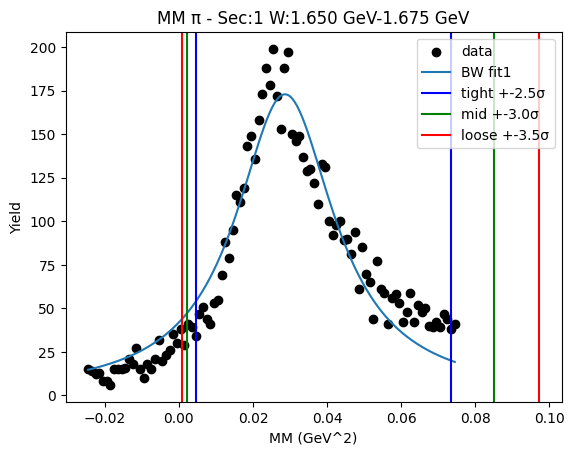

W bin: 11 1.675 GeV-1.700 GeV
initial bw fit:  [27.133422    0.16972315  0.09917426]


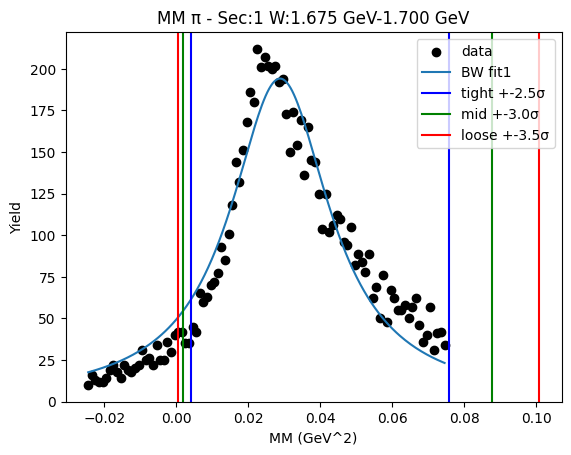

W bin: 12 1.700 GeV-1.725 GeV
initial bw fit:  [31.5817347   0.17028977  0.09835805]


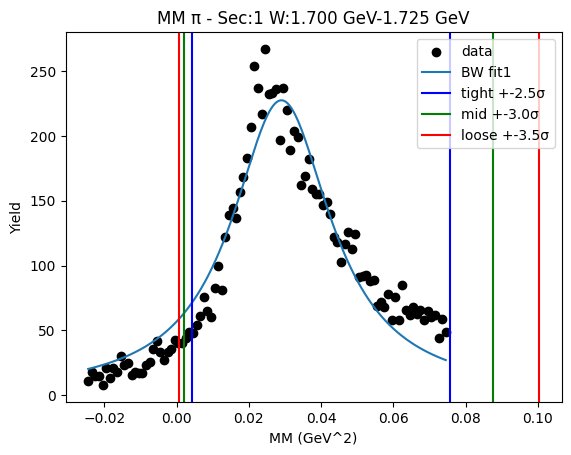

W bin: 13 1.725 GeV-1.750 GeV
initial bw fit:  [34.12983548  0.17268377  0.0985216 ]


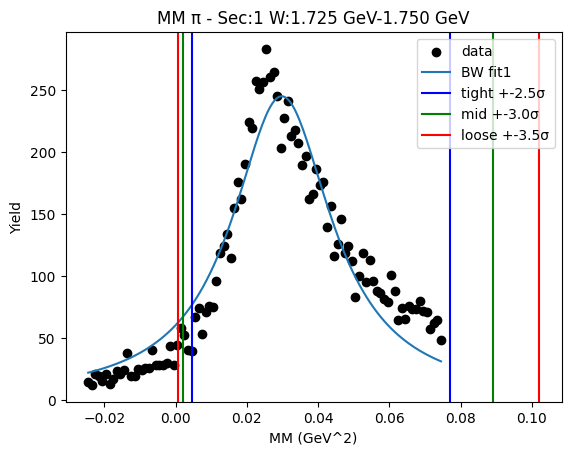

W bin: 14 1.750 GeV-1.775 GeV
initial bw fit:  [33.92767978  0.17502614  0.10575111]


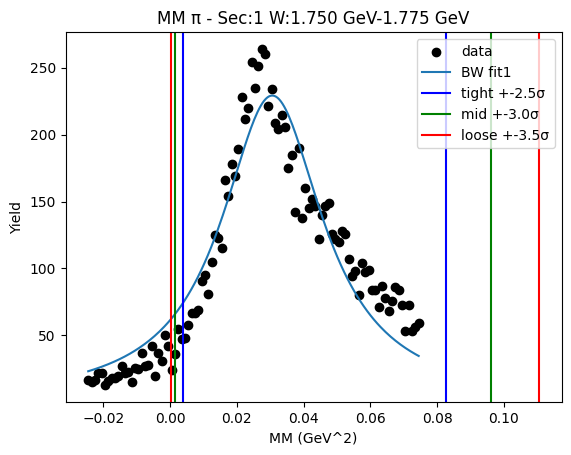

W bin: 15 1.775 GeV-1.800 GeV
initial bw fit:  [31.81485279  0.17522386  0.10832342]


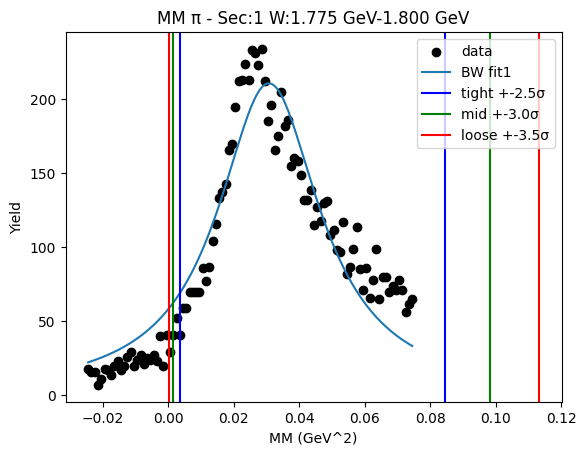

W bin: 16 1.800 GeV-1.825 GeV
initial bw fit:  [30.37387897  0.17582434  0.11101851]


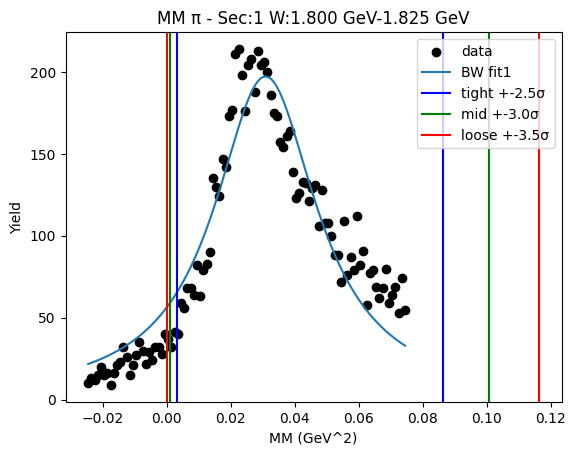

W bin: 17 1.825 GeV-1.850 GeV
initial bw fit:  [30.41331887  0.17417094  0.11029905]


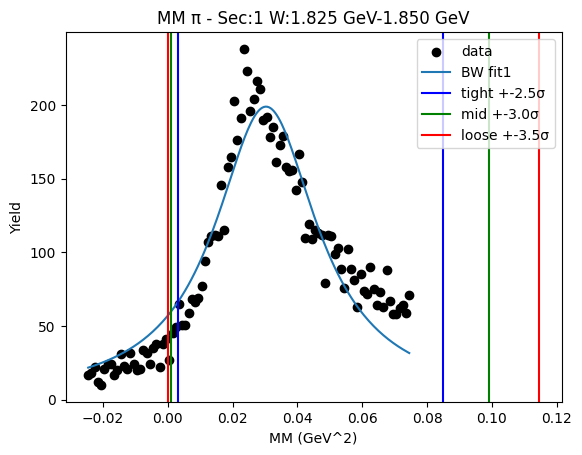

W bin: 18 1.850 GeV-1.875 GeV
initial bw fit:  [30.42620124  0.17483022  0.12194407]


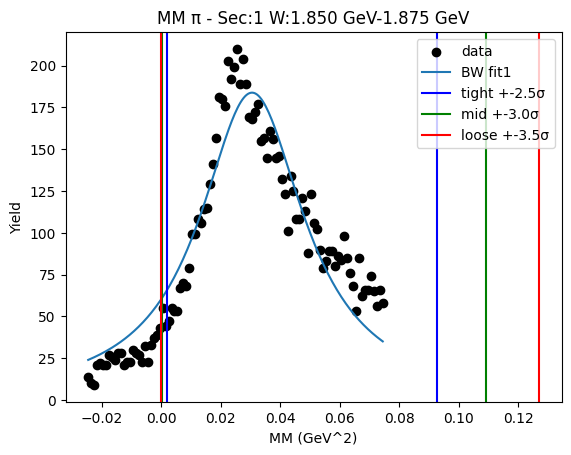

W bin: 19 1.875 GeV-1.900 GeV
initial bw fit:  [30.59336611  0.172965    0.1142257 ]


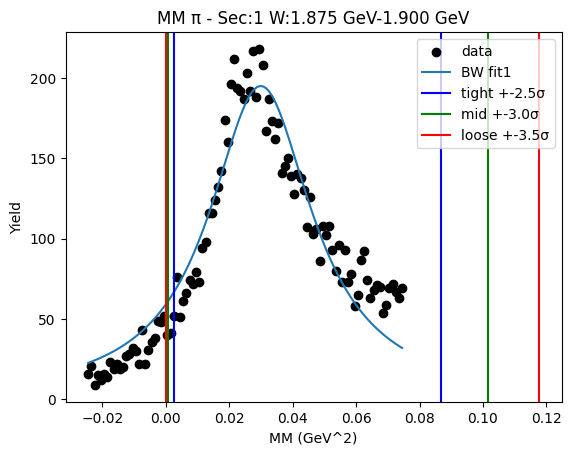

W bin: 20 1.900 GeV-1.925 GeV
initial bw fit:  [30.86239737  0.1717133   0.11631163]
W1_ini_pars: [30.86239737  0.1717133   0.11631163  3.07211428  0.3         0.06742853
  2.78458923  0.4         0.10165907]
Runtime Error2.1
	Just skip it for now


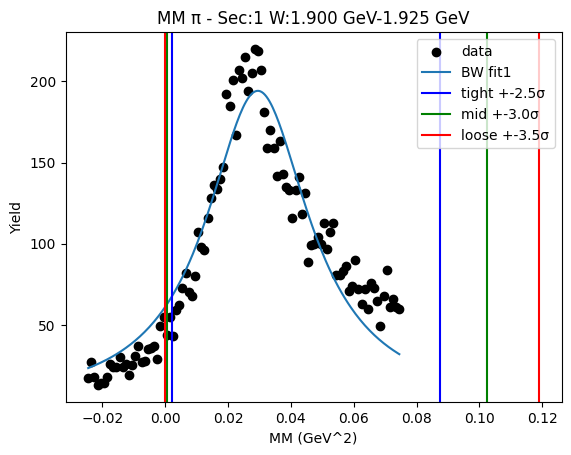

W bin: 21 1.925 GeV-1.950 GeV
initial bw fit:  [31.41209565  0.174215    0.11664203]
W1_ini_pars: [31.41209565  0.174215    0.11664203  3.07211428  0.3         0.06742853
  2.78458923  0.4         0.10165907]
Runtime Error2.1
	Just skip it for now


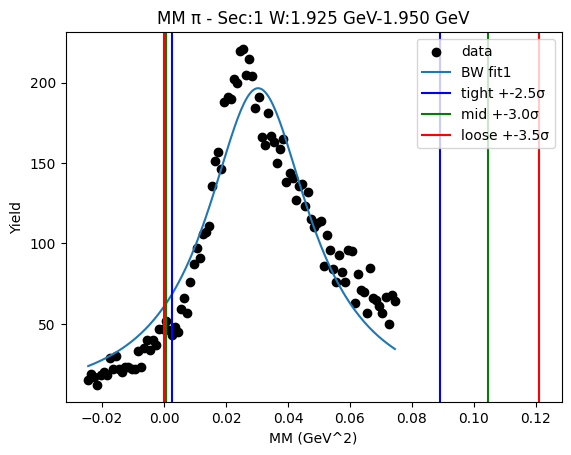

W bin: 22 1.950 GeV-1.975 GeV
initial bw fit:  [30.46805408  0.17140692  0.11749027]
W1_ini_pars: [30.46805408  0.17140692  0.11749027  3.07211428  0.3         0.06742853
  2.78458923  0.4         0.10165907]
Runtime Error2.1
	Just skip it for now


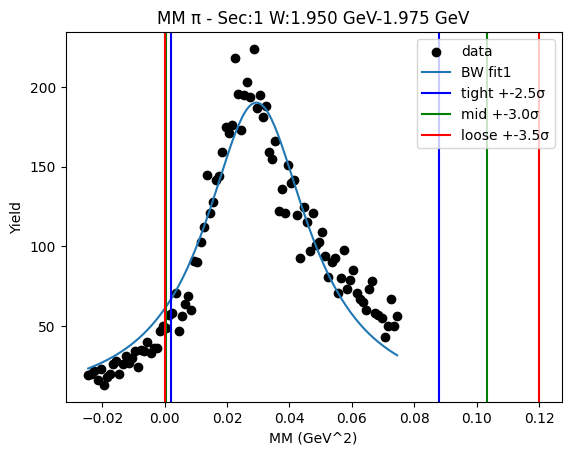

W bin: 23 1.975 GeV-2.000 GeV
initial bw fit:  [30.2149952   0.17126008  0.12015524]
W1_ini_pars: [30.2149952   0.17126008  0.12015524  3.07211428  0.3         0.06742853
  2.78458923  0.4         0.10165907]
Runtime Error2.1
	Just skip it for now


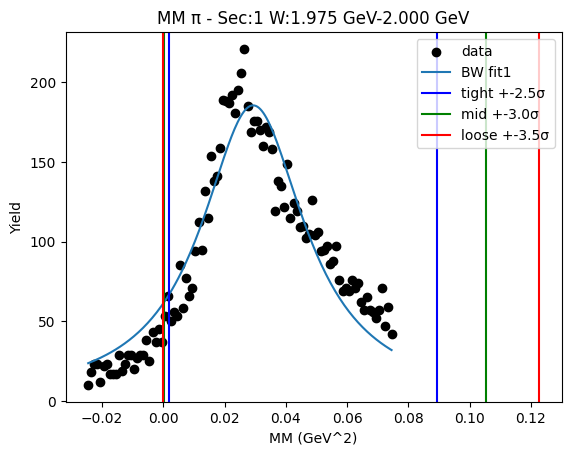

W bin: 24 2.000 GeV-2.025 GeV
initial bw fit:  [29.24602759  0.17111525  0.12323197]
W1_ini_pars: [29.24602759  0.17111525  0.12323197  3.07211428  0.3         0.06742853
  2.78458923  0.4         0.10165907]
Runtime Error2.1
	Just skip it for now


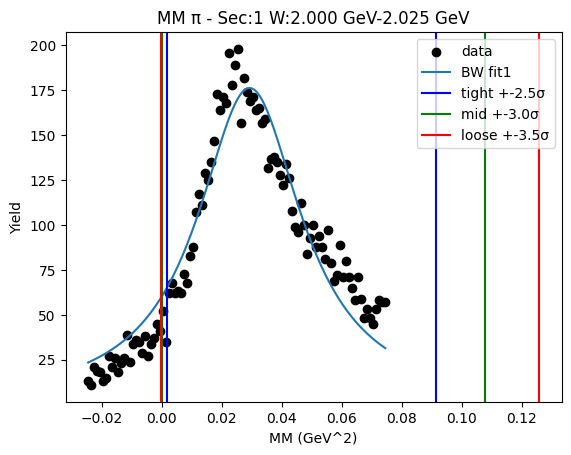

W bin: 25 2.025 GeV-2.050 GeV
initial bw fit:  [28.46682588  0.16881336  0.12045769]
W1_ini_pars: [28.46682588  0.16881336  0.12045769  3.07211428  0.3         0.06742853
  2.78458923  0.4         0.10165907]
Runtime Error2.1
	Just skip it for now


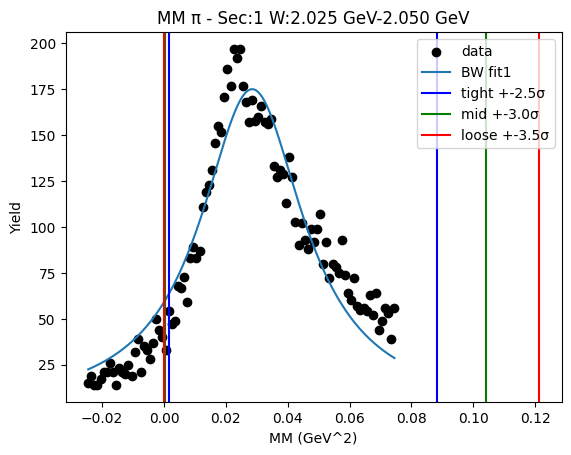

W bin: 26 2.050 GeV-2.075 GeV
initial bw fit:  [28.54860612  0.17181394  0.12621301]
W1_ini_pars: [28.54860612  0.17181394  0.12621301  3.07211428  0.3         0.06742853
  2.78458923  0.4         0.10165907]
Runtime Error2.1
	Just skip it for now


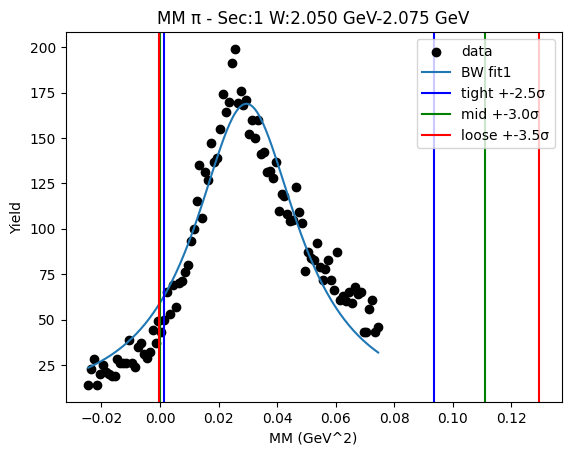

W bin: 27 2.075 GeV-2.100 GeV
initial bw fit:  [27.78385058  0.16793308  0.12033498]
W1_ini_pars: [27.78385058  0.16793308  0.12033498  3.07211428  0.3         0.06742853
  2.78458923  0.4         0.10165907]
Runtime Error2.1
	Just skip it for now


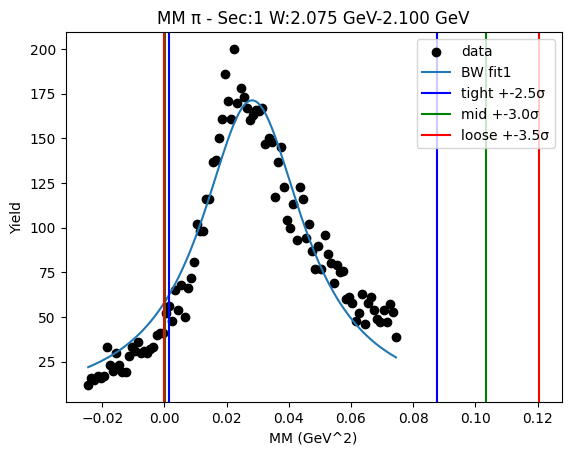

W bin: 28 2.100 GeV-2.125 GeV
initial bw fit:  [27.86475386  0.16876313  0.12332906]
W1_ini_pars: [27.86475386  0.16876313  0.12332906  3.07211428  0.3         0.06742853
  2.78458923  0.4         0.10165907]
Runtime Error2.1
	Just skip it for now


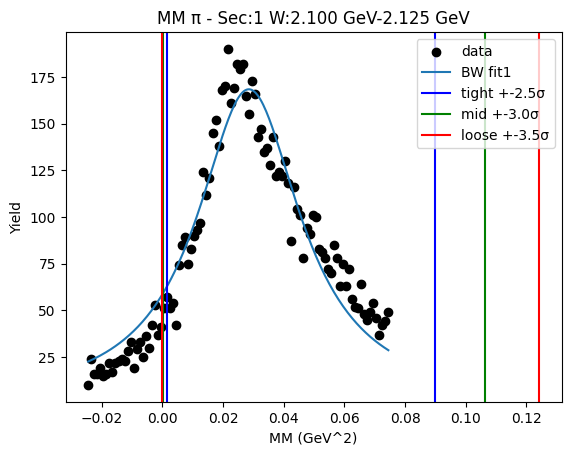

initial bw fit:  [1.10496377e+03 1.49887807e-01 1.33272478e-01]
-0.0029844593861307056 0.04327739975877455
Breit-Wigner Peak [7.30835933e+02 1.41938262e-01 8.78083701e-02]
Gaus2 [3.56285047e+02 4.00000000e-02 1.05061631e-02]
Gaus3 [1.57594011e+03 8.00000000e-02 7.04319402e-02]


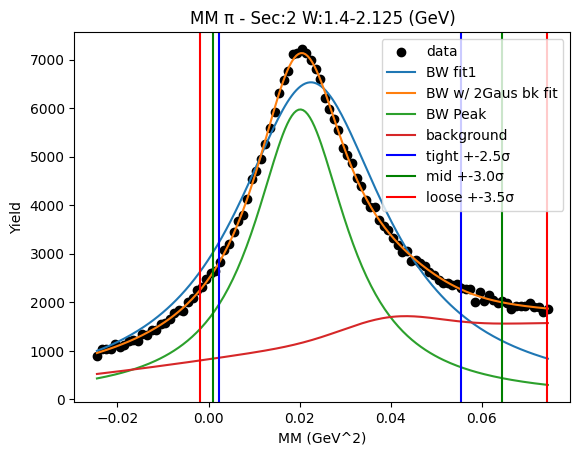

W bin: 1 1.425 GeV-1.450 GeV
initial bw fit:  [8.42792921 0.14435072 0.06854618]


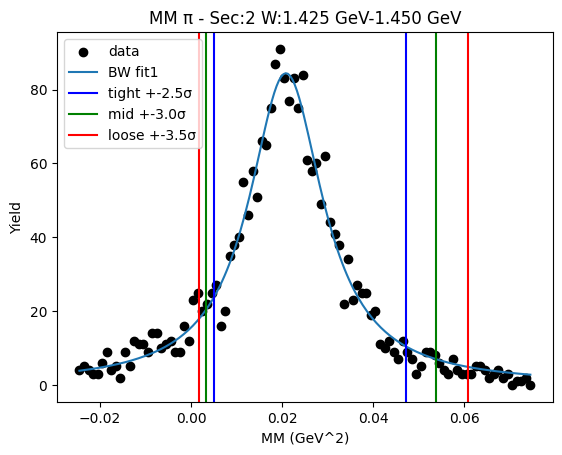

W bin: 2 1.450 GeV-1.475 GeV
initial bw fit:  [10.47044178  0.14550712  0.07078122]


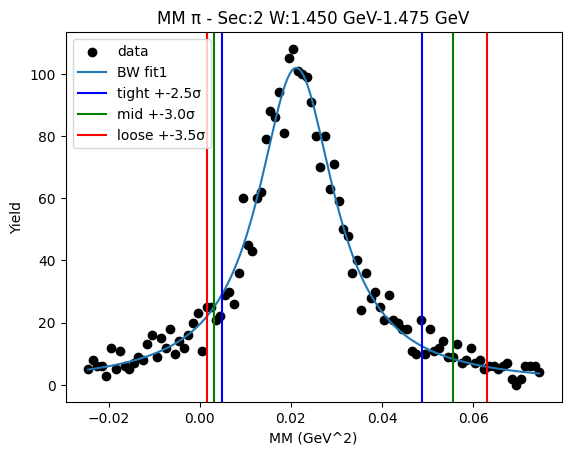

W bin: 3 1.475 GeV-1.500 GeV
initial bw fit:  [13.03323721  0.1467626   0.06982055]


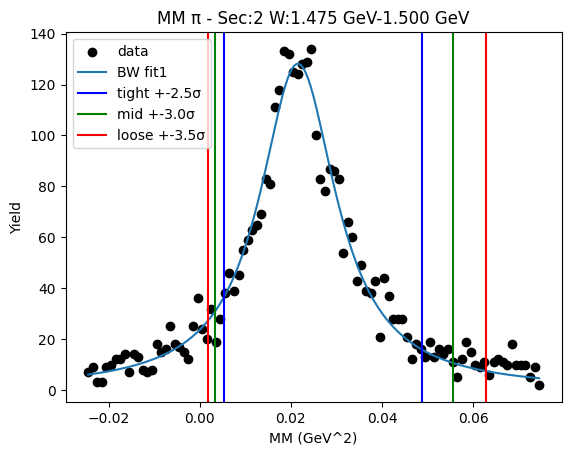

W bin: 4 1.500 GeV-1.525 GeV
initial bw fit:  [13.95837766  0.14938565  0.07286908]


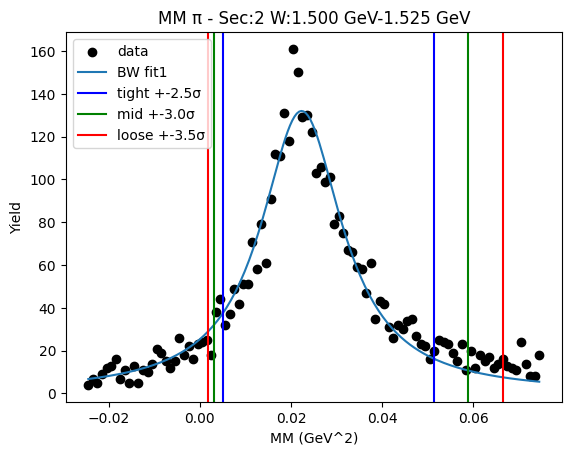

W bin: 5 1.525 GeV-1.550 GeV
initial bw fit:  [14.38478746  0.15036863  0.07917621]


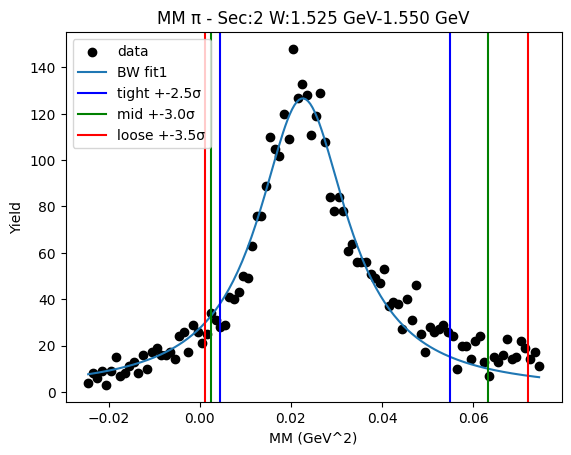

W bin: 6 1.550 GeV-1.575 GeV
initial bw fit:  [14.68572733  0.15141265  0.08440756]


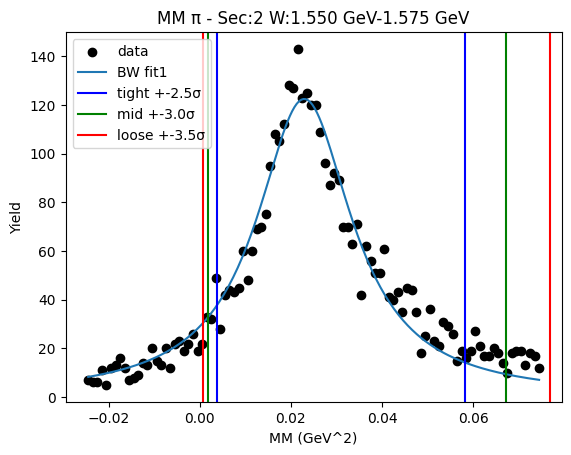

W bin: 7 1.575 GeV-1.600 GeV
initial bw fit:  [14.46289056  0.1508588   0.0875459 ]


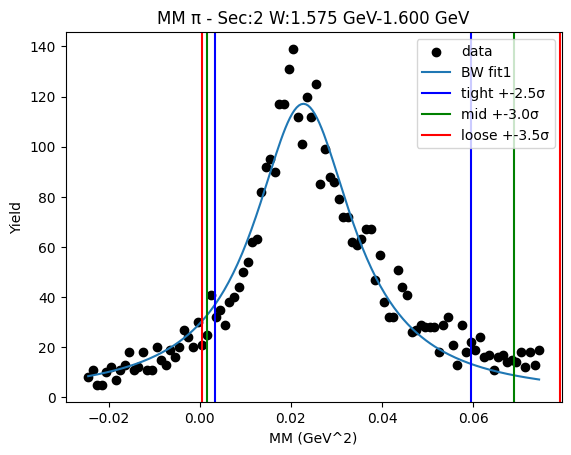

W bin: 8 1.600 GeV-1.625 GeV
initial bw fit:  [15.70778008  0.14728848  0.09042601]


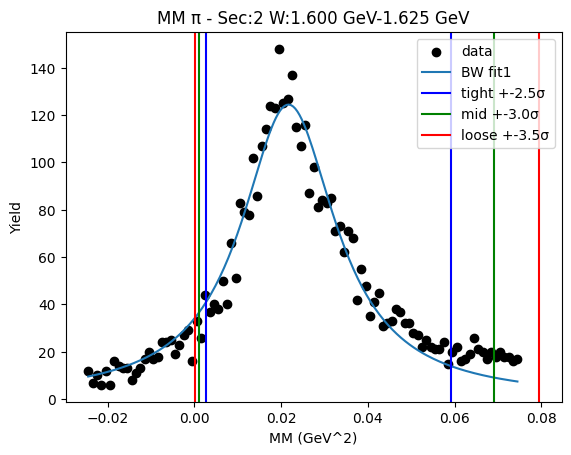

W bin: 9 1.625 GeV-1.650 GeV
initial bw fit:  [17.54252662  0.14750296  0.09313682]


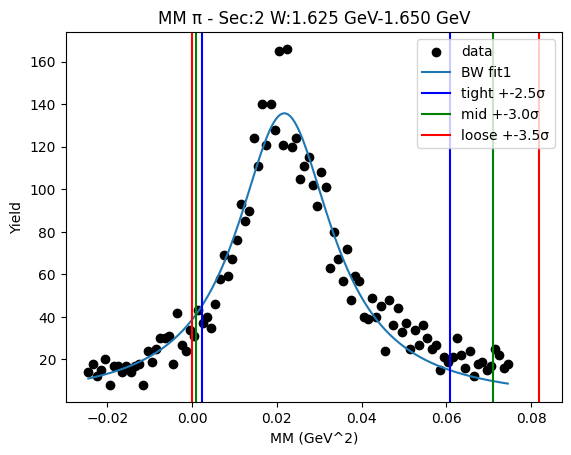

W bin: 10 1.650 GeV-1.675 GeV
initial bw fit:  [20.61463445  0.14726137  0.09230395]


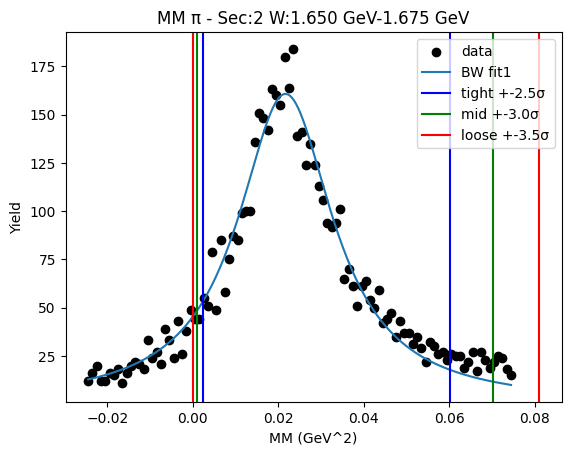

W bin: 11 1.675 GeV-1.700 GeV
initial bw fit:  [24.38387263  0.14483495  0.09676839]


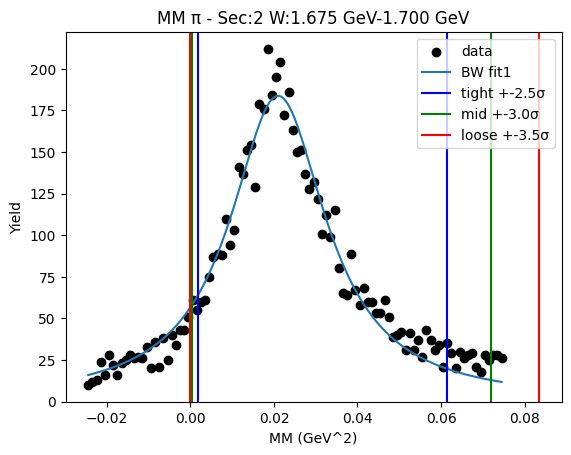

W bin: 12 1.700 GeV-1.725 GeV
initial bw fit:  [27.90215961  0.14718155  0.09405748]


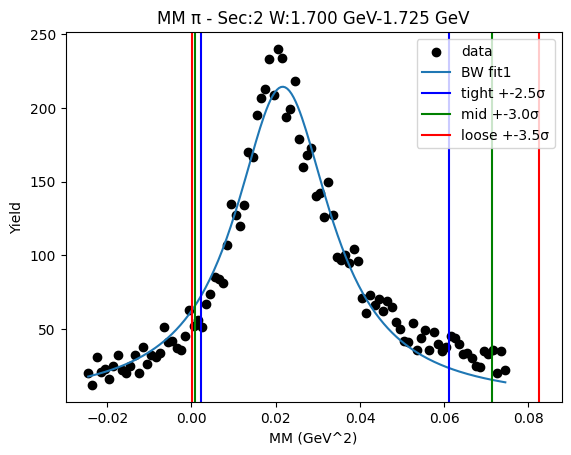

W bin: 13 1.725 GeV-1.750 GeV
initial bw fit:  [29.38093847  0.150057    0.09785811]


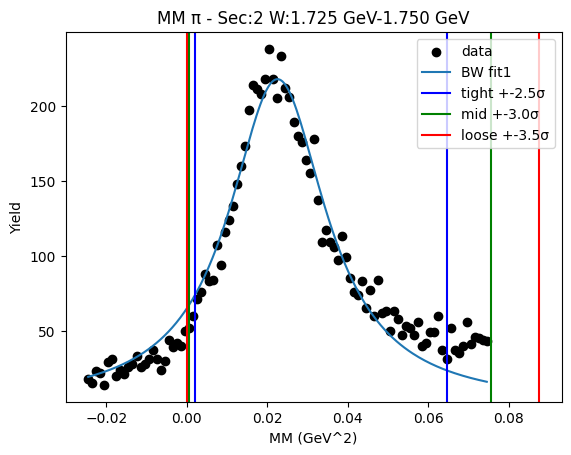

W bin: 14 1.750 GeV-1.775 GeV
initial bw fit:  [27.93893566  0.1494962   0.09438787]


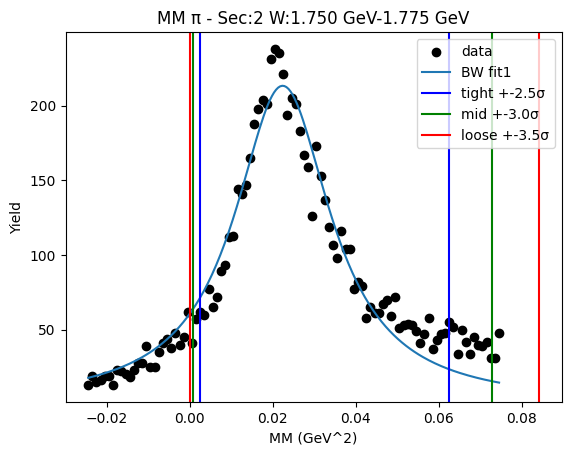

W bin: 15 1.775 GeV-1.800 GeV
initial bw fit:  [26.22293412  0.14920205  0.10629822]


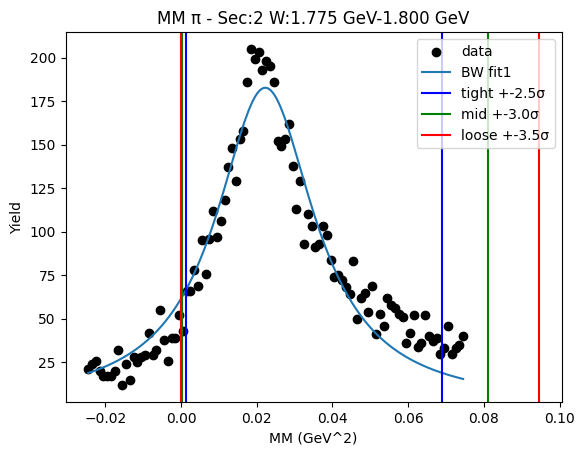

W bin: 16 1.800 GeV-1.825 GeV
initial bw fit:  [24.91785984  0.14999748  0.10640731]


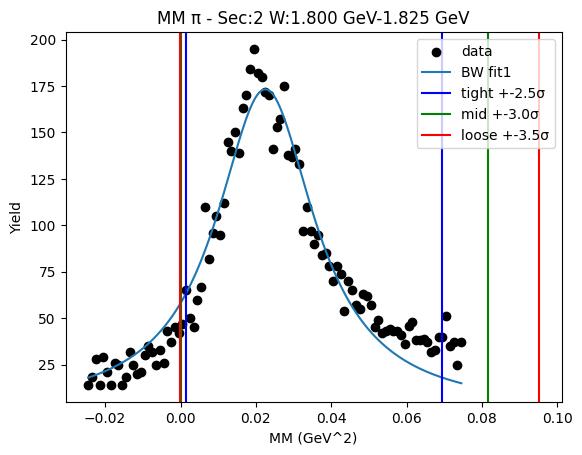

W bin: 17 1.825 GeV-1.850 GeV
initial bw fit:  [26.22788744  0.14925368  0.1173669 ]


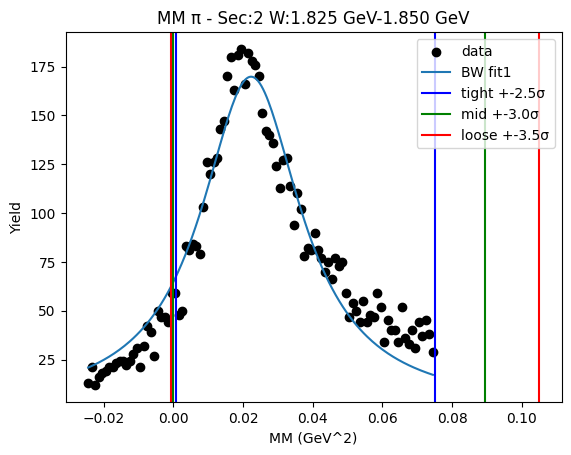

W bin: 18 1.850 GeV-1.875 GeV
initial bw fit:  [26.42276961  0.15032596  0.11636751]


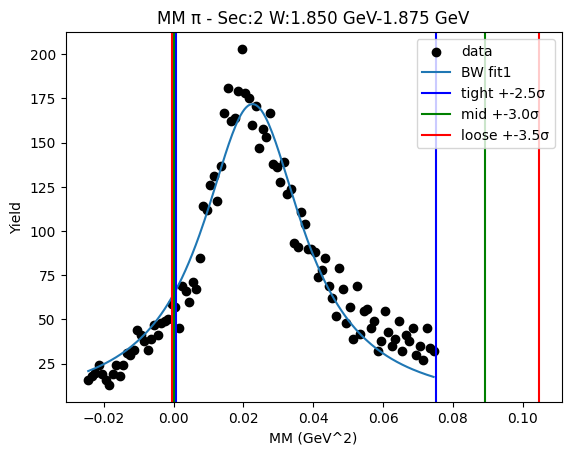

W bin: 19 1.875 GeV-1.900 GeV
initial bw fit:  [26.5047954   0.1480742   0.11834774]


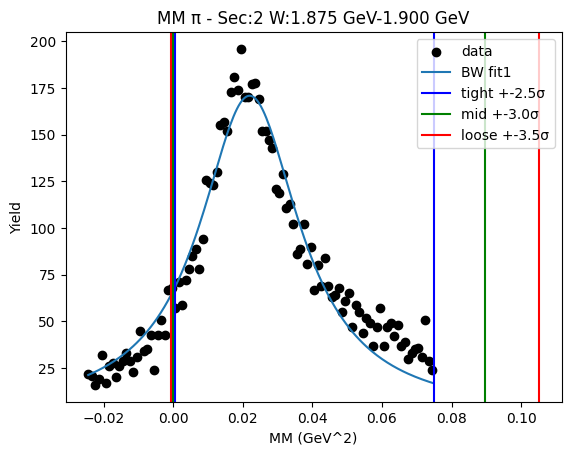

W bin: 20 1.900 GeV-1.925 GeV
initial bw fit:  [27.57267281  0.1482175   0.11910862]
W1_ini_pars: [27.57267281  0.1482175   0.11910862  3.07211428  0.3         0.06742853
  2.78458923  0.4         0.10165907]
-0.0035343203130193124 0.04434549001939468
Breit-Wigner Peak [21.08221746  0.14284812  0.08933067]
Gaus2 [1.41155794e+01 4.35037785e-02 3.06235880e-03]
Gaus3 [33.25388442  0.08        0.0581938 ]


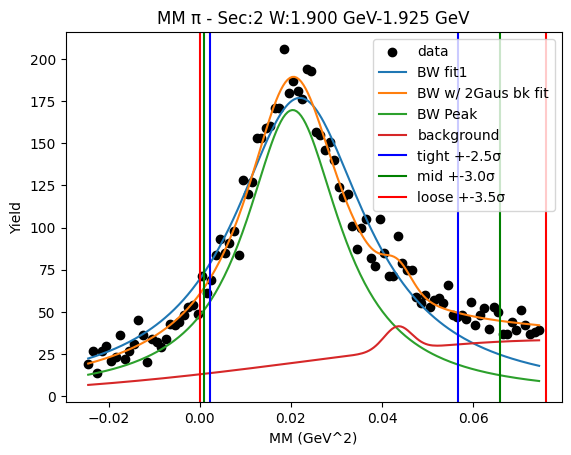

W bin: 21 1.925 GeV-1.950 GeV
initial bw fit:  [26.55205936  0.14874708  0.12014731]
W1_ini_pars: [2.65520594e+01 1.48747078e-01 1.20147307e-01 1.41155794e+01
 4.35037785e-02 3.06235880e-03 3.32538844e+01 8.00000000e-02
 5.81937971e-02]
-0.002522458727709641 0.04147479143510054
Breit-Wigner Peak [18.83465319  0.13955704  0.08563221]
Gaus2 [2.42003276e+01 4.00000000e-02 1.24543943e-02]
Gaus3 [24.30049062  0.08        0.07383452]


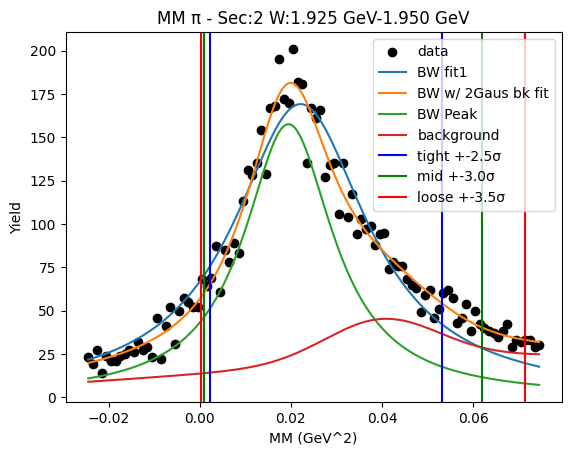

W bin: 22 1.950 GeV-1.975 GeV
initial bw fit:  [26.34427024  0.14945576  0.11662054]
W1_ini_pars: [2.63442702e+01 1.49455757e-01 1.16620545e-01 2.42003276e+01
 4.00000000e-02 1.24543943e-02 2.43004906e+01 8.00000000e-02
 7.38345236e-02]
-0.00525402011547799 0.0451628962800943
Breit-Wigner Peak [20.50832111  0.14126018  0.09166689]
Gaus2 [2.09182277e+01 4.00000042e-02 1.39394229e-02]
Gaus3 [7.62565584e+13 3.65790486e+00 4.72772100e-01]


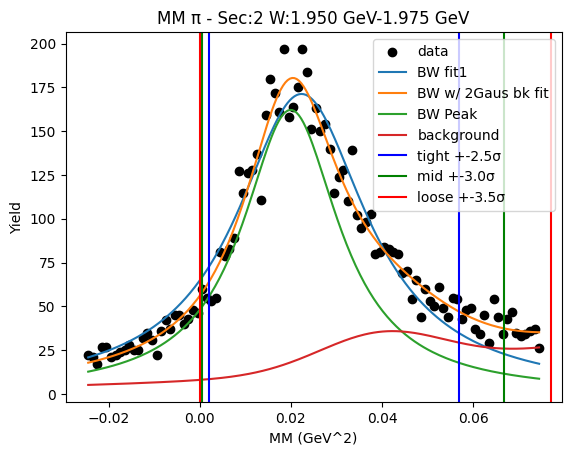

W bin: 23 1.975 GeV-2.000 GeV
initial bw fit:  [26.37984768  0.14827671  0.11537827]
W1_ini_pars: [2.63798477e+01 1.48276708e-01 1.15378268e-01 2.09182277e+01
 4.00000042e-02 1.39394229e-02 7.62565584e+13 3.65790486e+00
 4.72772100e-01]
-0.006112204557222348 0.046156431103092845
Breit-Wigner Peak [21.76482388  0.14149952  0.09333509]
Gaus2 [3.04072523e+01 5.48935641e-02 2.68826615e-02]
Gaus3 [7.59570573e+13 3.80912723e+00 4.74372687e-01]


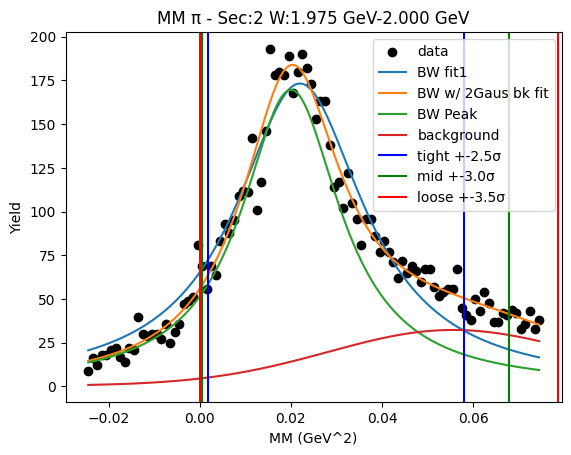

W bin: 24 2.000 GeV-2.025 GeV
initial bw fit:  [25.52505713  0.15126361  0.12149325]
W1_ini_pars: [2.55250571e+01 1.51263609e-01 1.21493254e-01 3.04072523e+01
 5.48935641e-02 2.68826615e-02 7.59570573e+13 3.80912723e+00
 4.74372687e-01]
-0.015810519809102665 0.05813814724662518
Breit-Wigner Peak [24.44219742  0.14547788  0.11101702]
Gaus2 [3.05266399e+01 8.20345336e-02 2.68171147e-02]
Gaus3 [7.59627084e+13 1.14258930e+03 4.74311479e-01]


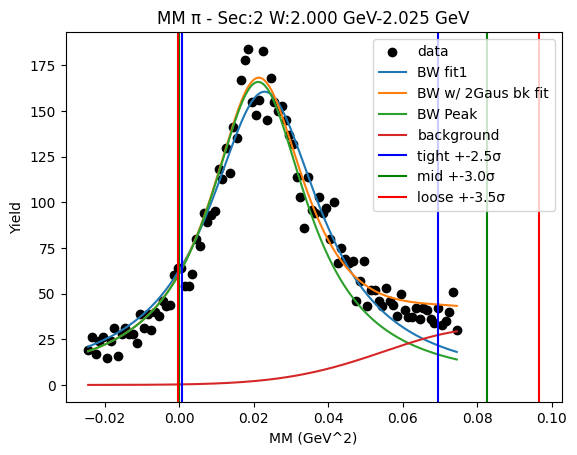

W bin: 25 2.025 GeV-2.050 GeV
initial bw fit:  [24.61036071  0.15022477  0.12622086]
W1_ini_pars: [2.46103607e+01 1.50224770e-01 1.26220861e-01 3.05266399e+01
 8.20345336e-02 2.68171147e-02 7.59627084e+13 1.14258930e+03
 4.74311479e-01]
-0.025905956047684028 0.06885482875697259
Breit-Wigner Peak [24.60883093  0.14654159  0.12567205]
Gaus2 [3.05263256e+01 9.25458552e-02 2.64828372e-02]
Gaus3 [7.59627084e+13 1.14258930e+03 4.74311479e-01]


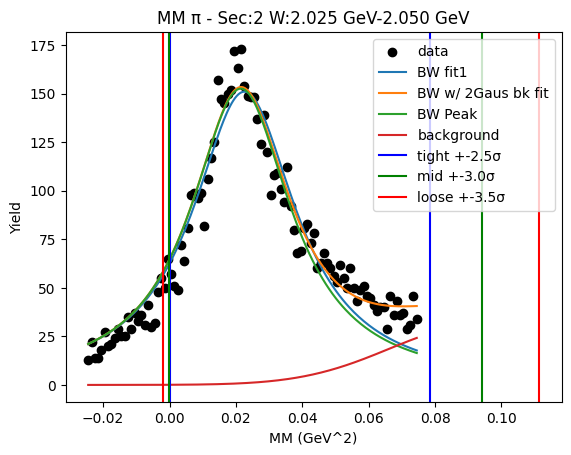

W bin: 26 2.050 GeV-2.075 GeV
initial bw fit:  [24.46600108  0.14759782  0.12744711]
W1_ini_pars: [2.44660011e+01 1.47597816e-01 1.27447113e-01 3.05263256e+01
 9.25458552e-02 2.64828372e-02 7.59627084e+13 1.14258930e+03
 4.74311479e-01]
-0.0272923052303911 0.06939857660681761
Breit-Wigner Peak [24.4650503   0.14509699  0.12694545]
Gaus2 [3.05262279e+01 9.71561833e-02 2.63005826e-02]
Gaus3 [7.59627084e+13 1.14258930e+03 4.74311479e-01]


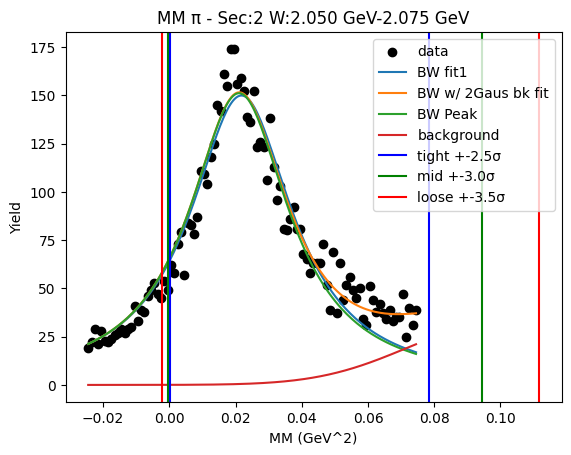

W bin: 27 2.075 GeV-2.100 GeV
initial bw fit:  [23.57888454  0.14777475  0.12330502]
W1_ini_pars: [2.35788845e+01 1.47774753e-01 1.23305016e-01 3.05262279e+01
 9.71561833e-02 2.63005826e-02 7.59627084e+13 1.14258930e+03
 4.74311479e-01]
-0.023775003312597787 0.06744975837161356
Breit-Wigner Peak [23.57888454  0.14777475  0.12330502]
Gaus2 [3.05262279e+01 9.71561833e-02 2.63005826e-02]
Gaus3 [7.59627084e+13 1.14258930e+03 4.74311479e-01]


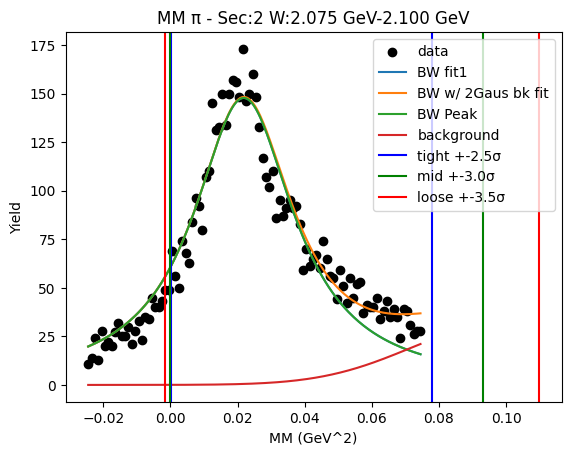

W bin: 28 2.100 GeV-2.125 GeV
initial bw fit:  [23.21631372  0.14870581  0.13379472]
W1_ini_pars: [2.32163137e+01 1.48705805e-01 1.33794721e-01 3.05262279e+01
 9.71561833e-02 2.63005826e-02 7.59627084e+13 1.14258930e+03
 4.74311479e-01]
-0.03187635013355517 0.07472060448908116
Breit-Wigner Peak [23.21542814  0.146363    0.13328976]
Gaus2 [3.05261650e+01 1.00425031e-01 2.61615475e-02]
Gaus3 [7.59627084e+13 1.14258930e+03 4.74311479e-01]


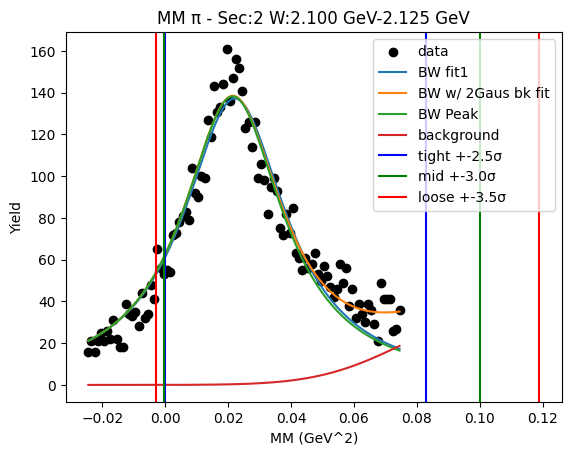

initial bw fit:  [1.11025599e+03 1.49735380e-01 1.18819252e-01]
0.0022005083067136097 0.03807510867912978
Breit-Wigner Peak [7.40192958e+02 1.41907746e-01 7.73246407e-02]
Gaus2 [5.50264357e+02 4.00000000e-02 1.01733225e-02]
Gaus3 [1.59662979e+03 8.00000000e-02 6.50818654e-02]


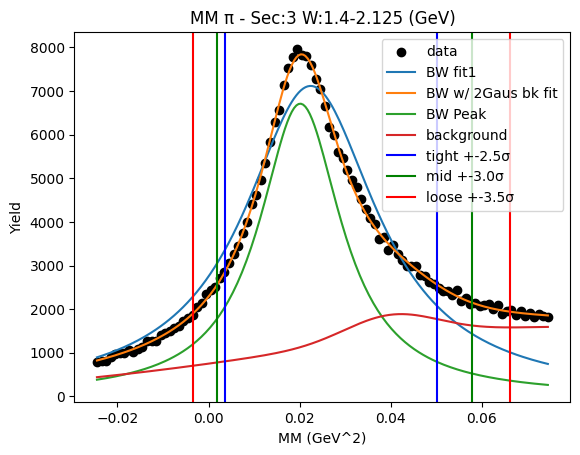

W bin: 1 1.425 GeV-1.450 GeV
initial bw fit:  [9.97261928 0.1411517  0.0520805 ]


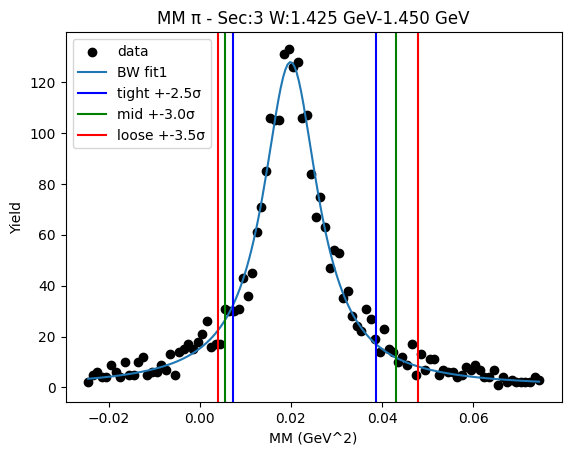

W bin: 2 1.450 GeV-1.475 GeV
initial bw fit:  [12.54364741  0.14201343  0.05291567]


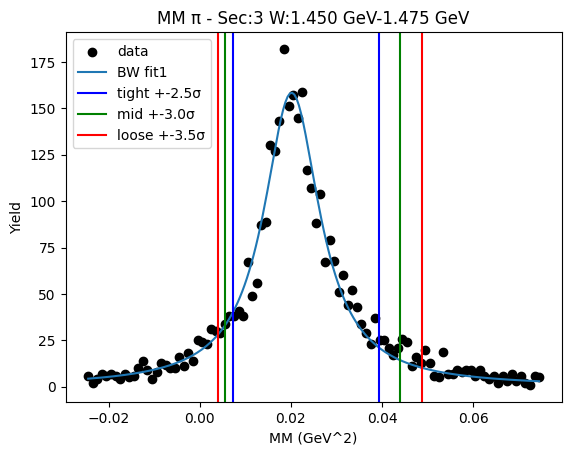

W bin: 3 1.475 GeV-1.500 GeV
initial bw fit:  [14.91986199  0.14286816  0.05832451]


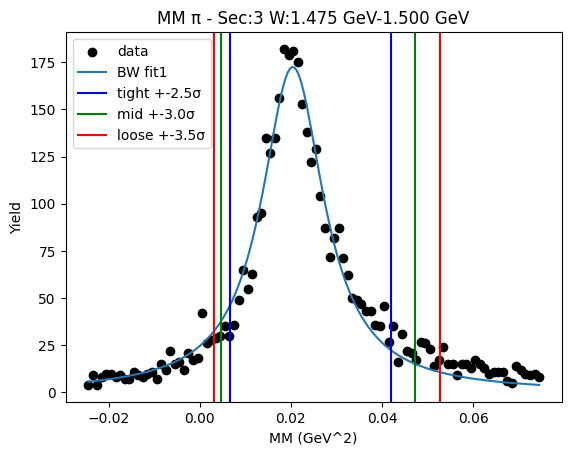

W bin: 4 1.500 GeV-1.525 GeV
initial bw fit:  [17.36100793  0.14387177  0.06214363]


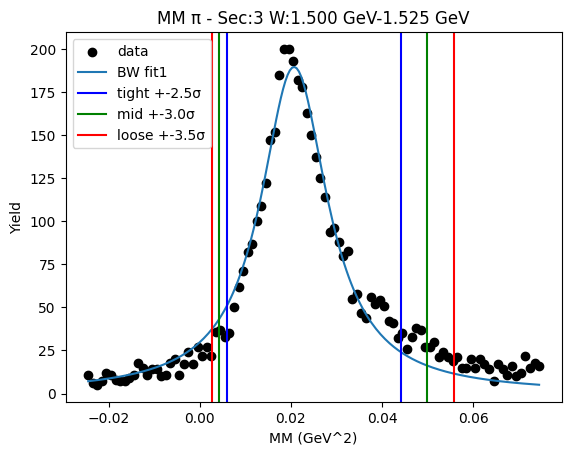

W bin: 5 1.525 GeV-1.550 GeV
initial bw fit:  [17.317797    0.14666436  0.06649276]


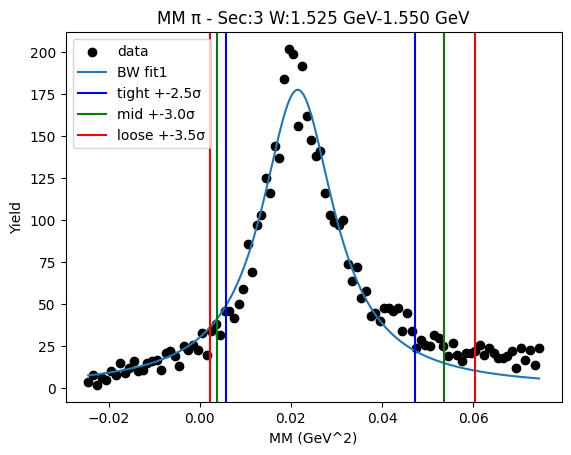

W bin: 6 1.550 GeV-1.575 GeV
initial bw fit:  [17.78188368  0.14652315  0.07371186]


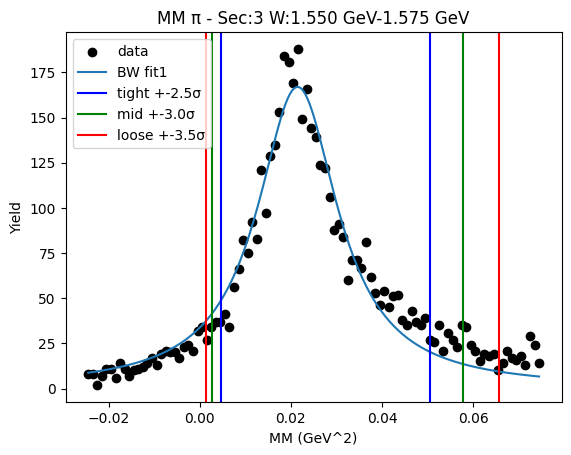

W bin: 7 1.575 GeV-1.600 GeV
initial bw fit:  [17.6108772   0.14570346  0.07840818]


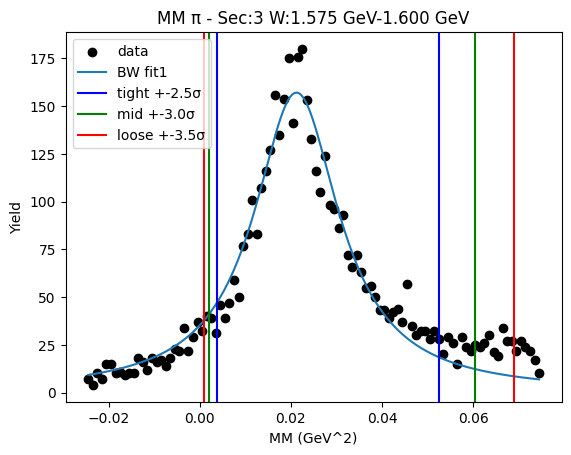

W bin: 8 1.600 GeV-1.625 GeV
initial bw fit:  [18.38954487  0.14675894  0.07628891]


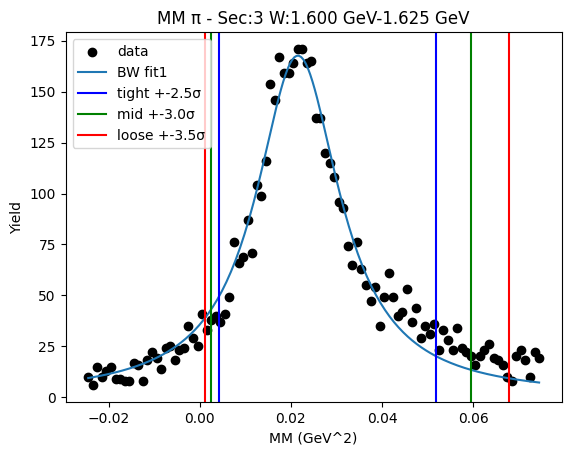

W bin: 9 1.625 GeV-1.650 GeV
initial bw fit:  [20.18608785  0.14438807  0.07667406]


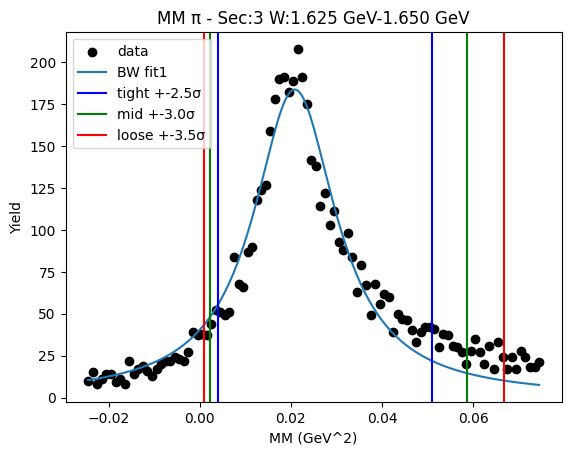

W bin: 10 1.650 GeV-1.675 GeV
initial bw fit:  [23.94692476  0.14258068  0.08070256]


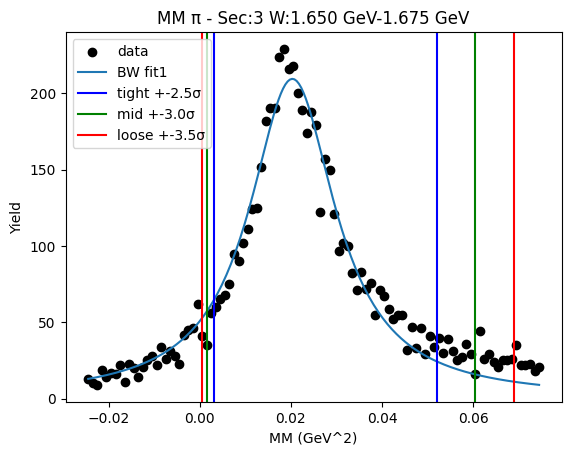

W bin: 11 1.675 GeV-1.700 GeV
initial bw fit:  [28.19255483  0.14458975  0.08317505]


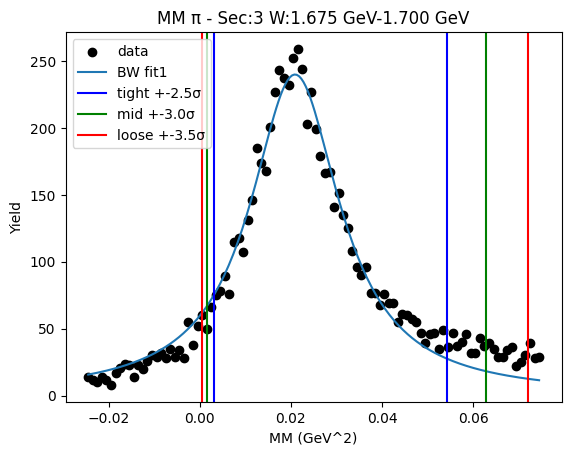

W bin: 12 1.700 GeV-1.725 GeV
initial bw fit:  [32.05276931  0.1458611   0.08178333]


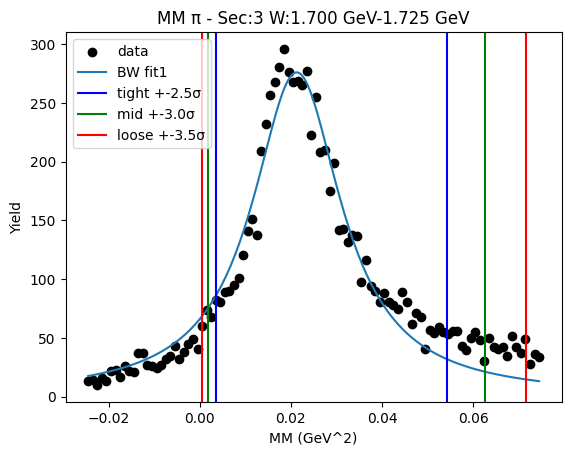

W bin: 13 1.725 GeV-1.750 GeV
initial bw fit:  [32.04211221  0.1481413   0.08920768]


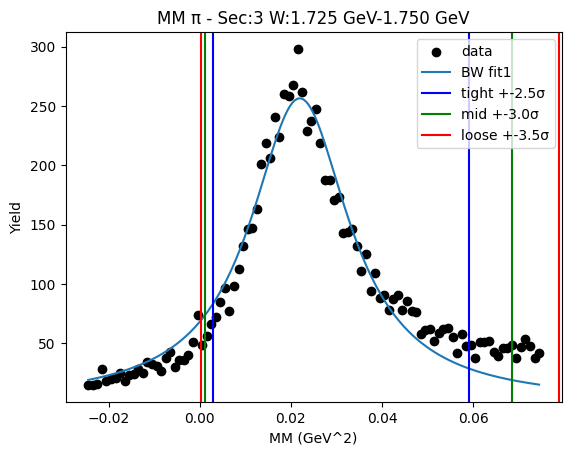

W bin: 14 1.750 GeV-1.775 GeV
initial bw fit:  [29.73615589  0.15017751  0.09990728]


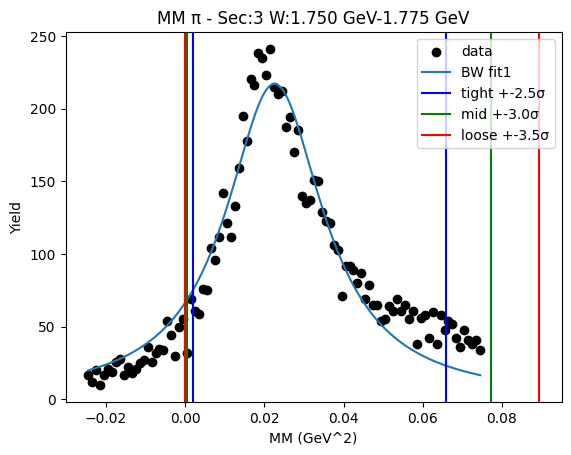

W bin: 15 1.775 GeV-1.800 GeV
initial bw fit:  [27.78877587  0.1498282   0.09917997]


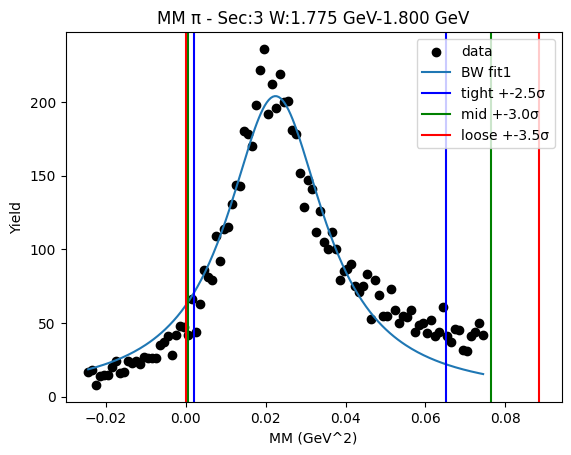

W bin: 16 1.800 GeV-1.825 GeV
initial bw fit:  [26.6610402   0.15005771  0.10472704]


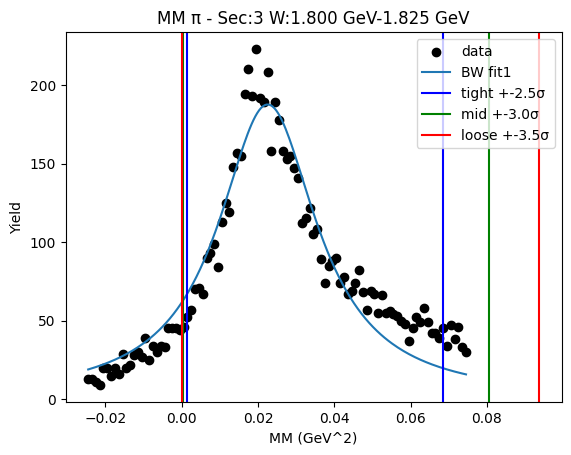

W bin: 17 1.825 GeV-1.850 GeV
initial bw fit:  [26.47795182  0.15027181  0.10504686]


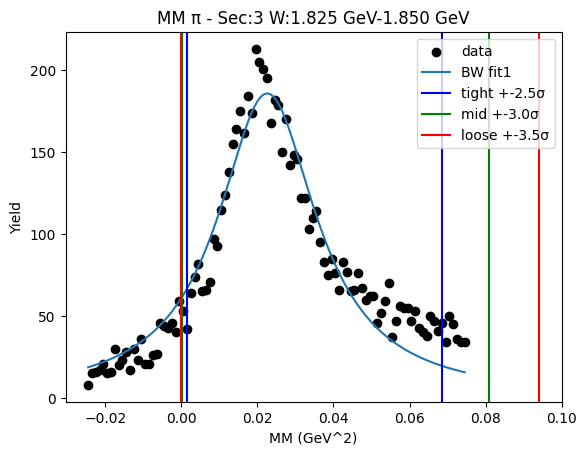

W bin: 18 1.850 GeV-1.875 GeV
initial bw fit:  [26.43010382  0.14978742  0.10475168]


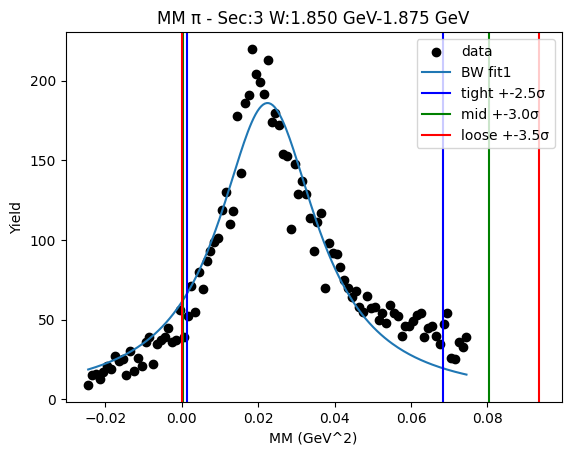

W bin: 19 1.875 GeV-1.900 GeV
initial bw fit:  [26.59844756  0.15093691  0.10427894]


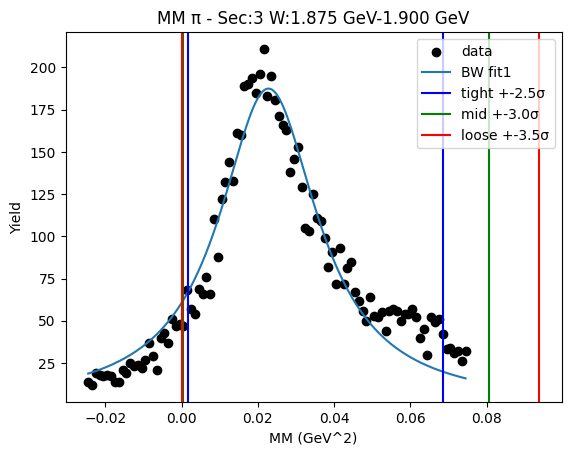

W bin: 20 1.900 GeV-1.925 GeV
initial bw fit:  [25.80264535  0.15066967  0.11141473]
W1_ini_pars: [25.80264535  0.15066967  0.11141473  3.07211428  0.3         0.06742853
  2.78458923  0.4         0.10165907]
-0.004096733337643675 0.044887296695256734
Breit-Wigner Peak [21.64701383  0.14281205  0.09035488]
Gaus2 [2.86259464e+01 4.57570564e-02 1.77476251e-02]
Gaus3 [2.05062765e+01 8.00000000e-02 1.74770628e-02]


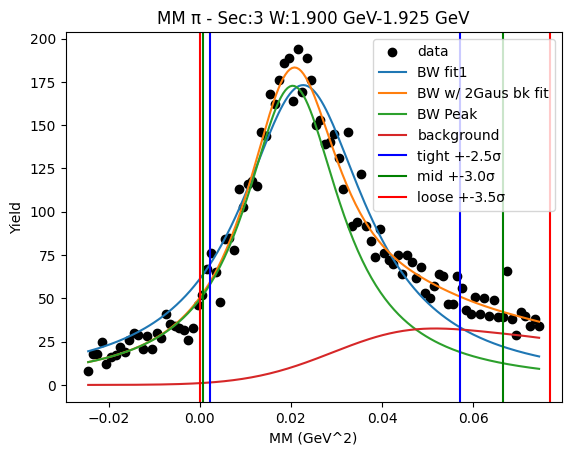

W bin: 21 1.925 GeV-1.950 GeV
initial bw fit:  [26.08622322  0.15056309  0.10900969]
W1_ini_pars: [2.60862232e+01 1.50563087e-01 1.09009691e-01 2.86259464e+01
 4.57570564e-02 1.77476251e-02 2.05062765e+01 8.00000000e-02
 1.74770628e-02]
0.0032443691528399876 0.03749102295952541
Breit-Wigner Peak [16.71712333  0.14271544  0.07554982]
Gaus2 [4.69039110e+01 4.00000172e-02 2.86864113e-02]
Gaus3 [19.72323117  7.84188636  0.20466977]


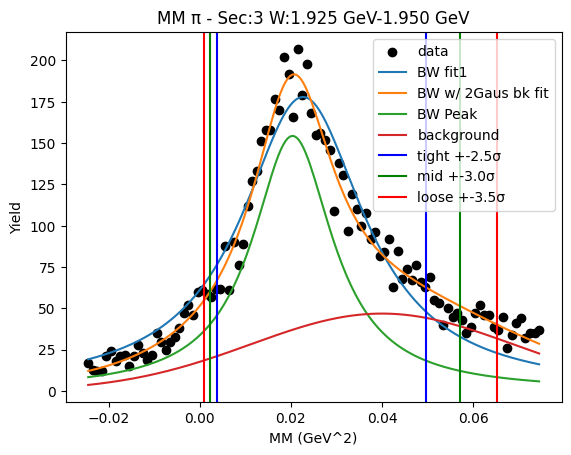

W bin: 22 1.950 GeV-1.975 GeV
initial bw fit:  [25.4707618   0.15076306  0.11017312]
W1_ini_pars: [2.54707618e+01 1.50763058e-01 1.10173124e-01 4.69039110e+01
 4.00000172e-02 2.86864113e-02 1.97232312e+01 7.84188636e+00
 2.04669767e-01]
-0.001573928952917008 0.042335633468141315
Breit-Wigner Peak [19.41161623  0.14276152  0.08554683]
Gaus2 [3.65830791e+01 4.89989201e-02 2.72122544e-02]
Gaus3 [19.72323117  7.84188636  0.20466977]


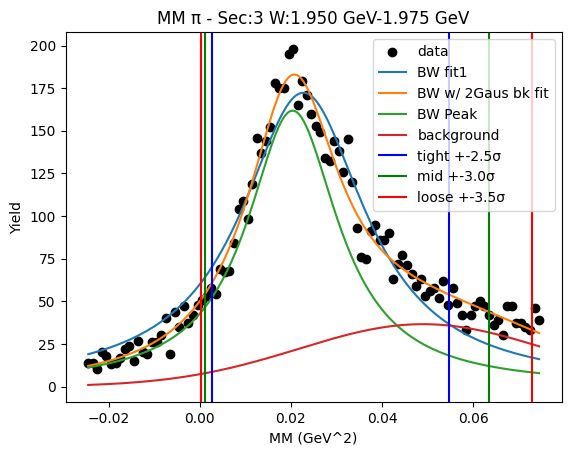

W bin: 23 1.975 GeV-2.000 GeV
initial bw fit:  [24.17525784  0.15010638  0.11412353]
W1_ini_pars: [2.41752578e+01 1.50106375e-01 1.14123528e-01 3.65830791e+01
 4.89989201e-02 2.72122544e-02 1.97232312e+01 7.84188636e+00
 2.04669767e-01]
-0.002741329118878092 0.04440436725829035
Breit-Wigner Peak [18.58923777  0.14433128  0.0886432 ]
Gaus2 [29.93819818  0.05836815  0.03888147]
Gaus3 [19.72323117  7.84188636  0.20466977]


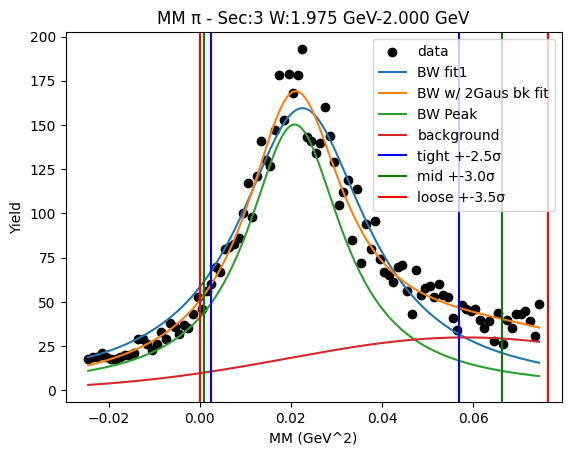

W bin: 24 2.000 GeV-2.025 GeV
initial bw fit:  [22.91163653  0.15062308  0.10987085]
W1_ini_pars: [22.91163653  0.15062308  0.10987085 29.93819818  0.05836815  0.03888147
 19.72323117  7.84188636  0.20466977]
-0.005527735235035611 0.04787094704799878
Breit-Wigner Peak [19.94932842  0.14550466  0.09433865]
Gaus2 [22.84291419  0.061068    0.02810723]
Gaus3 [19.72323117  7.84188636  0.20466977]


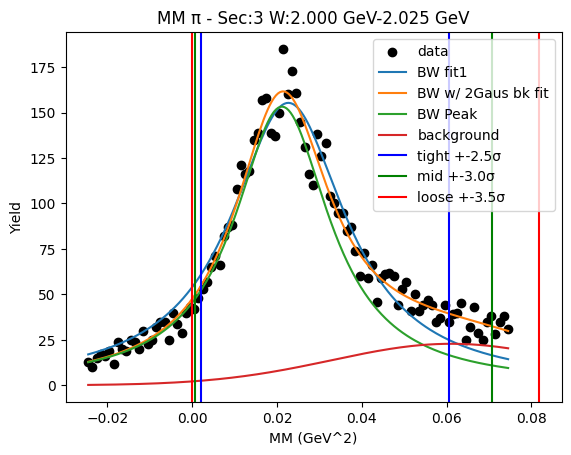

W bin: 25 2.025 GeV-2.050 GeV
initial bw fit:  [22.79444157  0.15051013  0.1181017 ]
W1_ini_pars: [22.79444157  0.15051013  0.1181017  22.84291419  0.061068    0.02810723
 19.72323117  7.84188636  0.20466977]
-0.008870359547409664 0.05031079319338537
Breit-Wigner Peak [19.40088986  0.14394519  0.09931528]
Gaus2 [25.36403957  0.06395146  0.03118589]
Gaus3 [19.72323117  7.84188636  0.20466977]


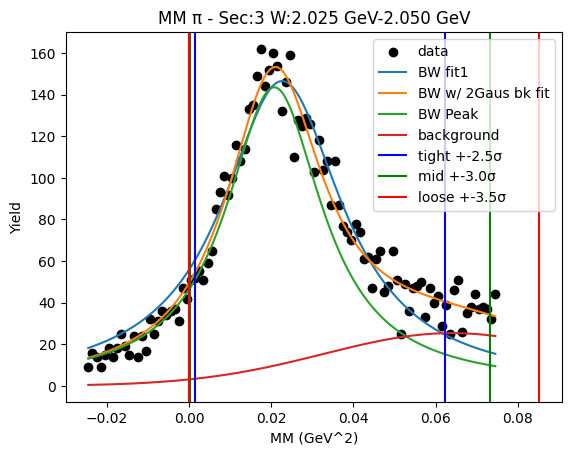

W bin: 26 2.050 GeV-2.075 GeV
initial bw fit:  [22.16592911  0.14906369  0.11474485]
W1_ini_pars: [22.16592911  0.14906369  0.11474485 25.36403957  0.06395146  0.03118589
 19.72323117  7.84188636  0.20466977]
0.00017498935529756954 0.04055190278469638
Breit-Wigner Peak [15.22113521  0.14270055  0.08203344]
Gaus2 [32.73121016  0.04588884  0.03572954]
Gaus3 [19.72323117  7.84188636  0.20466977]


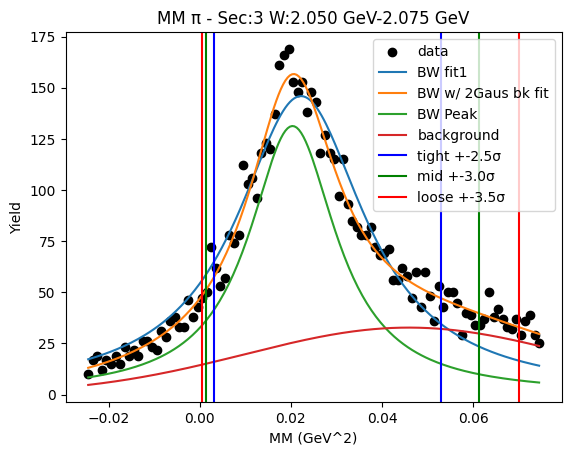

W bin: 27 2.075 GeV-2.100 GeV
initial bw fit:  [21.46777217  0.1510225   0.12633381]
W1_ini_pars: [21.46777217  0.1510225   0.12633381 32.73121016  0.04588884  0.03572954
 19.72323117  7.84188636  0.20466977]
-0.010093948079563243 0.04952695521528815
Breit-Wigner Peak [16.31893196  0.14041547  0.09968359]
Gaus2 [3.11574705e+01 4.86130353e-02 2.68346005e-02]
Gaus3 [19.72323117  7.84188636  0.20466977]


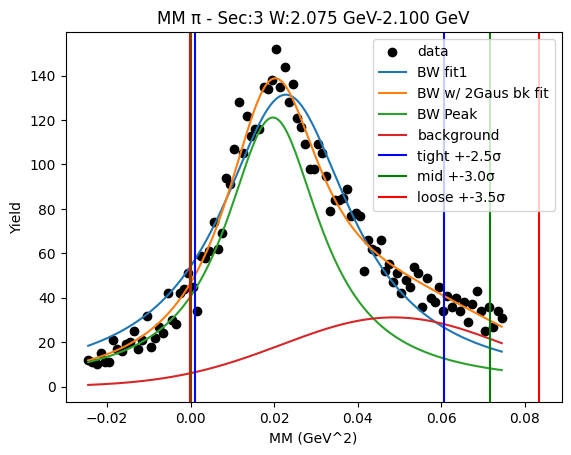

W bin: 28 2.100 GeV-2.125 GeV
initial bw fit:  [21.0810338   0.14921625  0.12348986]
W1_ini_pars: [2.10810338e+01 1.49216248e-01 1.23489860e-01 3.11574705e+01
 4.86130353e-02 2.68346005e-02 1.97232312e+01 7.84188636e+00
 2.04669767e-01]
-0.009910647682934141 0.05001311497564252
Breit-Wigner Peak [17.03559951  0.14160238  0.09993645]
Gaus2 [25.33398437  0.05775598  0.03207977]
Gaus3 [19.72323117  7.84188636  0.20466977]


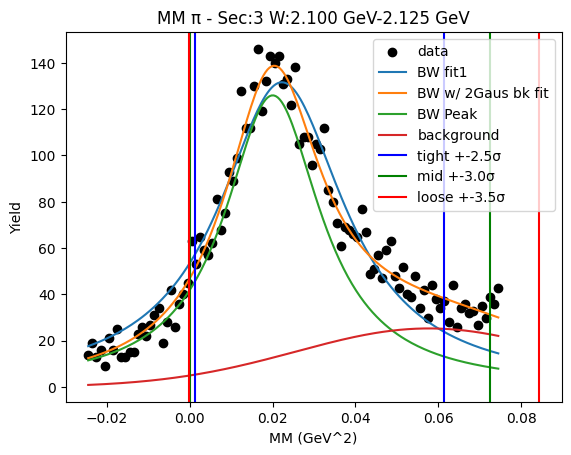

initial bw fit:  [6.42388156e+02 1.62013815e-01 1.42378017e-01]
-0.01194723820272955 0.05922489593090459
Breit-Wigner Peak [4.72623783e+02 1.53749240e-01 1.08912912e-01]
Gaus2 [5.68848978e+02 1.93137044e+02 5.04702839e-01]
Gaus3 [8.73222089e+02 8.00000000e-02 5.65929764e-02]


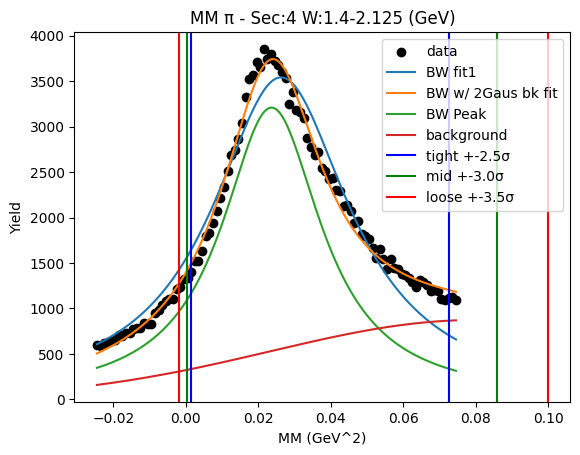

W bin: 1 1.425 GeV-1.450 GeV
initial bw fit:  [0.21727452 0.13783694 0.04971222]


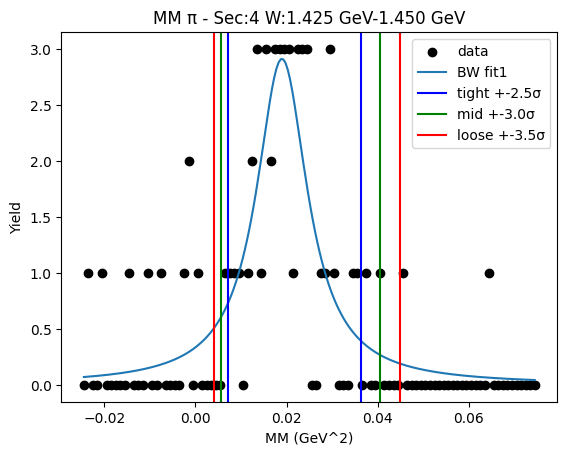

W bin: 2 1.450 GeV-1.475 GeV
initial bw fit:  [0.21968214 0.14157071 0.05376223]


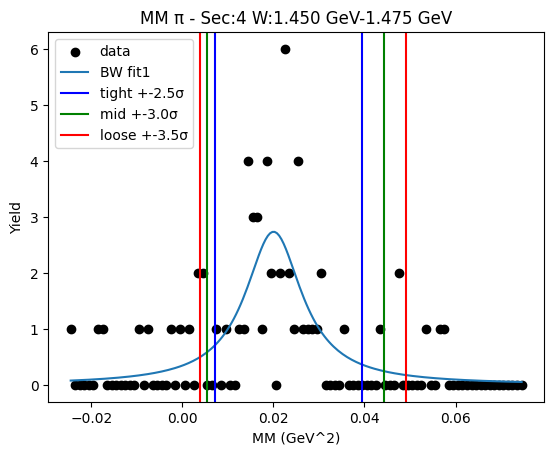

W bin: 3 1.475 GeV-1.500 GeV
initial bw fit:  [0.35566449 0.14264156 0.05547154]


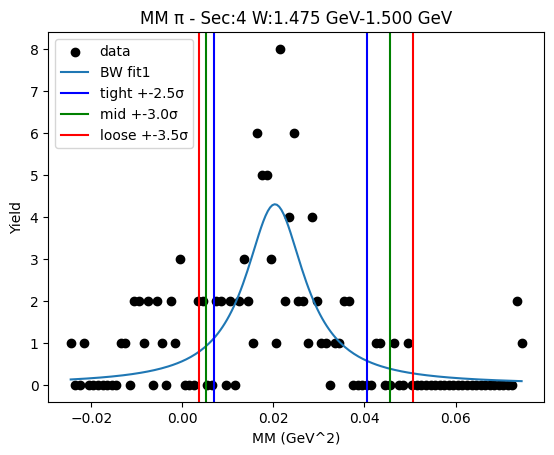

W bin: 4 1.500 GeV-1.525 GeV
initial bw fit:  [0.3527471  0.14422811 0.0449606 ]


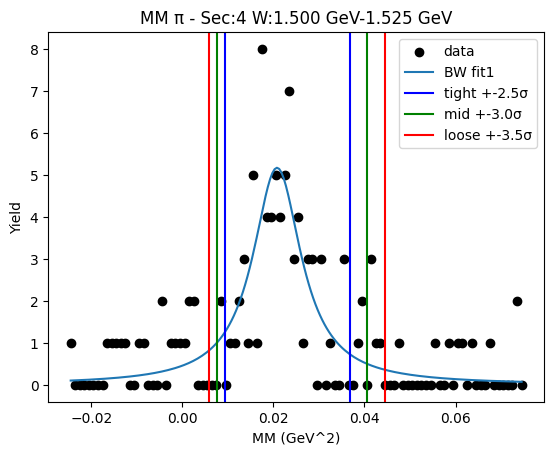

W bin: 5 1.525 GeV-1.550 GeV
initial bw fit:  [0.49114967 0.13684986 0.08498535]


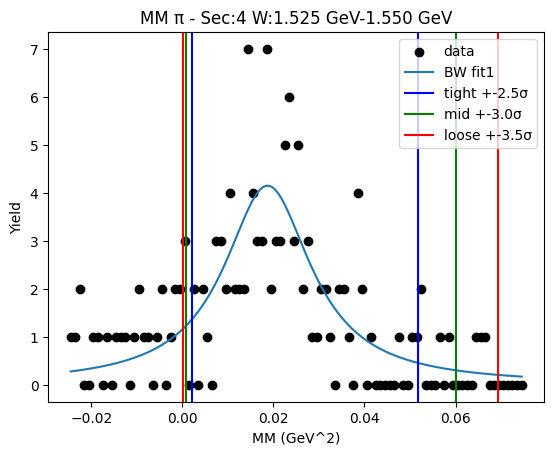

W bin: 6 1.550 GeV-1.575 GeV
initial bw fit:  [0.58414096 0.14275209 0.07169188]


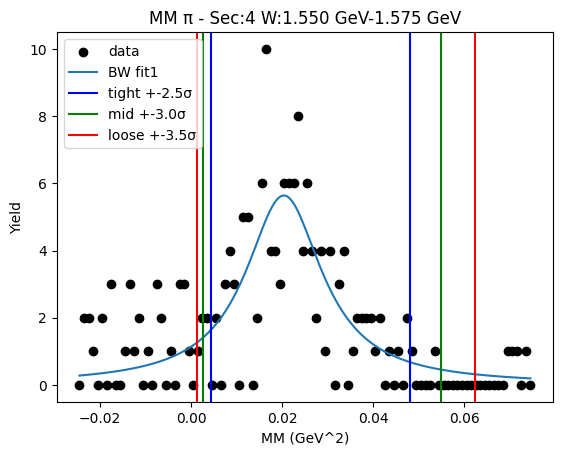

W bin: 7 1.575 GeV-1.600 GeV
initial bw fit:  [0.77031752 0.14975522 0.11259001]


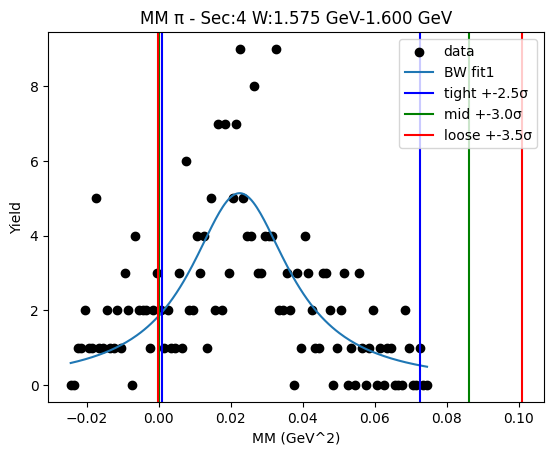

W bin: 8 1.600 GeV-1.625 GeV
initial bw fit:  [1.19477381 0.14542273 0.09024246]


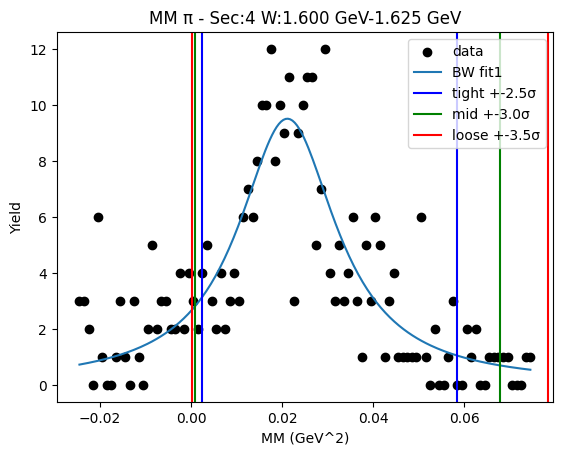

W bin: 9 1.625 GeV-1.650 GeV
initial bw fit:  [2.01904641 0.15652496 0.10642483]


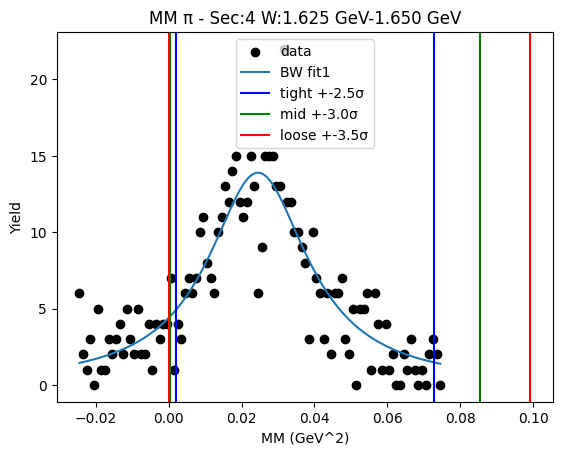

W bin: 10 1.650 GeV-1.675 GeV
initial bw fit:  [2.9225736  0.15984916 0.11166413]


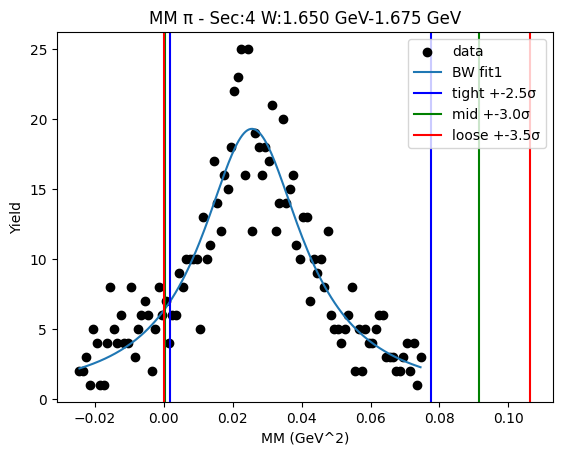

W bin: 11 1.675 GeV-1.700 GeV
initial bw fit:  [4.46751286 0.16398066 0.10610598]


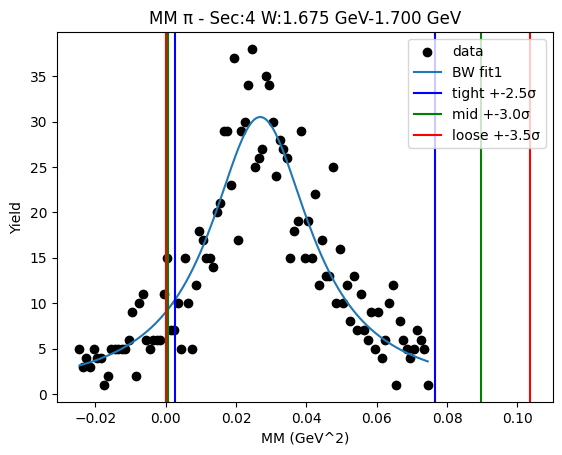

W bin: 12 1.700 GeV-1.725 GeV
initial bw fit:  [6.46277923 0.16261665 0.10703138]


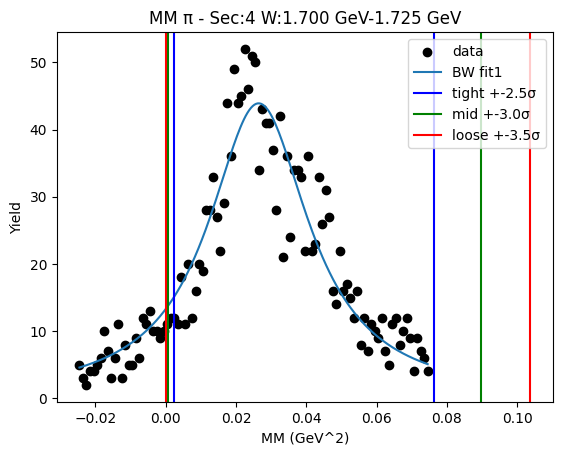

W bin: 13 1.725 GeV-1.750 GeV
initial bw fit:  [7.32596606 0.16851795 0.09945255]


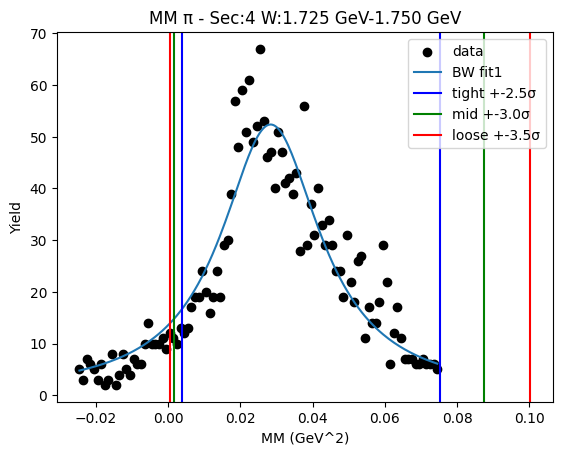

W bin: 14 1.750 GeV-1.775 GeV
initial bw fit:  [8.42812548 0.16888983 0.10640688]


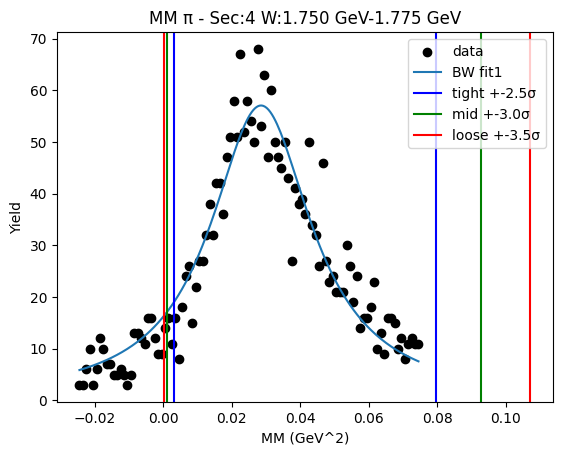

W bin: 15 1.775 GeV-1.800 GeV
initial bw fit:  [9.22546215 0.17405998 0.10577429]


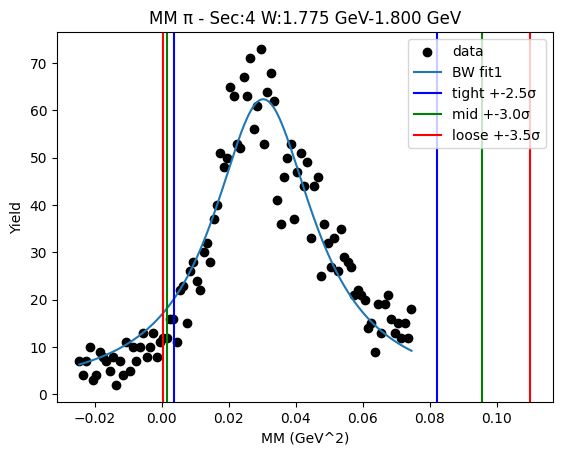

W bin: 16 1.800 GeV-1.825 GeV
initial bw fit:  [9.47073522 0.170501   0.1034203 ]


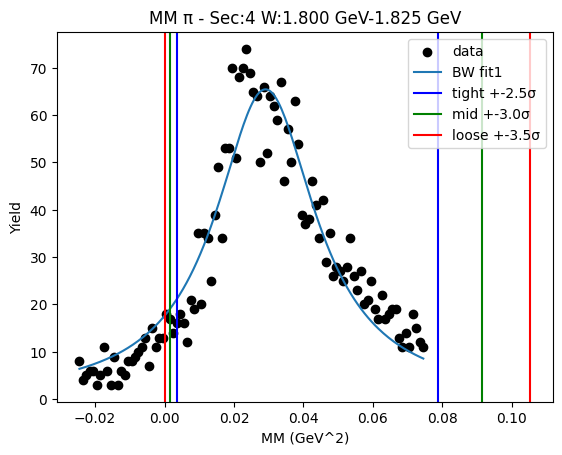

W bin: 17 1.825 GeV-1.850 GeV
initial bw fit:  [10.56200693  0.16942242  0.10879247]


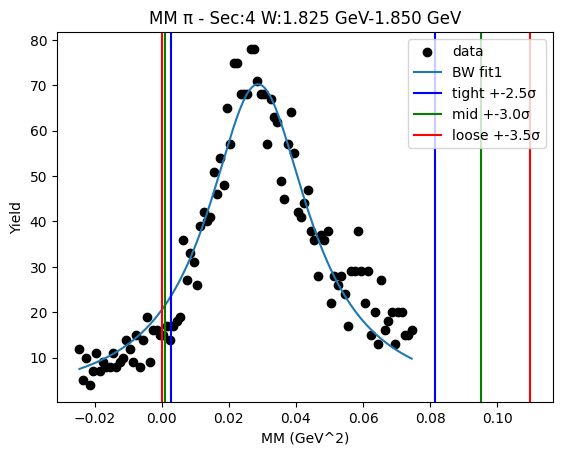

W bin: 18 1.850 GeV-1.875 GeV
initial bw fit:  [11.78198536  0.16824972  0.10951022]


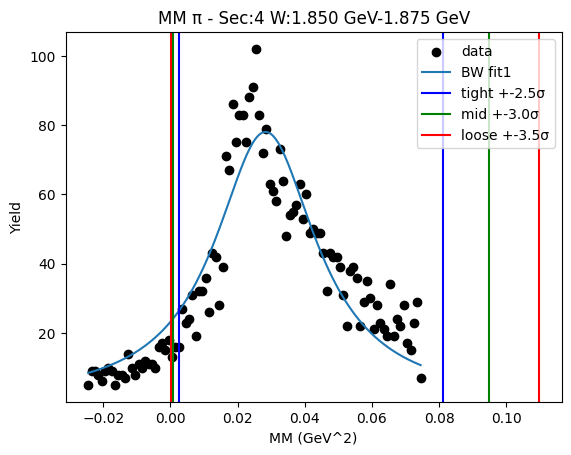

W bin: 19 1.875 GeV-1.900 GeV
initial bw fit:  [12.7242393   0.17134644  0.11325312]


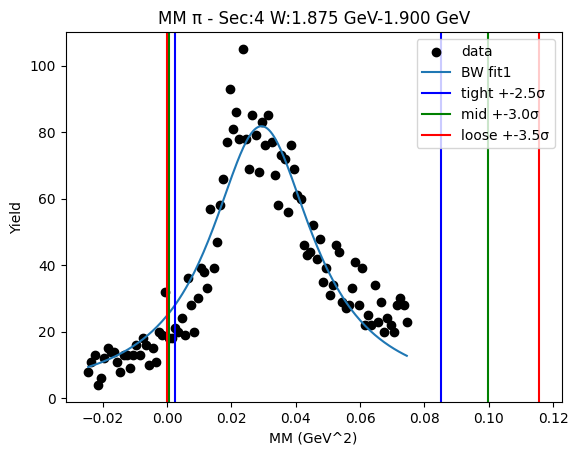

W bin: 20 1.900 GeV-1.925 GeV
initial bw fit:  [14.16965535  0.16721246  0.10901772]
W1_ini_pars: [14.16965535  0.16721246  0.10901772  3.07211428  0.3         0.06742853
  2.78458923  0.4         0.10165907]
0.008599149143434324 0.038058100492730534
Breit-Wigner Peak [8.17972619 0.15273711 0.07007015]
Gaus2 [2.53642058e+01 4.00000001e-02 1.48180868e-02]
Gaus3 [2.24963861e+14 3.73081862e+00 4.71566757e-01]


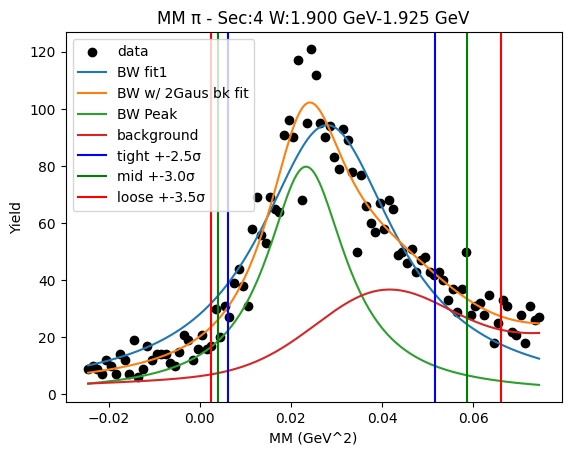

W bin: 21 1.925 GeV-1.950 GeV
initial bw fit:  [15.09165343  0.16755865  0.10983979]
W1_ini_pars: [1.50916534e+01 1.67558652e-01 1.09839791e-01 2.53642058e+01
 4.00000001e-02 1.48180868e-02 2.24963861e+14 3.73081862e+00
 4.71566757e-01]
0.002288020873734871 0.04724281553293614
Breit-Wigner Peak [12.01371875  0.15737032  0.08655903]
Gaus2 [2.37453130e+01 5.35955578e-02 1.96202275e-02]
Gaus3 [2.25189934e+14 3.92457401e+00 4.71103708e-01]


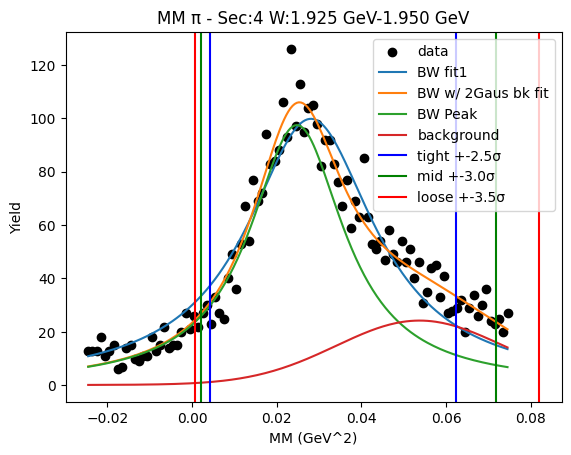

W bin: 22 1.950 GeV-1.975 GeV
initial bw fit:  [15.65318791  0.17019954  0.11274746]
W1_ini_pars: [1.56531879e+01 1.70199536e-01 1.12747458e-01 2.37453130e+01
 5.35955578e-02 1.96202275e-02 2.25189934e+14 3.92457401e+00
 4.71103708e-01]
-0.0053085438663819685 0.05772450992755175
Breit-Wigner Peak [15.54274062  0.1618888   0.10249639]
Gaus2 [2.42339544e+01 7.31984447e-02 1.90123268e-02]
Gaus3 [2.25229876e+14 5.17200598e+00 4.71019200e-01]


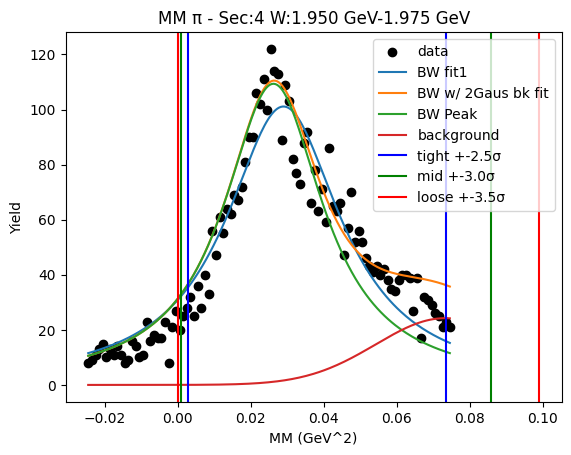

W bin: 23 1.975 GeV-2.000 GeV
initial bw fit:  [16.35394199  0.16831018  0.10951439]
W1_ini_pars: [1.63539420e+01 1.68310175e-01 1.09514387e-01 2.42339544e+01
 7.31984447e-02 1.90123268e-02 2.25229876e+14 5.17200598e+00
 4.71019200e-01]
-0.0006820322712734021 0.052998512628961575
Breit-Wigner Peak [14.52597526  0.16173509  0.0945873 ]
Gaus2 [20.39671841  0.06550531  0.02055445]
Gaus3 [4.50459751e+14 5.17200598e+00 1.58199967e-01]


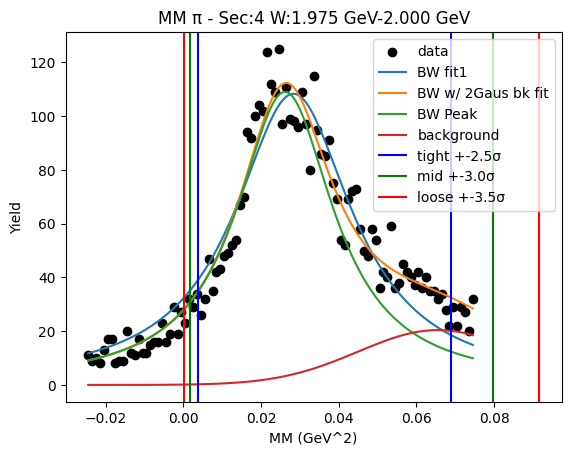

W bin: 24 2.000 GeV-2.025 GeV
initial bw fit:  [16.79819216  0.16584523  0.10865544]
W1_ini_pars: [1.67981922e+01 1.65845235e-01 1.08655444e-01 2.03967184e+01
 6.55053102e-02 2.05544496e-02 4.50459751e+14 5.17200598e+00
 1.58199967e-01]
-0.009394509672294538 0.06108002945094179
Breit-Wigner Peak [16.79635681  0.16075683  0.10837784]
Gaus2 [2.03963675e+01 7.66311454e-02 2.02842184e-02]
Gaus3 [4.50459751e+14 5.17200598e+00 1.58199967e-01]


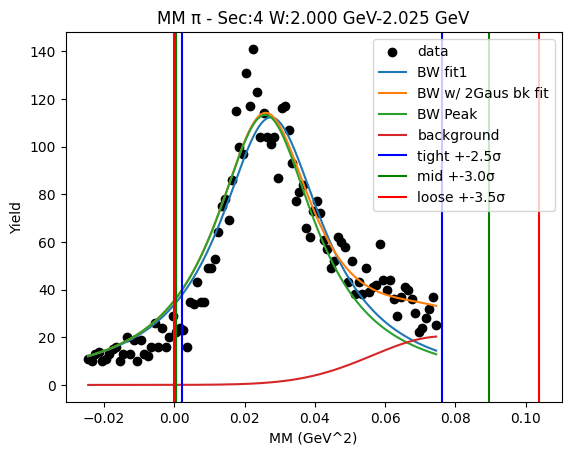

W bin: 25 2.025 GeV-2.050 GeV
initial bw fit:  [16.98747071  0.16819765  0.11839066]
W1_ini_pars: [1.69874707e+01 1.68197651e-01 1.18390664e-01 2.03963675e+01
 7.66311454e-02 2.02842184e-02 4.50459751e+14 5.17200598e+00
 1.58199967e-01]
-0.014654846655510572 0.06893844068343351
Breit-Wigner Peak [16.98634725  0.16474768  0.1180348 ]
Gaus2 [2.03961529e+01 8.47000373e-02 2.00913458e-02]
Gaus3 [4.50459751e+14 5.17200598e+00 1.58199967e-01]


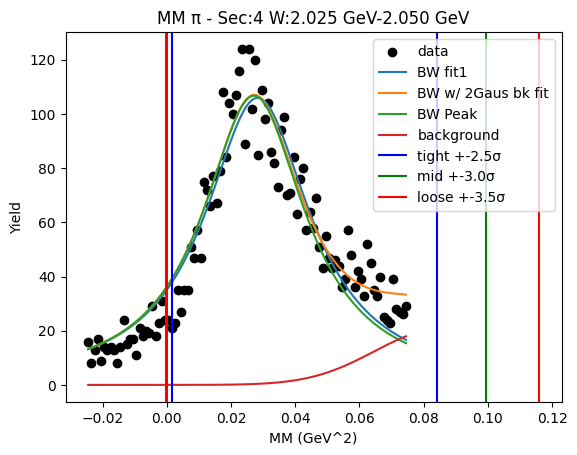

W bin: 26 2.050 GeV-2.075 GeV
initial bw fit:  [17.11479544  0.16595377  0.11647257]
W1_ini_pars: [1.71147954e+01 1.65953769e-01 1.16472565e-01 2.03961529e+01
 8.47000373e-02 2.00913458e-02 4.50459751e+14 5.17200598e+00
 1.58199967e-01]
-0.013721633749559956 0.06716951529642588
Breit-Wigner Peak [17.11405033  0.16347459  0.1161114 ]
Gaus2 [2.03960926e+01 8.73455797e-02 2.00172172e-02]
Gaus3 [4.50459751e+14 5.17200598e+00 1.58199967e-01]


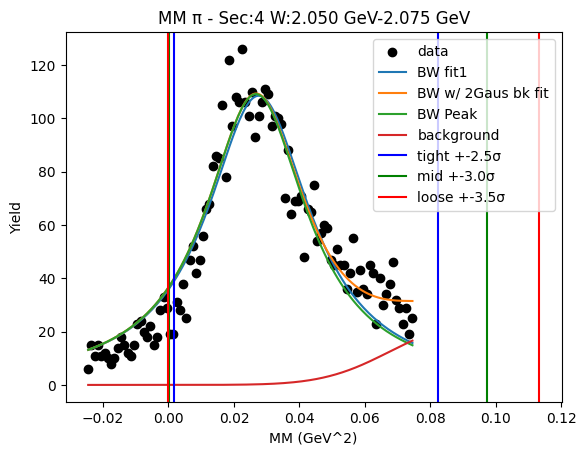

W bin: 27 2.075 GeV-2.100 GeV
initial bw fit:  [17.04437482  0.16673507  0.12044775]
W1_ini_pars: [1.70443748e+01 1.66735069e-01 1.20447747e-01 2.03960926e+01
 8.73455797e-02 2.00172172e-02 4.50459751e+14 5.17200598e+00
 1.58199967e-01]
-0.01621199878892193 0.07034505520021622
Breit-Wigner Peak [17.0437056   0.16451908  0.12010902]
Gaus2 [2.03960316e+01 9.00866253e-02 1.99484405e-02]
Gaus3 [4.50459751e+14 5.17200598e+00 1.58199967e-01]


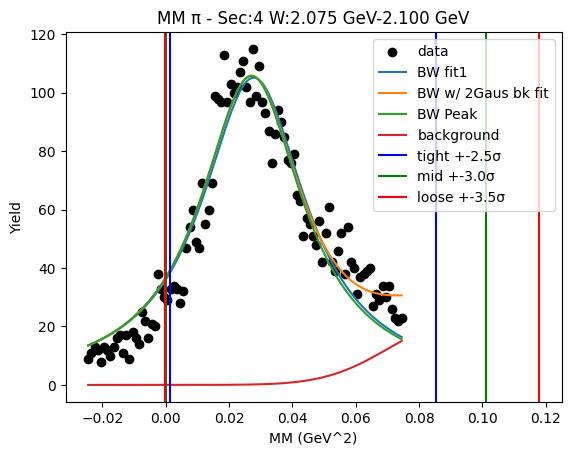

W bin: 28 2.100 GeV-2.125 GeV
initial bw fit:  [17.41846943  0.16487169  0.11707762]
W1_ini_pars: [1.74184694e+01 1.64871686e-01 1.17077616e-01 2.03960316e+01
 9.00866253e-02 1.99484405e-02 4.50459751e+14 5.17200598e+00
 1.58199967e-01]
-0.01438697588402241 0.06734559823364603
Breit-Wigner Peak [17.41783875  0.16272465  0.11671373]
Gaus2 [2.03960204e+01 9.06099547e-02 1.99332435e-02]
Gaus3 [4.50459751e+14 5.17200598e+00 1.58199967e-01]


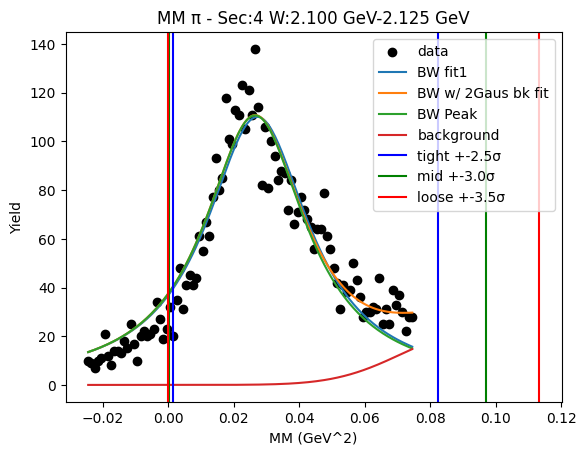

initial bw fit:  [9.58736402e+02 1.70951819e-01 1.54935536e-01]
-0.023495354532972045 0.07427842893271
Breit-Wigner Peak [8.31142512e+02 1.59347222e-01 1.27654340e-01]
Gaus2 [5.00119118e+02 6.52554938e-02 1.65180775e-02]
Gaus3 [7.06101552e+02 8.00000000e-02 3.25699785e-02]


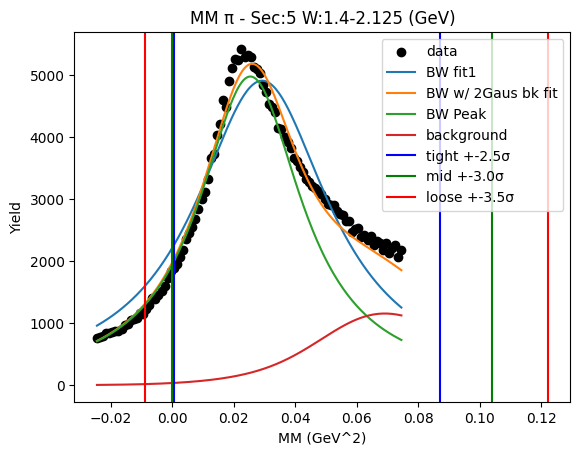

W bin: 1 1.425 GeV-1.450 GeV
initial bw fit:  [6.1285102  0.16483839 0.07040023]


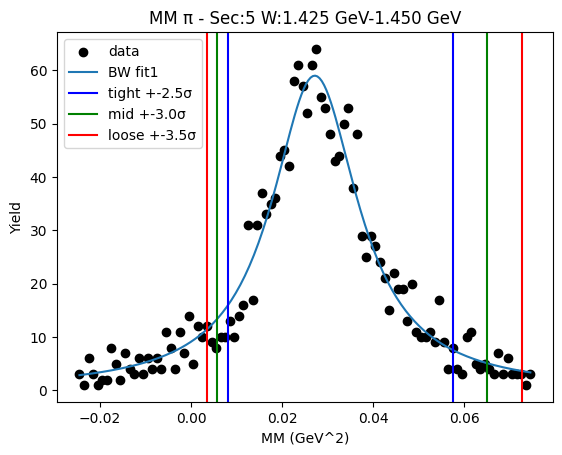

W bin: 2 1.450 GeV-1.475 GeV
initial bw fit:  [7.62953459 0.1643542  0.07180916]


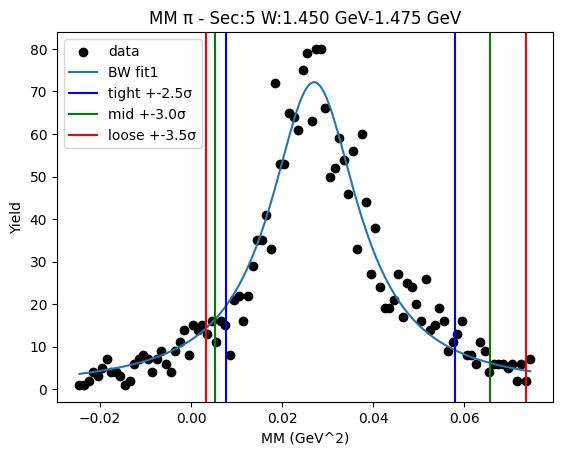

W bin: 3 1.475 GeV-1.500 GeV
initial bw fit:  [9.41736167 0.16515581 0.08118965]


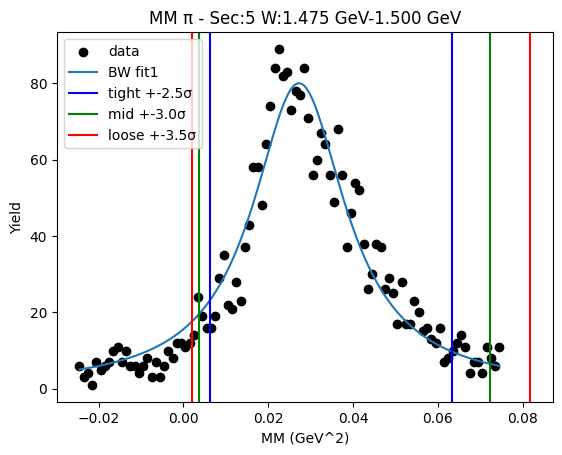

W bin: 4 1.500 GeV-1.525 GeV
initial bw fit:  [11.5718009   0.16349642  0.07981364]


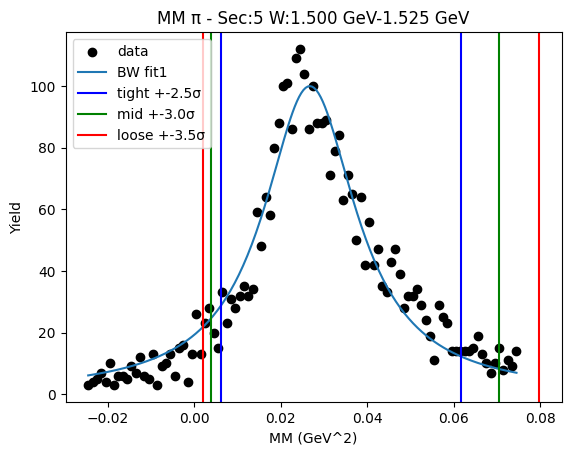

W bin: 5 1.525 GeV-1.550 GeV
initial bw fit:  [11.96356149  0.16848875  0.08639489]


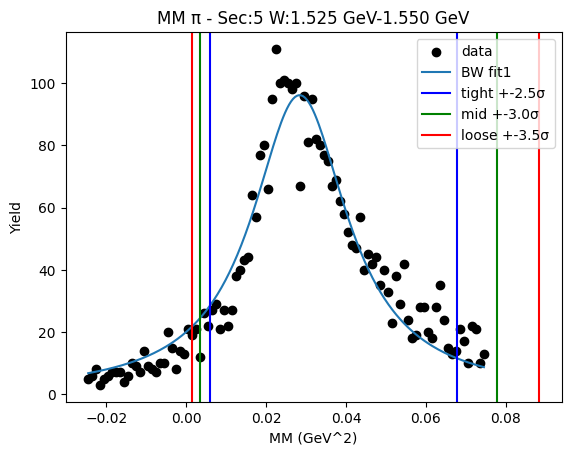

W bin: 6 1.550 GeV-1.575 GeV
initial bw fit:  [12.2624172   0.16954553  0.09158476]


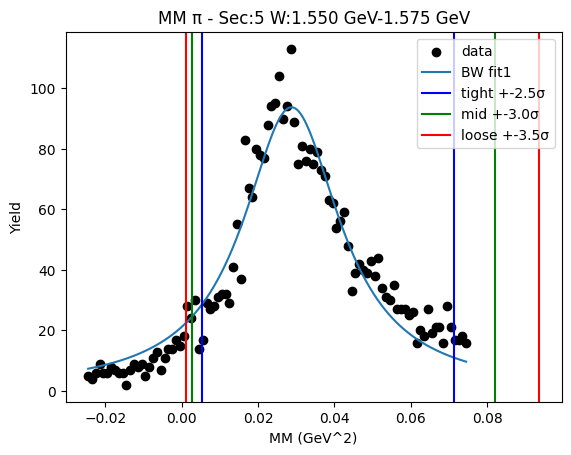

W bin: 7 1.575 GeV-1.600 GeV
initial bw fit:  [12.66505804  0.17029204  0.10045503]


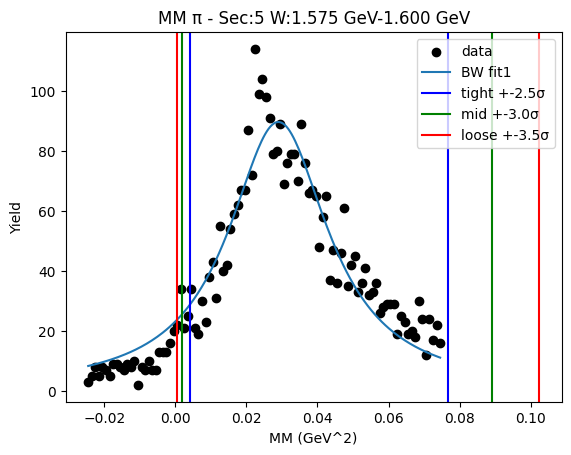

W bin: 8 1.600 GeV-1.625 GeV
initial bw fit:  [12.91683651  0.1660849   0.09636249]


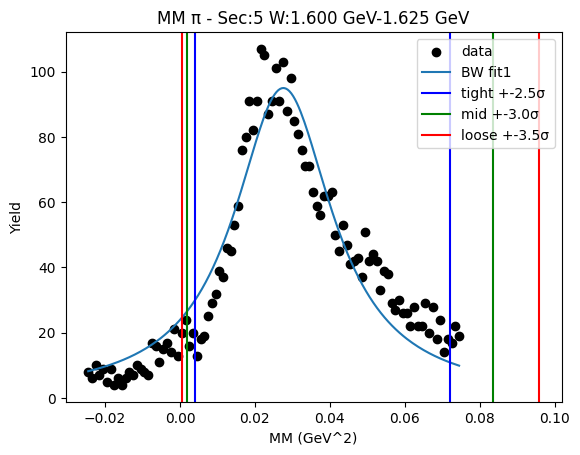

W bin: 9 1.625 GeV-1.650 GeV
initial bw fit:  [13.388394    0.16189458  0.10065816]


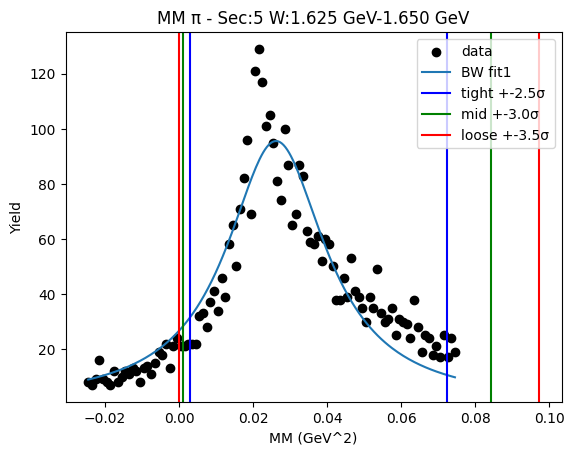

W bin: 10 1.650 GeV-1.675 GeV
initial bw fit:  [15.49418937  0.16361821  0.10672499]


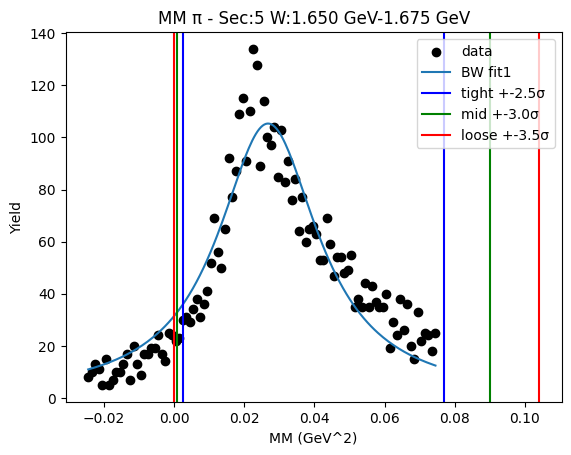

W bin: 11 1.675 GeV-1.700 GeV
initial bw fit:  [17.99004994  0.16267839  0.10414538]


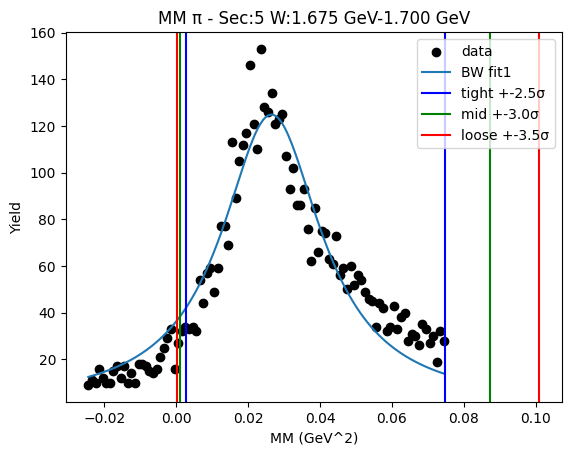

W bin: 12 1.700 GeV-1.725 GeV
initial bw fit:  [20.90367428  0.16170311  0.10302985]


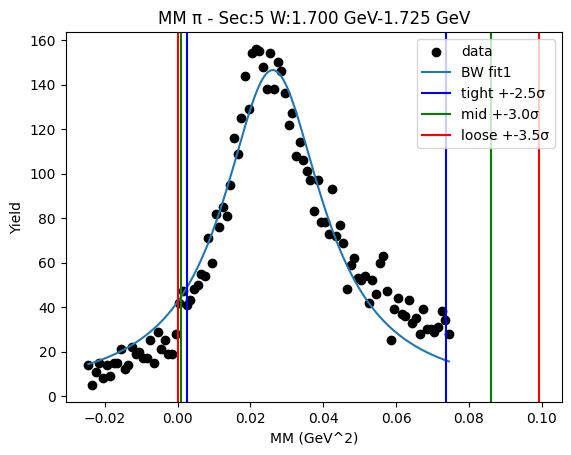

W bin: 13 1.725 GeV-1.750 GeV
initial bw fit:  [21.65253448  0.16364777  0.10206279]


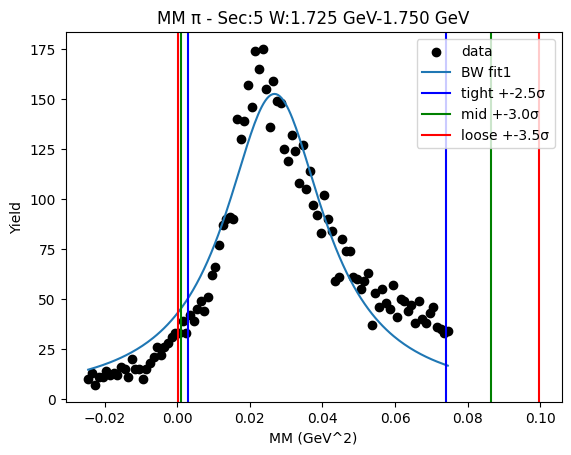

W bin: 14 1.750 GeV-1.775 GeV
initial bw fit:  [21.58464706  0.1669842   0.10935128]


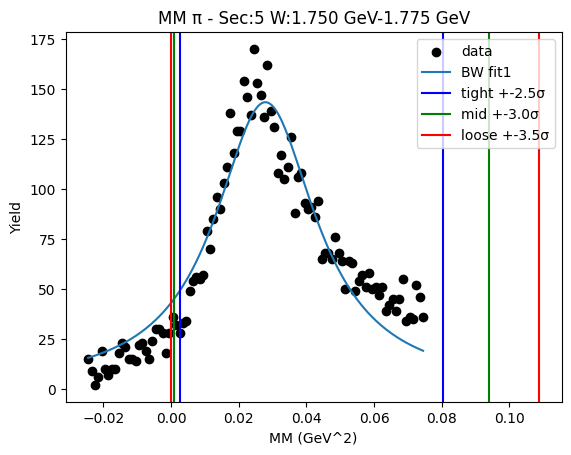

W bin: 15 1.775 GeV-1.800 GeV
initial bw fit:  [19.65745318  0.16784429  0.11978839]


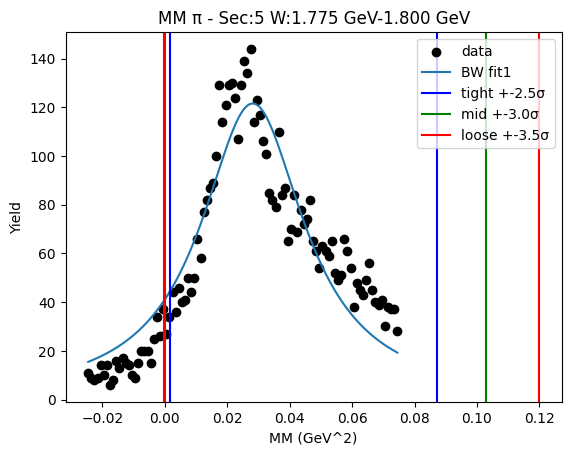

W bin: 16 1.800 GeV-1.825 GeV
initial bw fit:  [19.07061548  0.16596197  0.12134454]


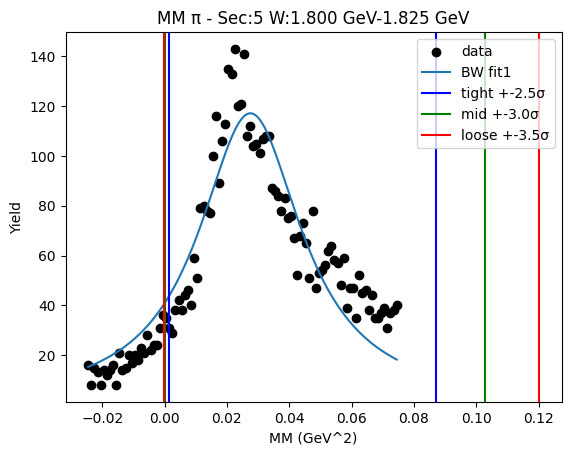

W bin: 17 1.825 GeV-1.850 GeV
initial bw fit:  [18.20463939  0.16771005  0.12159027]


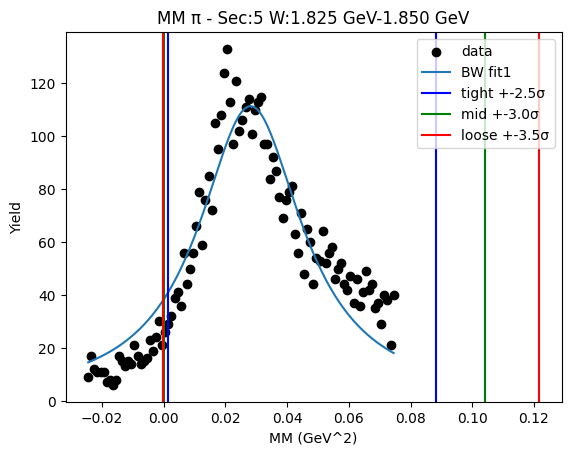

W bin: 18 1.850 GeV-1.875 GeV
initial bw fit:  [18.66762171  0.16725386  0.1258121 ]


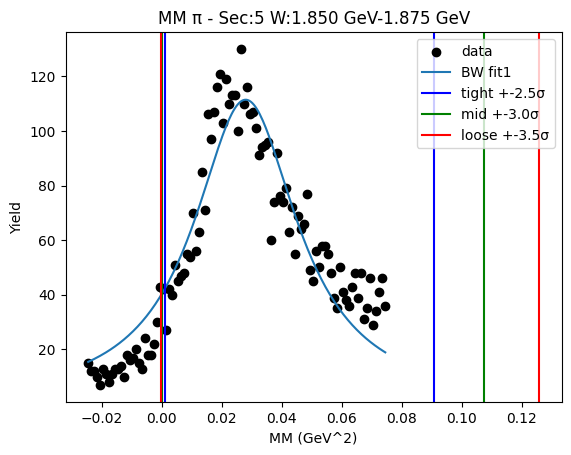

W bin: 19 1.875 GeV-1.900 GeV
initial bw fit:  [18.86075137  0.16465655  0.12716226]


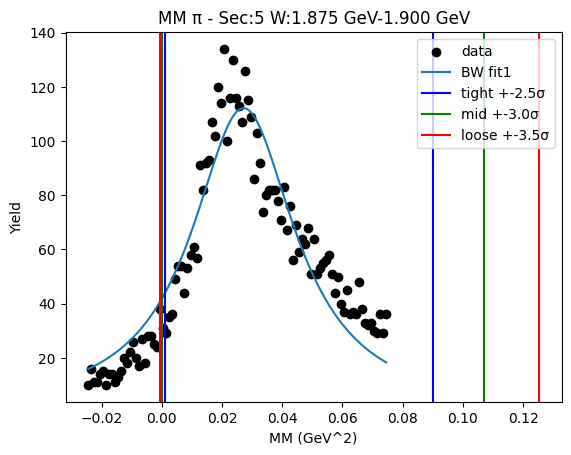

W bin: 20 1.900 GeV-1.925 GeV
initial bw fit:  [18.64564532  0.16472246  0.12168783]
W1_ini_pars: [18.64564532  0.16472246  0.12168783  3.07211428  0.3         0.06742853
  2.78458923  0.4         0.10165907]
0.000736364523559397 0.044793694183592456
Breit-Wigner Peak [11.47395065  0.15088084  0.08569065]
Gaus2 [2.95793611e+01 4.06360179e-02 2.09485027e-02]
Gaus3 [1.29492426e+07 1.48275832e+00 2.71142082e-01]


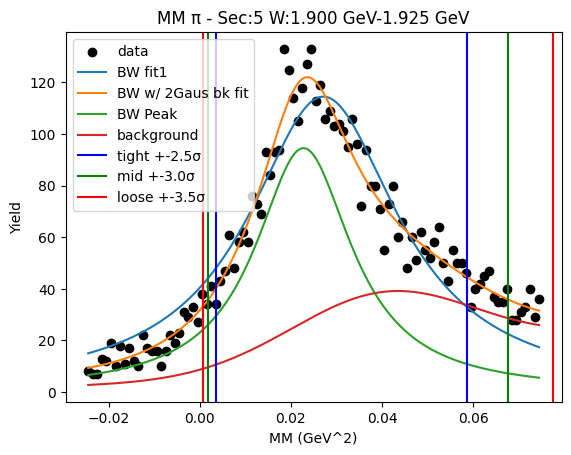

W bin: 21 1.925 GeV-1.950 GeV
initial bw fit:  [17.9422176   0.16438499  0.12888725]
W1_ini_pars: [1.79422176e+01 1.64384989e-01 1.28887254e-01 2.95793611e+01
 4.06360179e-02 2.09485027e-02 1.29492426e+07 1.48275832e+00
 2.71142082e-01]
-0.009276208878703306 0.05529471158868809
Breit-Wigner Peak [15.09964772  0.15168801  0.10373919]
Gaus2 [3.14062370e+01 6.25217169e-02 2.18367596e-02]
Gaus3 [1.30065903e+07 2.86752150e+01 2.69953611e-01]


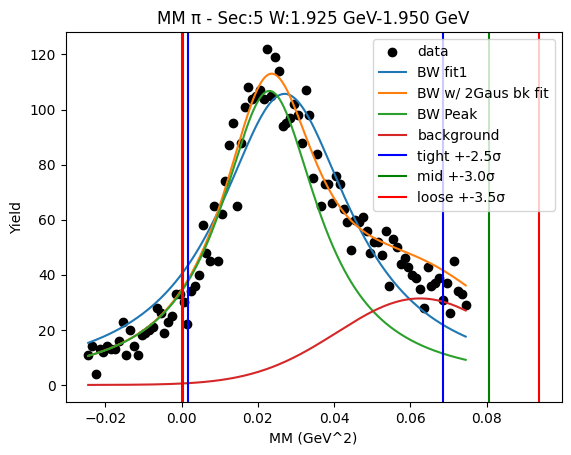

W bin: 22 1.950 GeV-1.975 GeV
initial bw fit:  [18.28675497  0.1678479   0.14063069]
W1_ini_pars: [1.82867550e+01 1.67847900e-01 1.40630689e-01 3.14062370e+01
 6.25217169e-02 2.18367596e-02 1.30065903e+07 2.86752150e+01
 2.69953611e-01]
-0.033013437507144805 0.0855015425356937
Breit-Wigner Peak [18.28378221  0.16200016  0.14054358]
Gaus2 [3.14050722e+01 8.28478721e-02 2.13270867e-02]
Gaus3 [1.30065903e+07 2.86752150e+01 2.69953611e-01]


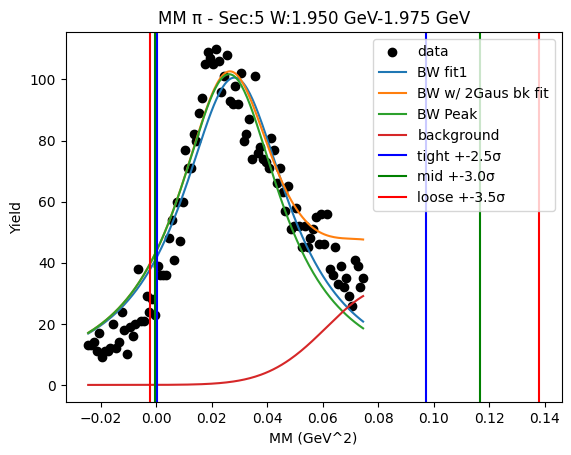

W bin: 23 1.975 GeV-2.000 GeV
initial bw fit:  [17.82013405  0.16589794  0.12996567]
W1_ini_pars: [1.78201340e+01 1.65897940e-01 1.29965672e-01 3.14050722e+01
 8.28478721e-02 2.13270867e-02 1.30065903e+07 2.86752150e+01
 2.69953611e-01]
-0.023724822750581524 0.07710681849384572
Breit-Wigner Peak [17.81926985  0.1633738   0.12963516]
Gaus2 [3.14048210e+01 9.36418247e-02 2.10628136e-02]
Gaus3 [1.30065903e+07 2.86752150e+01 2.69953611e-01]


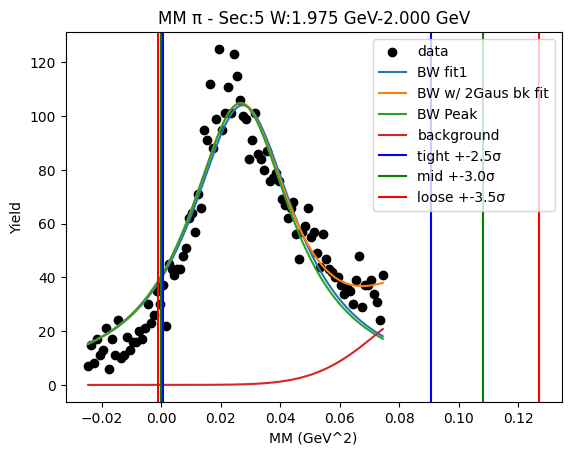

W bin: 24 2.000 GeV-2.025 GeV
initial bw fit:  [17.14924265  0.16628718  0.13030905]
W1_ini_pars: [1.71492427e+01 1.66287184e-01 1.30309052e-01 3.14048210e+01
 9.36418247e-02 2.10628136e-02 1.30065903e+07 2.86752150e+01
 2.69953611e-01]
-0.023641950738822567 0.07778738188205461
Breit-Wigner Peak [17.14868691  0.16453788  0.1300188 ]
Gaus2 [3.14047319e+01 9.85947926e-02 2.09258815e-02]
Gaus3 [1.30065903e+07 2.86752150e+01 2.69953611e-01]


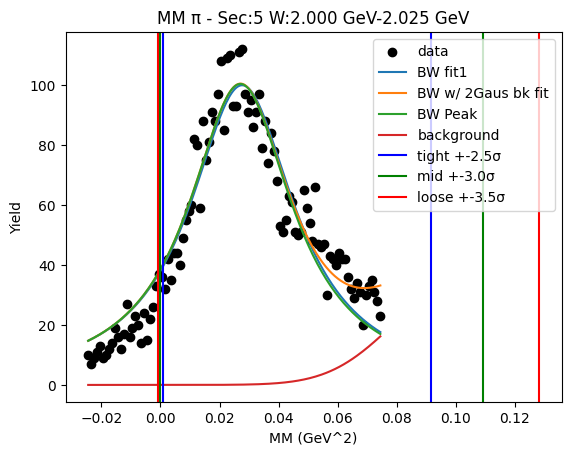

W bin: 25 2.025 GeV-2.050 GeV
initial bw fit:  [16.37068775  0.16502724  0.12731403]
W1_ini_pars: [1.63706878e+01 1.65027244e-01 1.27314031e-01 3.14047319e+01
 9.85947926e-02 2.09258815e-02 1.30065903e+07 2.86752150e+01
 2.69953611e-01]
-0.021708020513566652 0.07506934062476321
Breit-Wigner Peak [16.37017072  0.16334216  0.12700221]
Gaus2 [3.14046982e+01 1.00796789e-01 2.08570029e-02]
Gaus3 [1.30065903e+07 2.86752150e+01 2.69953611e-01]


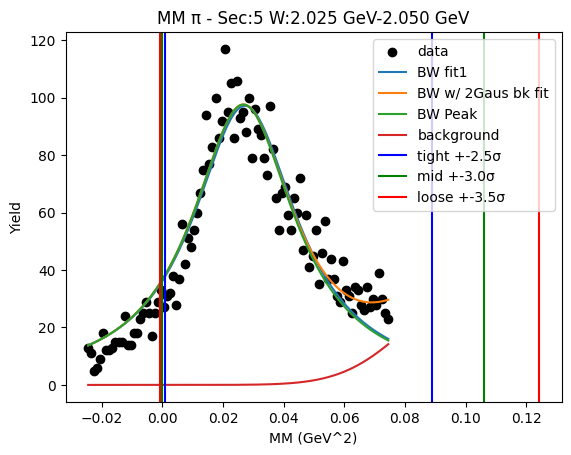

W bin: 26 2.050 GeV-2.075 GeV
initial bw fit:  [16.3048029   0.16313074  0.1233557 ]
W1_ini_pars: [1.63048029e+01 1.63130738e-01 1.23355703e-01 3.14046982e+01
 1.00796789e-01 2.08570029e-02 1.30065903e+07 2.86752150e+01
 2.69953611e-01]
-0.019278517719652256 0.07162513112190808
Breit-Wigner Peak [16.30439753  0.16178166  0.12308781]
Gaus2 [3.14046990e+01 1.00648935e-01 2.52474287e-02]
Gaus3 [1.30065903e+07 2.86752150e+01 2.69953611e-01]


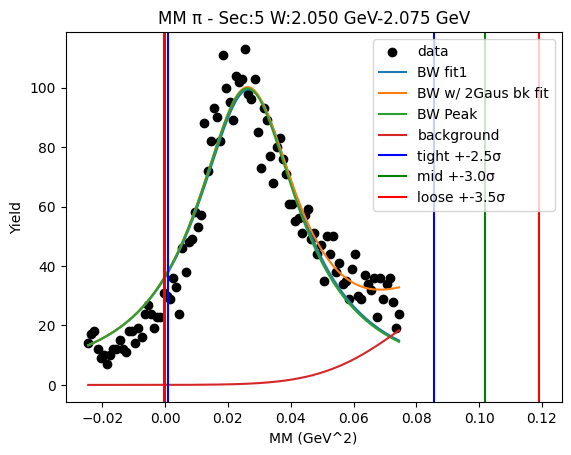

W bin: 27 2.075 GeV-2.100 GeV
initial bw fit:  [15.92608642  0.16131119  0.12485758]
W1_ini_pars: [1.59260864e+01 1.61311191e-01 1.24857580e-01 3.14046990e+01
 1.00648935e-01 2.52474287e-02 1.30065903e+07 2.86752150e+01
 2.69953611e-01]
-0.02115853444862706 0.0718607130878844
Breit-Wigner Peak [15.92539409  0.15922025  0.12451188]
Gaus2 [3.14046269e+01 1.04499422e-01 2.51012173e-02]
Gaus3 [1.30065903e+07 2.86752150e+01 2.69953611e-01]


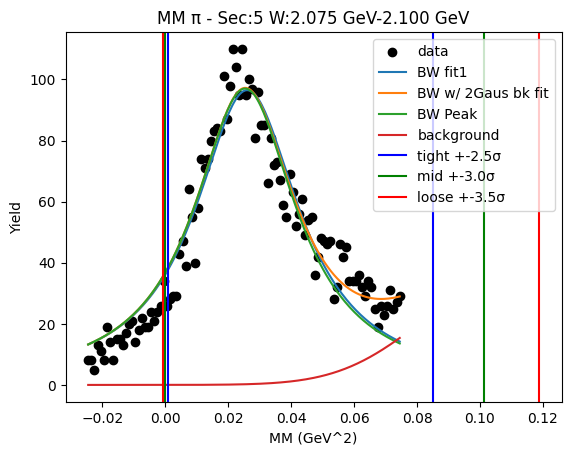

W bin: 28 2.100 GeV-2.125 GeV
initial bw fit:  [15.44737298  0.16401768  0.13463145]
W1_ini_pars: [1.54473730e+01 1.64017684e-01 1.34631449e-01 3.14046269e+01
 1.04499422e-01 2.51012173e-02 1.30065903e+07 2.86752150e+01
 2.69953611e-01]
-0.027872300969346352 0.08032244468158405
Breit-Wigner Peak [15.44666793  0.16194157  0.13428499]
Gaus2 [3.14045710e+01 1.07770235e-01 2.49704009e-02]
Gaus3 [1.30065903e+07 2.86752150e+01 2.69953611e-01]


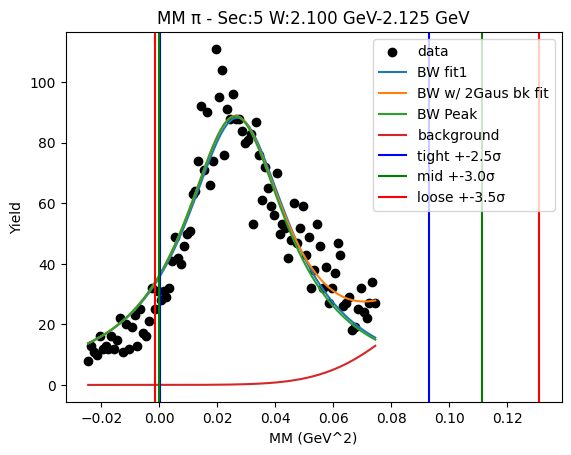

initial bw fit:  [1.04133351e+03 1.64521266e-01 1.33428963e-01]
-0.012282351564942944 0.06106467887327855
Breit-Wigner Peak [9.04921902e+02 1.56176707e-01 1.10564484e-01]
Gaus2 [5.00152718e+02 6.38950993e-02 1.99127329e-02]
Gaus3 [7.06151373e+02 8.00000000e-02 3.50060519e-02]


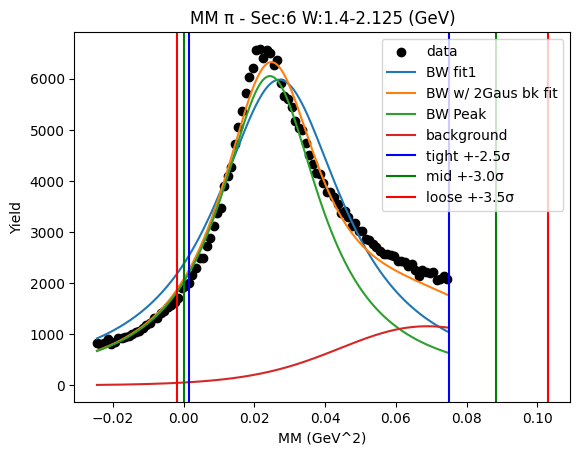

W bin: 1 1.425 GeV-1.450 GeV
initial bw fit:  [7.07357085 0.15319473 0.05528474]


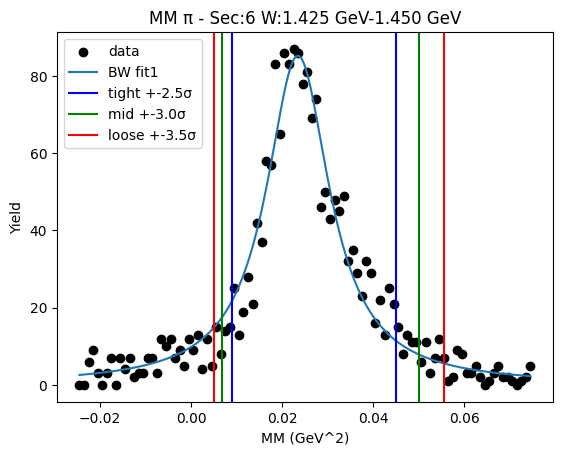

W bin: 2 1.450 GeV-1.475 GeV
initial bw fit:  [8.84526351 0.15468901 0.06181557]


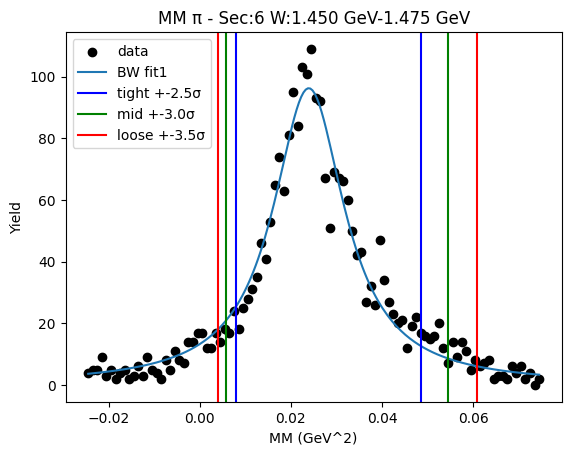

W bin: 3 1.475 GeV-1.500 GeV
initial bw fit:  [10.60221391  0.15434381  0.05709833]


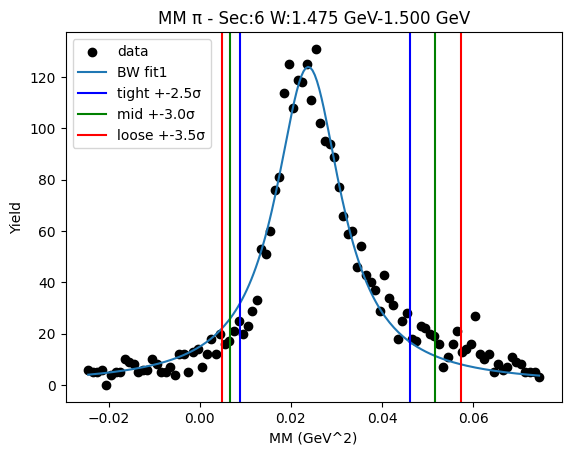

W bin: 4 1.500 GeV-1.525 GeV
initial bw fit:  [12.68794685  0.15449795  0.06284601]


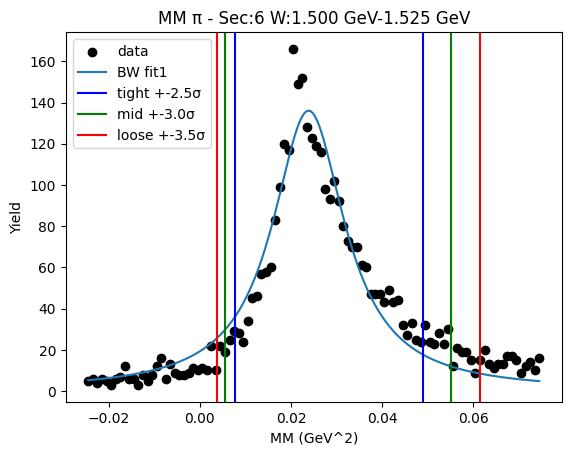

W bin: 5 1.525 GeV-1.550 GeV
initial bw fit:  [13.34888959  0.15910682  0.06984418]


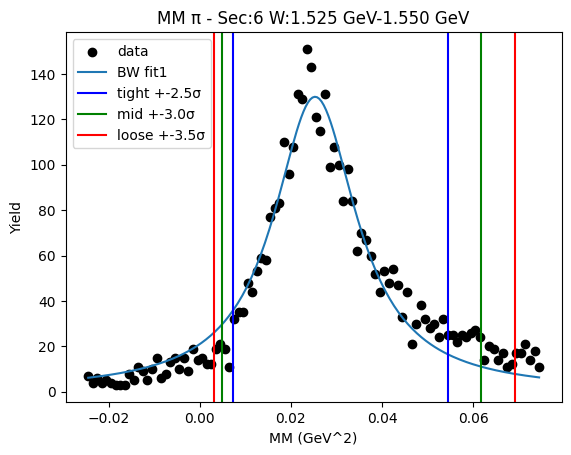

W bin: 6 1.550 GeV-1.575 GeV
initial bw fit:  [13.09822052  0.15826031  0.07420118]


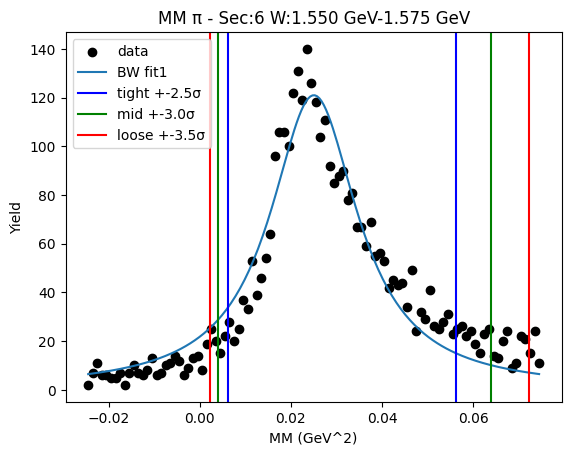

W bin: 7 1.575 GeV-1.600 GeV
initial bw fit:  [13.63600842  0.16017305  0.07895899]


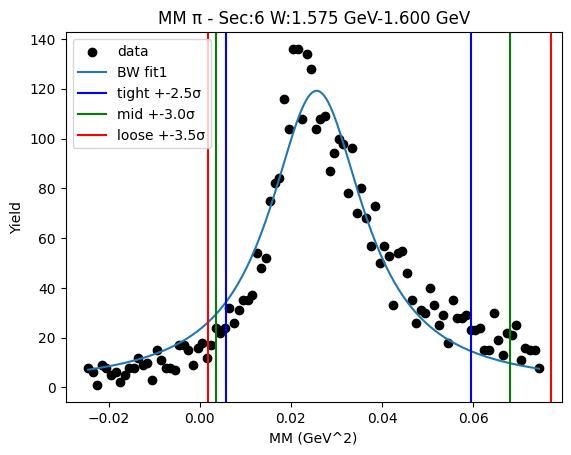

W bin: 8 1.600 GeV-1.625 GeV
initial bw fit:  [13.77500631  0.15735958  0.08188732]


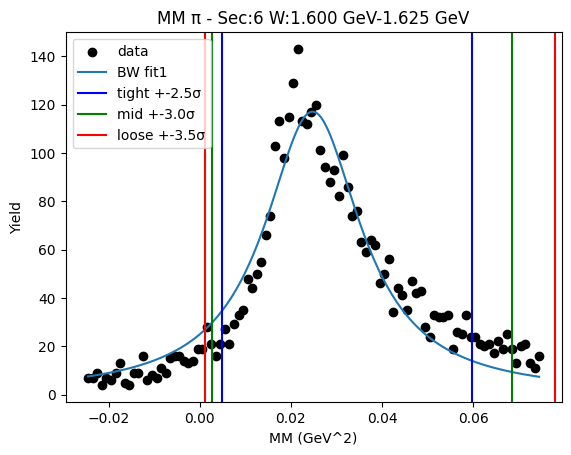

W bin: 9 1.625 GeV-1.650 GeV
initial bw fit:  [15.20997556  0.15837824  0.08217743]


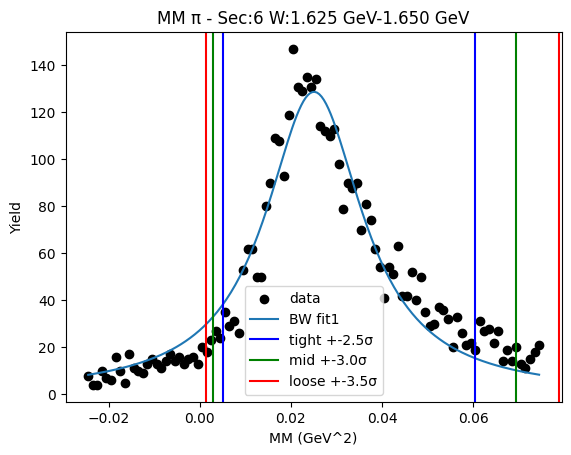

W bin: 10 1.650 GeV-1.675 GeV
initial bw fit:  [17.84830483  0.15660395  0.08918893]


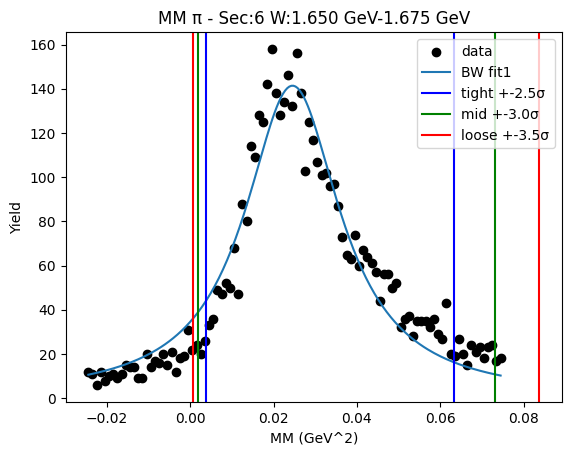

W bin: 11 1.675 GeV-1.700 GeV
initial bw fit:  [20.95240508  0.15606363  0.08287749]


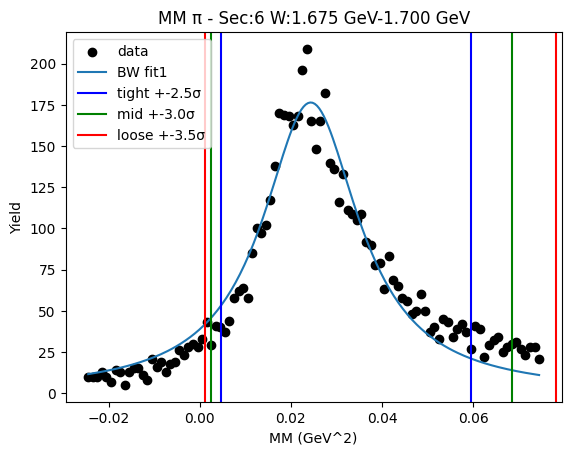

W bin: 12 1.700 GeV-1.725 GeV
initial bw fit:  [24.88489958  0.15730119  0.09090354]


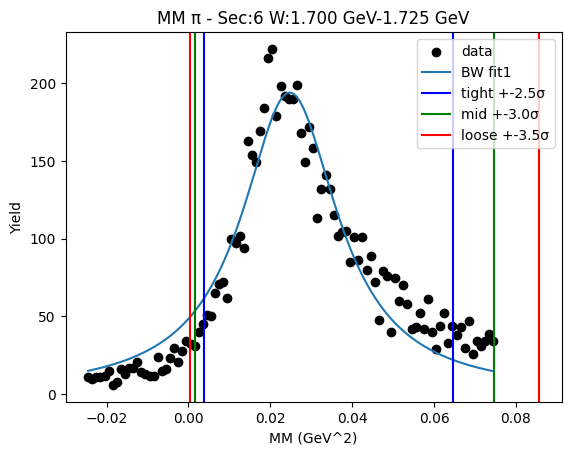

W bin: 13 1.725 GeV-1.750 GeV
initial bw fit:  [26.27450791  0.15978416  0.09153049]


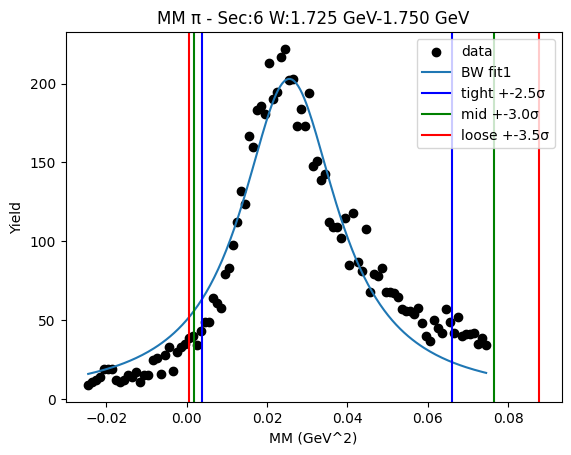

W bin: 14 1.750 GeV-1.775 GeV
initial bw fit:  [24.98263315  0.16227534  0.09751848]


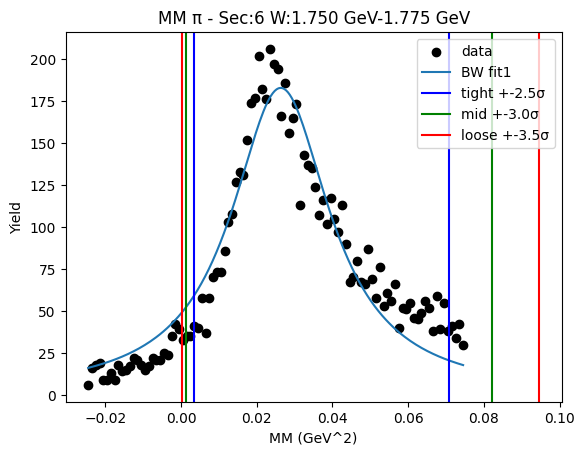

W bin: 15 1.775 GeV-1.800 GeV
initial bw fit:  [23.88082034  0.16213292  0.10315234]


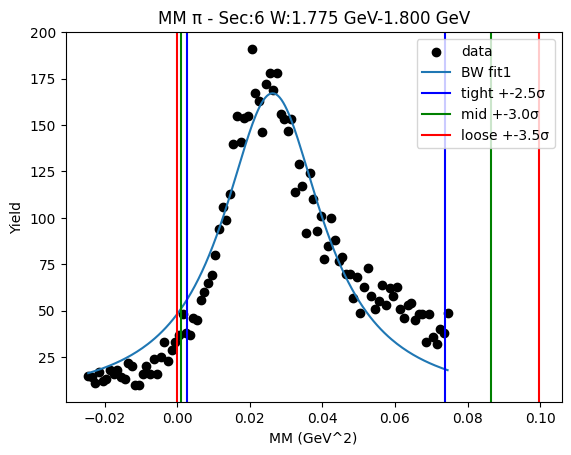

W bin: 16 1.800 GeV-1.825 GeV
initial bw fit:  [23.56059915  0.16543845  0.11458239]


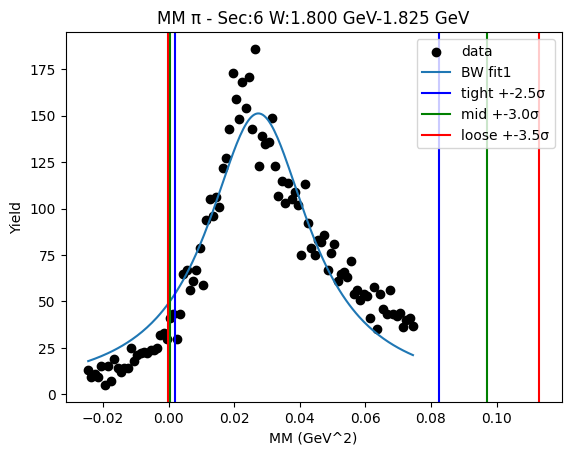

W bin: 17 1.825 GeV-1.850 GeV
initial bw fit:  [22.91517422  0.16309949  0.11258776]


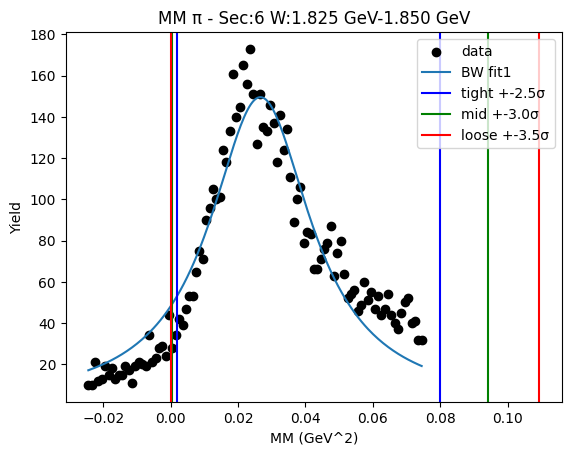

W bin: 18 1.850 GeV-1.875 GeV
initial bw fit:  [23.68456921  0.16419684  0.11551947]


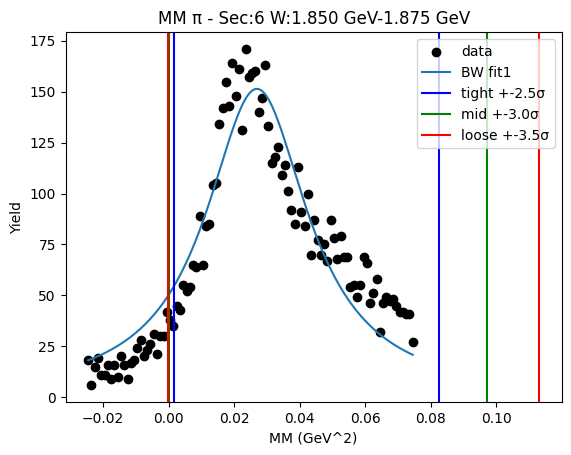

W bin: 19 1.875 GeV-1.900 GeV
initial bw fit:  [23.78443139  0.16506607  0.11988642]


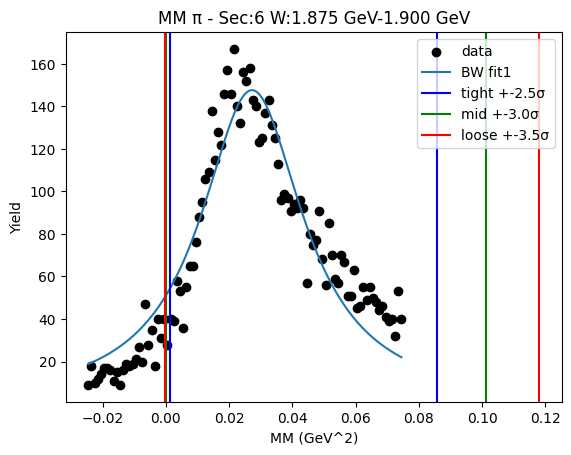

W bin: 20 1.900 GeV-1.925 GeV
initial bw fit:  [24.4863102   0.16423128  0.11611483]
W1_ini_pars: [24.4863102   0.16423128  0.11611483  3.07211428  0.3         0.06742853
  2.78458923  0.4         0.10165907]
Runtime Error2.1
	Just skip it for now


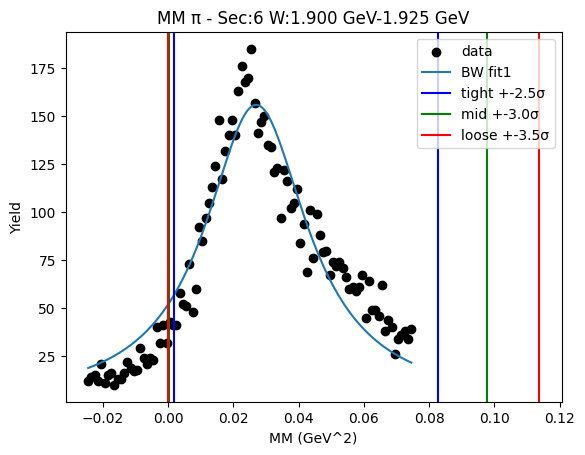

W bin: 21 1.925 GeV-1.950 GeV
initial bw fit:  [23.59769772  0.16397829  0.11530462]
W1_ini_pars: [23.59769772  0.16397829  0.11530462  3.07211428  0.3         0.06742853
  2.78458923  0.4         0.10165907]
-0.0011243650372486508 0.04664937607409366
Breit-Wigner Peak [17.50418965  0.15087248  0.08923167]
Gaus2 [3.91752555e+01 4.34725053e-02 1.75597941e-02]
Gaus3 [2.23034867e+01 8.00000000e-02 1.73780285e-02]


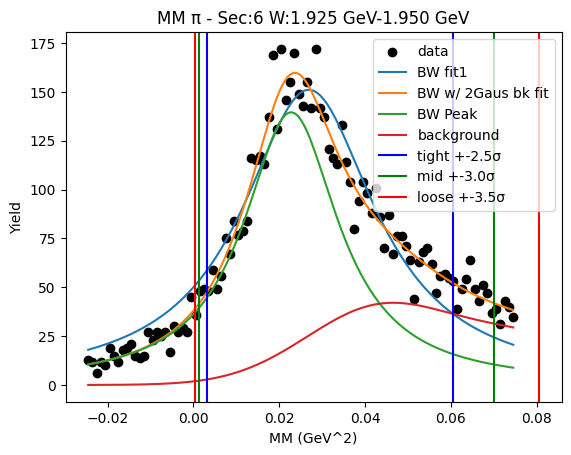

W bin: 22 1.950 GeV-1.975 GeV
initial bw fit:  [24.09319137  0.16220875  0.11873692]
W1_ini_pars: [2.40931914e+01 1.62208750e-01 1.18736921e-01 3.91752555e+01
 4.34725053e-02 1.75597941e-02 2.23034867e+01 8.00000000e-02
 1.73780285e-02]
-0.0030829256894939552 0.04648753665117219
Breit-Wigner Peak [16.82424715  0.14731702  0.09089413]
Gaus2 [4.85106492e+01 4.58206521e-02 2.13542310e-02]
Gaus3 [2.13961432e+01 3.75063518e+00 1.74269087e-02]


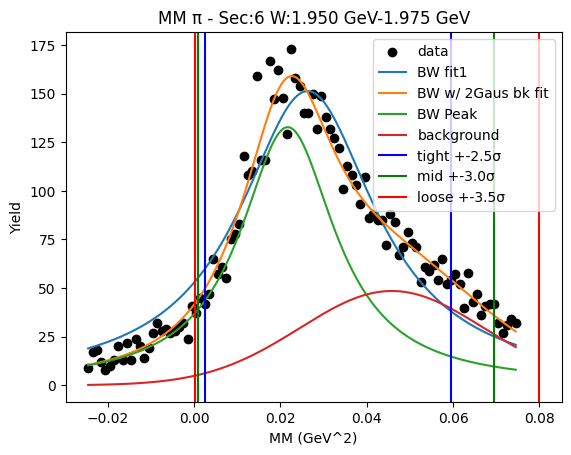

W bin: 23 1.975 GeV-2.000 GeV
initial bw fit:  [23.8136834   0.16364031  0.12305232]
W1_ini_pars: [2.38136834e+01 1.63640310e-01 1.23052319e-01 4.85106492e+01
 4.58206521e-02 2.13542310e-02 2.13961432e+01 3.75063518e+00
 1.74269087e-02]
-0.00627280565328114 0.052492203041192065
Breit-Wigner Peak [18.28895823  0.15201874  0.09896549]
Gaus2 [3.66871949e+01 5.31586531e-02 2.48856560e-02]
Gaus3 [2.13961432e+01 3.75063518e+00 1.74269087e-02]


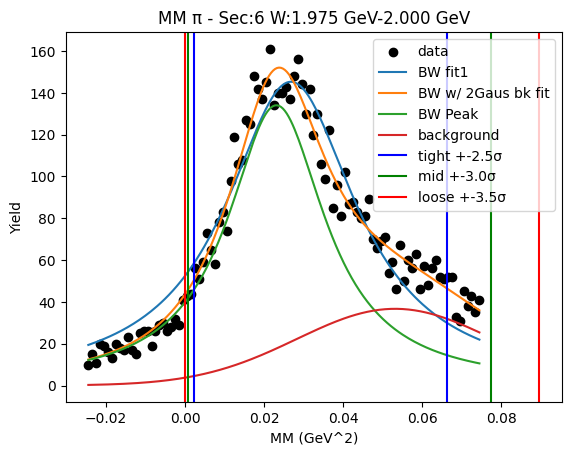

W bin: 24 2.000 GeV-2.025 GeV
initial bw fit:  [22.90323106  0.16438256  0.1173707 ]
W1_ini_pars: [2.29032311e+01 1.64382560e-01 1.17370703e-01 3.66871949e+01
 5.31586531e-02 2.48856560e-02 2.13961432e+01 3.75063518e+00
 1.74269087e-02]
-0.004049732057585759 0.05193545114003814
Breit-Wigner Peak [17.93620227  0.1547348   0.0965964 ]
Gaus2 [3.21617179e+01 5.26028289e-02 2.51143523e-02]
Gaus3 [2.13961432e+01 3.75063518e+00 1.74269087e-02]


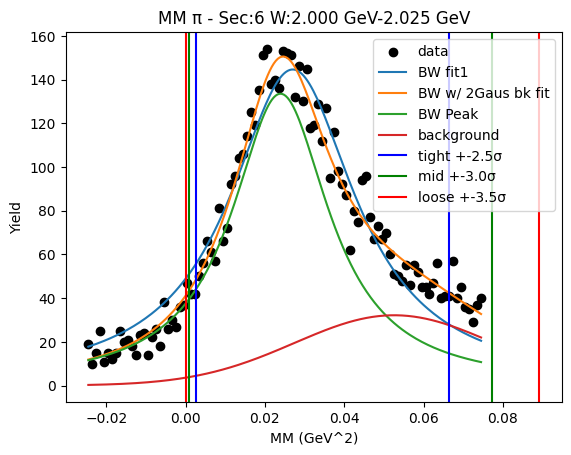

W bin: 25 2.025 GeV-2.050 GeV
initial bw fit:  [22.63820805  0.16428246  0.1261266 ]
W1_ini_pars: [2.26382081e+01 1.64282455e-01 1.26126599e-01 3.21617179e+01
 5.26028289e-02 2.51143523e-02 2.13961432e+01 3.75063518e+00
 1.74269087e-02]
0.0005504248681341521 0.045566450149049836
Breit-Wigner Peak [12.98331599  0.15185005  0.08661796]
Gaus2 [4.74396230e+01 4.27962578e-02 2.92525873e-02]
Gaus3 [2.13961432e+01 3.75063518e+00 1.74269087e-02]


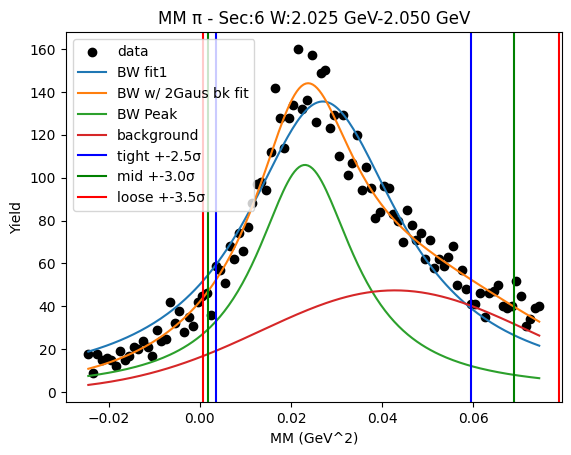

W bin: 26 2.050 GeV-2.075 GeV
initial bw fit:  [22.28126008  0.16563589  0.12168647]
W1_ini_pars: [2.22812601e+01 1.65635885e-01 1.21686467e-01 4.74396230e+01
 4.27962578e-02 2.92525873e-02 2.13961432e+01 3.75063518e+00
 1.74269087e-02]
-0.0036353977943011234 0.04934858556066102
Breit-Wigner Peak [15.37028949  0.15118397  0.09397161]
Gaus2 [4.29064670e+01 4.70681125e-02 2.33696181e-02]
Gaus3 [2.13961432e+01 3.75063518e+00 1.74269087e-02]


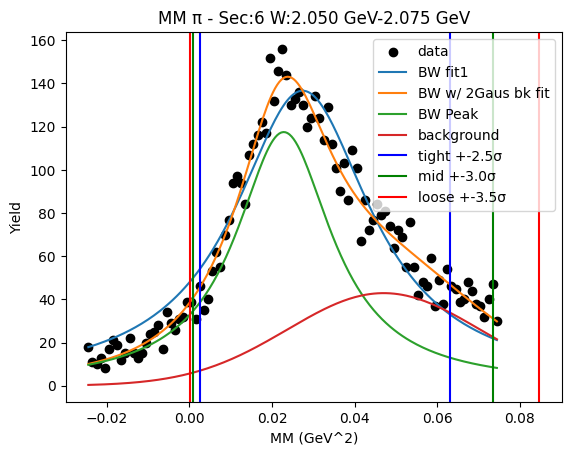

W bin: 27 2.075 GeV-2.100 GeV
initial bw fit:  [21.26227165  0.16118659  0.12810252]
W1_ini_pars: [2.12622717e+01 1.61186587e-01 1.28102519e-01 4.29064670e+01
 4.70681125e-02 2.33696181e-02 2.13961432e+01 3.75063518e+00
 1.74269087e-02]
0.0007553016540430973 0.04171700749592688
Breit-Wigner Peak [11.39614021  0.1457263   0.08262537]
Gaus2 [5.05100325e+01 4.10635395e-02 2.69930478e-02]
Gaus3 [2.13961432e+01 3.75063518e+00 1.74269087e-02]


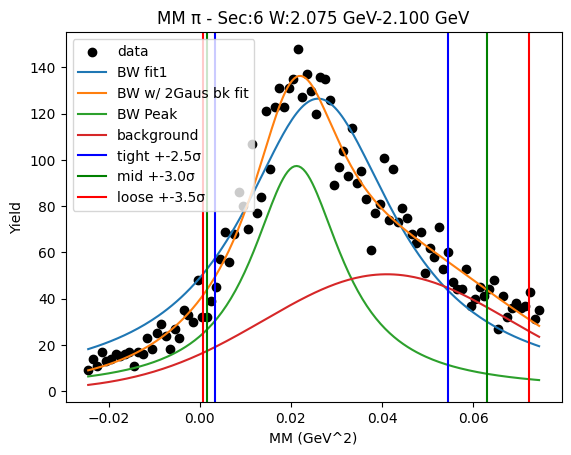

W bin: 28 2.100 GeV-2.125 GeV
initial bw fit:  [20.96471749  0.1643827   0.1256864 ]
W1_ini_pars: [2.09647175e+01 1.64382703e-01 1.25686398e-01 5.05100325e+01
 4.10635395e-02 2.69930478e-02 2.13961432e+01 3.75063518e+00
 1.74269087e-02]
-0.004379003923619569 0.048581052561035176
Breit-Wigner Peak [13.72126901  0.14866413  0.09395039]
Gaus2 [4.28455577e+01 4.54518830e-02 2.40232340e-02]
Gaus3 [2.13961432e+01 3.75063518e+00 1.74269087e-02]


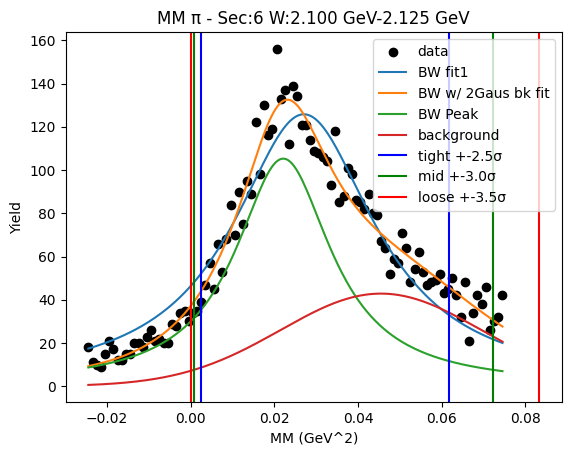

In [18]:
bkgd=True
Wlow_bin = 0
Wbin_bkgd = 20

tight = 2.5
mid = 3
loose = 3.5

bop = [2.5,3.0,3.5]
cut_names=["tight","mid","loose"]
color_order=['b','g','r']

a_ini=148
m_ini=0.149
g_ini=0.08
bw_ini = [a_ini,m_ini,g_ini]


gaus2_ini = [500,  0.3, 0.06287]
gaus3_ini = [706, 0.4, 0.2417]
 
bw_ini_w = [0.65, 0.15, 0.035]
gaus2_ini_w = [3.07211428, 0.3, 0.06742853]
gaus3_ini_w = [2.78458923, 0.4, 0.10165907]

bw_bounds = [[0.0,0.0,0.0],[np.inf,np.inf,np.inf]]
full_bounds = [[0.0,0.0,0.0,0.0,0.04,0.0,0.0,0.08,0.0],[np.inf,np.inf,np.inf,np.inf,np.inf,np.inf,np.inf,np.inf,np.inf]]
   

bw_pars = np.zeros((6,_W_bins_+1,3))
gaus2_pars = np.zeros((6,_W_bins_+1,3))
gaus3_pars = np.zeros((6,_W_bins_+1,3))


ini_pars= np.zeros(9)
for i in range(3):
    ini_pars[i] = bw_ini[i]
    ini_pars[i+3] = gaus2_ini[i]
    ini_pars[i+6] = gaus3_ini[i]

    #sec W low, high, tight, mid, loose
cut_bounds = np.zeros((6,_W_bins_+1,2,3))

bw_ini_w1 = np.zeros(3)
    
for sec in range(6):
    x_r=Center_Xbins(hist_name[sec][1])
    y_r=Values_1d(hist_name[sec][1])
    plt.scatter(x_r,y_r,color='k',label='data')
    plt.title("MM {} Sec:{} W:{}-{} (GeV)".format(Particle,sec+1,_W_min_,_W_max_))
    plt.xlabel("MM (GeV^2)")
    plt.ylabel("Yield")
    tmp_x1 = np.linspace(x_r[0],x_r[len(x_r)-1],200)
    try:
        #plt.plot(tmp_x1,BW_e2(tmp_x1,*bw_ini),label="BW ini pars")
        pars_r1, pars_cov_r1 = op.curve_fit(BW_e2,x_r,y_r,p0=bw_ini,maxfev=5000,bounds=bw_bounds)
        plt.plot(tmp_x1,BW_e2(tmp_x1,*pars_r1),label="BW fit1")
        print("initial bw fit: ",pars_r1)
        try:
            r1_ini_pars = np.zeros(9)
            
            for i in range(3):
                r1_ini_pars[i] = pars_r1[i]
                r1_ini_pars[i+3] = gaus2_ini[i]
                r1_ini_pars[i+6] = gaus3_ini[i]
            pars_r2, pars_cov_r2 = op.curve_fit(BW_e2_Gaus2,x_r,y_r,p0=r1_ini_pars,maxfev=5000,bounds=full_bounds)
            plt.plot(tmp_x1,BW_e2_Gaus2(tmp_x1,*pars_r2),label="BW w/ 2Gaus bk fit")
            r1_bkgd_pars = np.zeros(6)
            
            for i in range(3):
                bw_pars[sec][_W_bins_][i] = pars_r2[i]
                r1_bkgd_pars[i] = pars_r2[i+3]
                r1_bkgd_pars[i+3] = pars_r2[i+6]
                gaus2_pars[sec][_W_bins_][i] = pars_r2[i+3]
                gaus3_pars[sec][_W_bins_][i] = pars_r2[i+6]
                cut_bounds[sec][_W_bins_][0][0] = sign(pars_r2[1]-tight*pars_r2[2]/2.35)*(pars_r2[1]-tight*pars_r2[2]/2.35)*(pars_r2[1]-tight*pars_r2[2]/2.35)
                cut_bounds[sec][_W_bins_][0][1] = sign(pars_r2[1]-mid*pars_r2[2]/2.35)*(pars_r2[1]-mid*pars_r2[2]/2.35)*(pars_r2[1]-mid*pars_r2[2]/2.35)
                cut_bounds[sec][_W_bins_][0][2] = sign(pars_r2[1]-loose*pars_r2[2]/2.35)*(pars_r2[1]-loose*pars_r2[2])*(pars_r2[1]-loose*pars_r2[2]/2.35)
                cut_bounds[sec][_W_bins_][1][0] = (pars_r2[1]+tight*pars_r2[2]/2.35)*(pars_r2[1]+tight*pars_r2[2]/2.35)
                cut_bounds[sec][_W_bins_][1][1] = (pars_r2[1]+mid*pars_r2[2]/2.35)*(pars_r2[1]+mid*pars_r2[2]/2.35)
                cut_bounds[sec][_W_bins_][1][2] = (pars_r2[1]+loose*pars_r2[2]/2.35)*(pars_r2[1]+loose*pars_r2[2]/2.35)
            plt.plot(tmp_x1,BW_e2(tmp_x1,*bw_pars[sec][_W_bins_]),label="BW Peak")
            plt.plot(tmp_x1,Gaus2(tmp_x1,*r1_bkgd_pars),label="background")
            for cut in range(3):
                    for side in range(2):
                        if side ==0:
                            plt.axvline(x=cut_bounds[sec][_W_bins_][side][cut],label="{} +-{}\u03C3".format(cut_names[cut],bop[cut]),color=color_order[cut])
                        else:
                            plt.axvline(x=cut_bounds[sec][_W_bins_][side][cut],color=color_order[cut])
#             plt.axvline(x=cut_bounds[sec][_W_bins_][0][0],label="tight -{}\u03C3".format(tight))
#             plt.axvline(x=cut_bounds[sec][_W_bins_][1][0],label="tight +{}\u03C3".format(tight))
#             plt.axvline(x=cut_bounds[sec][_W_bins_][0][1],label="mid -{}\u03C3".format(mid),color='g')
#             plt.axvline(x=cut_bounds[sec][_W_bins_][1][1],label="mid +{}\u03C3".format(mid),color='g')
#             plt.axvline(x=cut_bounds[sec][_W_bins_][0][2],label="loose -{}\u03C3".format(loose),color='r')
#             plt.axvline(x=cut_bounds[sec][_W_bins_][1][2],label="loose +{}\u03C3".format(loose),color='r')
            print(pars_r2[1]*pars_r2[1]-3*pars_r2[2]*pars_r2[2],pars_r2[1]*pars_r2[1]+3*pars_r2[2]*pars_r2[2])
            print("Breit-Wigner Peak",bw_pars[sec][_W_bins_])
            print("Gaus2",gaus2_pars[sec][_W_bins_])
            print("Gaus3",gaus3_pars[sec][_W_bins_])
        except RuntimeError:
            print("Runtime Error1.1\n\tJust skip it for now")
        except ValueError:
            print("Value Error1.1\n\tJust skip it for now")
    except RuntimeError:
        print("Runtime Error1.0\n\tJust skip it for now")
    except ValueError:
        print("Value Error1.0\n\tJust skip it for now")
    plt.legend()
    plt.show()
    for Wbin in range(_W_bins_):
        if Wbin > Wlow_bin:
            print("W bin:",Wbin,W_Bin_PlotName[Wbin])
            x_w=Center_Xbins(hist_name[sec][0][Wbin])
            y_w=Values_1d(hist_name[sec][0][Wbin])
            plt.scatter(x_w,y_w,color='k',label='data')
            plt.title("MM {} Sec:{} W:{}".format(Particle,sec+1,W_Bin_PlotName[Wbin]))
            plt.xlabel("MM (GeV^2)")
            plt.ylabel("Yield")
            try:
                if Wbin > 0 and bw_pars[sec][Wbin-1][i]!=0:
                    for i in range(3):
                        bw_ini_w1[i] = bw_pars[sec][Wbin-1][i]
                else:
                    for i in range(3):
                        bw_ini_w1[i] = bw_ini_w[i]
                pars_w1, pars_cov_w1 = op.curve_fit(BW_e2,x_w,y_w,p0=bw_ini_w1,maxfev=5000,bounds=bw_bounds)
                plt.plot(tmp_x1,BW_e2(tmp_x1,*pars_w1),label="BW fit1")
                #plt.plot(tmp_x1,BW_e2(tmp_x1,*bw_ini_w1),label="BW ini_w1")
                print("initial bw fit: ",pars_w1)
                if Wbin >= Wbin_bkgd:
                    try:
                        w1_ini_pars = np.zeros(9)

                        for i in range(3):
                            w1_ini_pars[i] = pars_w1[i]
                            if Wbin > 0:
                                if gaus2_pars[sec][Wbin-1][i] != 0.0:
                                    w1_ini_pars[i+3] = gaus2_pars[sec][Wbin-1][i]
                                    w1_ini_pars[i+6] = gaus3_pars[sec][Wbin-1][i]
                                else:
                                    w1_ini_pars[i+3] = gaus2_ini_w[i]
                                    w1_ini_pars[i+6] = gaus3_ini_w[i]
                            else:
                                w1_ini_pars[i+3] = gaus2_ini_w[i]
                                w1_ini_pars[i+6] = gaus3_ini_w[i]
                        print("W1_ini_pars:",w1_ini_pars)
                        pars_w2, pars_cov_w2 = op.curve_fit(BW_e2_Gaus2,x_w,y_w,p0=w1_ini_pars,maxfev=5000,bounds=full_bounds)
                        plt.plot(tmp_x1,BW_e2_Gaus2(tmp_x1,*pars_w2),label="BW w/ 2Gaus bk fit")
                        w1_bkgd_pars = np.zeros(6)
                        for i in range(3):
                            bw_pars[sec][Wbin][i] = pars_w2[i]
                            w1_bkgd_pars[i] = pars_w2[i+3]
                            w1_bkgd_pars[i+3] = pars_w2[i+6]
                            gaus2_pars[sec][Wbin][i] = pars_w2[i+3]
                            gaus3_pars[sec][Wbin][i] = pars_w2[i+6]
                            cut_bounds[sec][Wbin][0][0] = sign(pars_w2[1]-tight*pars_w2[2]/2.35)*(pars_w2[1]-tight*pars_w2[2]/2.35)*(pars_w2[1]-tight*pars_w2[2]/2.35)
                            cut_bounds[sec][Wbin][0][1] = sign(pars_w2[1]-mid*pars_w2[2]/2.35)*(pars_w2[1]-mid*pars_w2[2]/2.35)*(pars_w2[1]-mid*pars_w2[2]/2.35)
                            cut_bounds[sec][Wbin][0][2] = sign(pars_w2[1]-loose*pars_w2[2]/2.35)*(pars_w2[1]-loose*pars_w2[2]/2.35)*(pars_r2[1]-loose*pars_w2[2]/2.35)
                            cut_bounds[sec][Wbin][1][0] = (pars_w2[1]+tight*pars_w2[2]/2.35)*(pars_w2[1]+tight*pars_w2[2]/2.35)
                            cut_bounds[sec][Wbin][1][1] = (pars_w2[1]+mid*pars_w2[2]/2.35)*(pars_w2[1]+mid*pars_w2[2]/2.35)
                            cut_bounds[sec][Wbin][1][2] = (pars_w2[1]+loose*pars_w2[2]/2.35)*(pars_w2[1]+loose*pars_w2[2]/2.35)
                        plt.plot(tmp_x1,BW_e2(tmp_x1,*bw_pars[sec][Wbin]),label="BW Peak")
                        plt.plot(tmp_x1,Gaus2(tmp_x1,*w1_bkgd_pars),label="background")
                        
                        print(pars_w2[1]*pars_w2[1]-3*pars_w2[2]*pars_w2[2],pars_w2[1]*pars_w2[1]+3*pars_w2[2]*pars_w2[2])
                        print("Breit-Wigner Peak",bw_pars[sec][Wbin])
                        print("Gaus2",gaus2_pars[sec][Wbin])
                        print("Gaus3",gaus3_pars[sec][Wbin])
                    except RuntimeError:
                        print("Runtime Error2.1\n\tJust skip it for now")
                        for i in range(3):
                            bw_pars[sec][Wbin][i] = pars_w1[i]
                            cut_bounds[sec][Wbin][0][0] = sign(pars_w1[1]-tight*pars_w1[2]/2.35)*(pars_w1[1]-tight*pars_w1[2]/2.35)*(pars_w1[1]-tight*pars_w1[2]/2.35)
                            cut_bounds[sec][Wbin][0][1] = sign(pars_w1[1]-mid*pars_w1[2]/2.35)*(pars_w1[1]-mid*pars_w1[2]/2.35)*(pars_w1[1]-mid*pars_w1[2]/2.35)
                            cut_bounds[sec][Wbin][0][2] = sign(pars_w1[1]-loose*pars_w1[2]/2.35)*(pars_w1[1]-loose*pars_w1[2]/2.35)*(pars_w1[1]-loose*pars_w1[2]/2.35)
                            cut_bounds[sec][Wbin][1][0] = (pars_w1[1]+tight*pars_w1[2]/2.35)*(pars_w1[1]+tight*pars_w1[2]/2.35)
                            cut_bounds[sec][Wbin][1][1] = (pars_w1[1]+mid*pars_w1[2]/2.35)*(pars_w1[1]+mid*pars_w1[2]/2.35)
                            cut_bounds[sec][Wbin][1][2] = (pars_w1[1]+loose*pars_w1[2]/2.35)*(pars_w1[1]+loose*pars_w1[2]/2.35)
                    except ValueError:
                        print("Value Error2.1\n\tJust skip it for now")
                        for i in range(3):
                            bw_pars[sec][Wbin][i] = pars_w1[i]
                            cut_bounds[sec][Wbin][0][0] = sign(pars_w1[1]-tight*pars_w1[2]/2.35)*(pars_w1[1]-tight*pars_w1[2]/2.35)*(pars_w1[1]-tight*pars_w1[2]/2.35)
                            cut_bounds[sec][Wbin][0][1] = sign(pars_w1[1]-mid*pars_w1[2]/2.35)*(pars_w1[1]-mid*pars_w1[2]/2.35)*(pars_w1[1]-mid*pars_w1[2]/2.35)
                            cut_bounds[sec][Wbin][0][2] = sign(pars_w1[1]-loose*pars_w1[2]/2.35)*(pars_w1[1]-loose*pars_w1[2]/2.35)*(pars_w1[1]-loose*pars_w1[2]/2.35)
                            cut_bounds[sec][Wbin][1][0] = (pars_w1[1]+tight*pars_w1[2]/2.35)*(pars_w1[1]+tight*pars_w1[2]/2.35)
                            cut_bounds[sec][Wbin][1][1] = (pars_w1[1]+mid*pars_w1[2]/2.35)*(pars_w1[1]+mid*pars_w1[2]/2.35)
                            cut_bounds[sec][Wbin][1][2] = (pars_w1[1]+loose*pars_w1[2]/2.35)*(pars_w1[1]+loose*pars_w1[2]/2.35)
                else:
                    for i in range(3):
                        bw_pars[sec][Wbin][i] = pars_w1[i]
                        cut_bounds[sec][Wbin][0][0] = sign(pars_w1[1]-tight*pars_w1[2]/2.35)*(pars_w1[1]-tight*pars_w1[2]/2.35)*(pars_w1[1]-tight*pars_w1[2]/2.35)
                        cut_bounds[sec][Wbin][0][1] = sign(pars_w1[1]-mid*pars_w1[2]/2.35)*(pars_w1[1]-mid*pars_w1[2]/2.35)*(pars_w1[1]-mid*pars_w1[2]/2.35)
                        cut_bounds[sec][Wbin][0][2] = sign(pars_w1[1]-loose*pars_w1[2]/2.35)*(pars_w1[1]-loose*pars_w1[2]/2.35)*(pars_w1[1]-loose*pars_w1[2]/2.35)
                        cut_bounds[sec][Wbin][1][0] = (pars_w1[1]+tight*pars_w1[2]/2.35)*(pars_w1[1]+tight*pars_w1[2]/2.35)
                        cut_bounds[sec][Wbin][1][1] = (pars_w1[1]+mid*pars_w1[2]/2.35)*(pars_w1[1]+mid*pars_w1[2]/2.35)
                        cut_bounds[sec][Wbin][1][2] = (pars_w1[1]+loose*pars_w1[2]/2.35)*(pars_w1[1]+loose*pars_w1[2]/2.35)
                for cut in range(3):
                    for side in range(2):
                        if side ==0:
                            plt.axvline(x=cut_bounds[sec][Wbin][side][cut],label="{} +-{}\u03C3".format(cut_names[cut],bop[cut]),color=color_order[cut])
                        else:
                            plt.axvline(x=cut_bounds[sec][Wbin][side][cut],color=color_order[cut])
#                         plt.axvline(x=cut_bounds[sec][Wbin][0][0],label="tight -{}\u03C3".format(tight))
#                         plt.axvline(x=cut_bounds[sec][Wbin][1][0],label="tight +{}\u03C3".format(tight))
#                         plt.axvline(x=cut_bounds[sec][Wbin][0][1],label="mid -{}\u03C3".format(mid),color='g')
#                         plt.axvline(x=cut_bounds[sec][Wbin][1][1],label="mid +{}\u03C3".format(mid),color='g')
#                         plt.axvline(x=cut_bounds[sec][Wbin][0][2],label="loose -{}\u03C3".format(loose),color='r')
#                         plt.axvline(x=cut_bounds[sec][Wbin][1][2],label="loose +{}\u03C3".format(loose),color='r')
            except RuntimeError:
                print("Runtime Error2.0\n\tJust skip it for now")
            except ValueError:
                print("Value Error2.0\n\tJust skip it for now")
            plt.legend()
            plt.show()
            
            

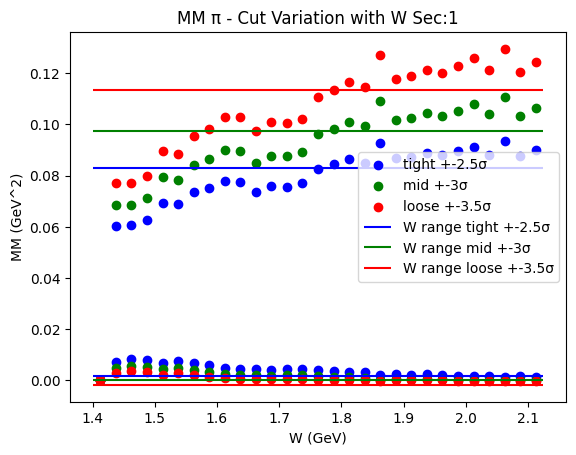

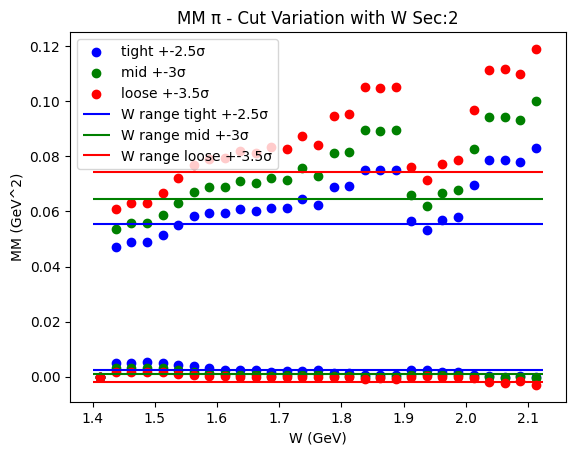

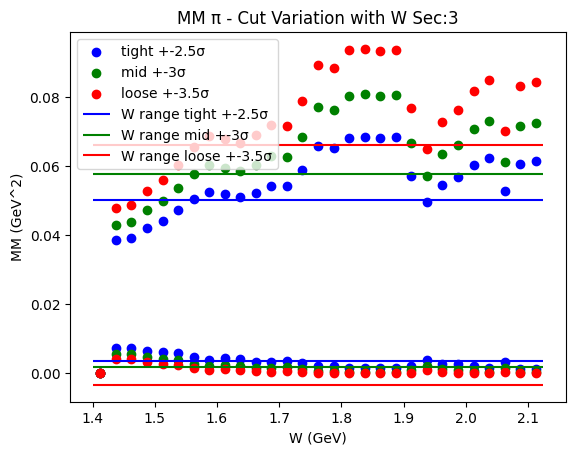

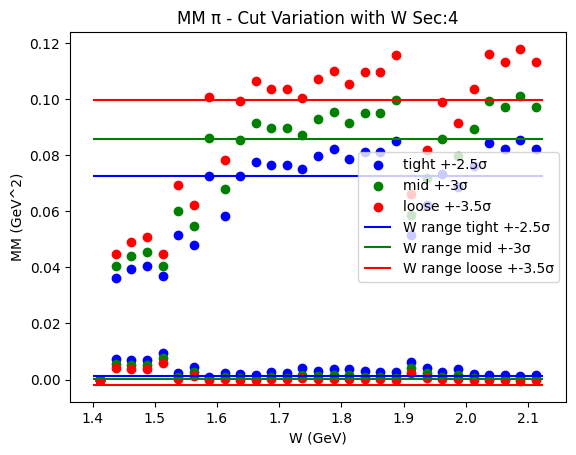

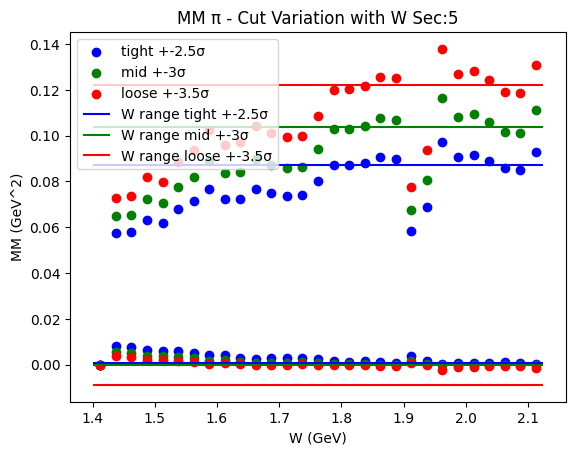

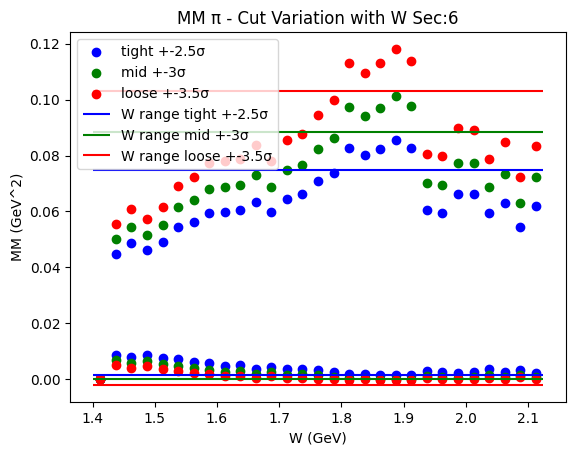

In [11]:
W_bins = [W_center(i) for i in range(_W_bins_)]



for sec in range(6):
    x = W_bins
    y_tight_w1 = [cut_bounds[sec][Wbin][0][0] for Wbin in range(_W_bins_)]
    y_tight_w2 = [cut_bounds[sec][Wbin][1][0] for Wbin in range(_W_bins_)]
    y_mid_w1 = [cut_bounds[sec][Wbin][0][1] for Wbin in range(_W_bins_)]
    y_mid_w2 = [cut_bounds[sec][Wbin][1][1] for Wbin in range(_W_bins_)]
    y_loose_w1 = [cut_bounds[sec][Wbin][0][2] for Wbin in range(_W_bins_)]
    y_loose_w2 = [cut_bounds[sec][Wbin][1][2] for Wbin in range(_W_bins_)]
    plt.scatter(W_bins,y_tight_w1,color='b',label="tight +-{}\u03C3".format(tight))
    plt.scatter(W_bins,y_tight_w2,color='b',)
    plt.scatter(W_bins,y_mid_w1,color='g',label="mid +-{}\u03C3".format(mid))
    plt.scatter(W_bins,y_mid_w2,color='g')
    plt.scatter(W_bins,y_loose_w1,color='r',label="loose +-{}\u03C3".format(loose))
    plt.scatter(W_bins,y_loose_w2,color='r')
    plt.hlines(cut_bounds[sec][_W_bins_][0][0],_W_min_,_W_max_,color='b',label="W range tight +-{}\u03C3".format(tight))
    plt.hlines(cut_bounds[sec][_W_bins_][1][0],_W_min_,_W_max_,color='b')
    plt.hlines(cut_bounds[sec][_W_bins_][0][1],_W_min_,_W_max_,color='g',label="W range mid +-{}\u03C3".format(mid))
    plt.hlines(cut_bounds[sec][_W_bins_][1][1],_W_min_,_W_max_,color='g')
    plt.hlines(cut_bounds[sec][_W_bins_][0][2],_W_min_,_W_max_,color='r',label="W range loose +-{}\u03C3".format(loose))
    plt.hlines(cut_bounds[sec][_W_bins_][1][2],_W_min_,_W_max_,color='r')
    plt.legend()
    plt.title("MM {} Cut Variation with W Sec:{}".format(Particle,sec+1))
    plt.xlabel("W (GeV)")
    plt.ylabel("MM (GeV^2)")
    plt.show()
    
    
    
    

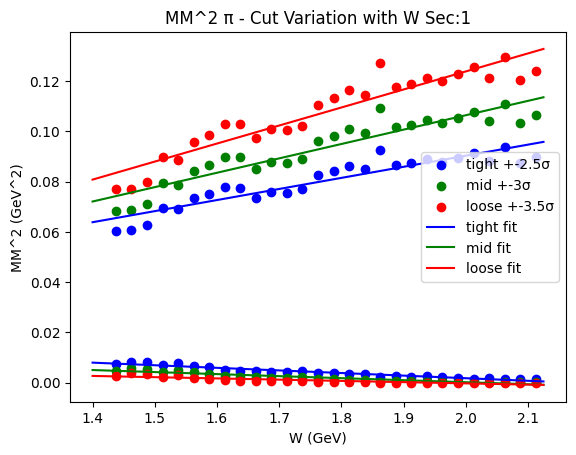

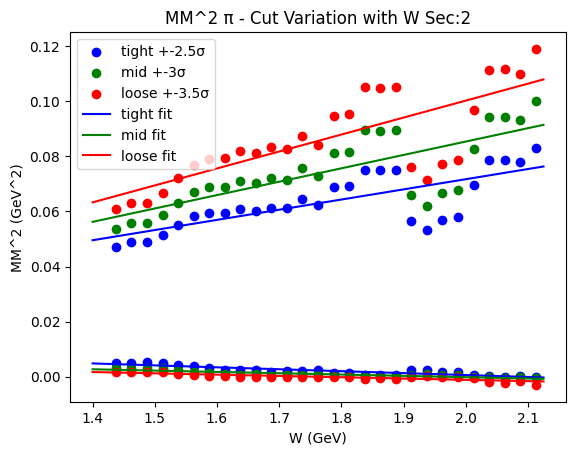

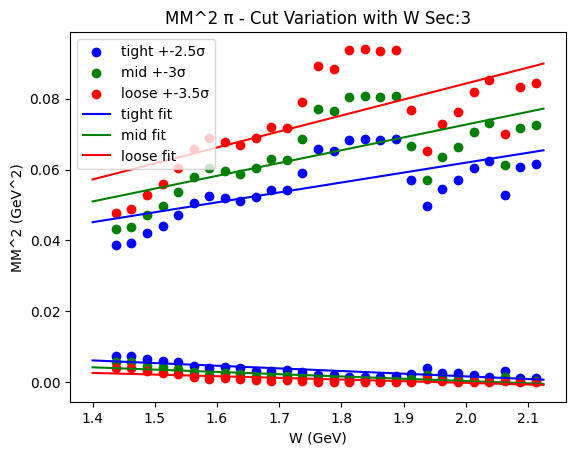

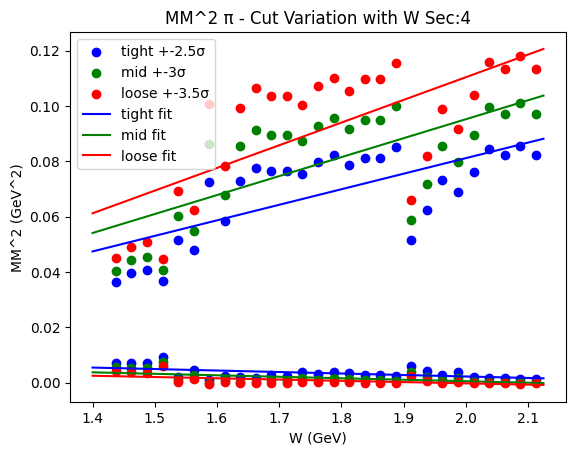

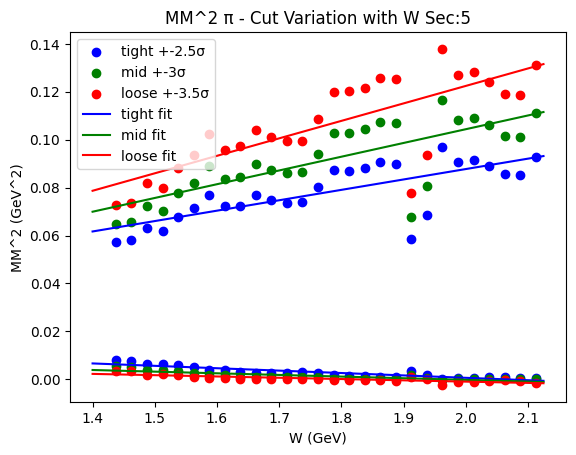

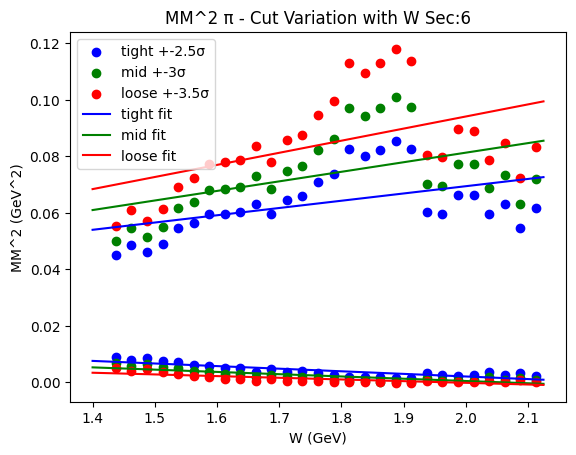

In [12]:
ini_lin1 = [-0.01,0.01]
ini_lin2 = [0.03,0.03]

def Linear(x_, a_,b_):
    return a_*x_ + b_

cut_pars = np.zeros((6,2,3,2))

for sec in range(6):
    y_tight_w1 = Remove_Zeros_Y([cut_bounds[sec][Wbin][0][0] for Wbin in range(_W_bins_)])
    y_tight_w2 = Remove_Zeros_Y([cut_bounds[sec][Wbin][1][0] for Wbin in range(_W_bins_)])
    y_mid_w1 = Remove_Zeros_Y([cut_bounds[sec][Wbin][0][1] for Wbin in range(_W_bins_)])
    y_mid_w2 = Remove_Zeros_Y([cut_bounds[sec][Wbin][1][1] for Wbin in range(_W_bins_)])
    y_loose_w1 = Remove_Zeros_Y([cut_bounds[sec][Wbin][0][2] for Wbin in range(_W_bins_)])
    y_loose_w2 = Remove_Zeros_Y([cut_bounds[sec][Wbin][1][2] for Wbin in range(_W_bins_)])
    #x_tight = Remove_Zeros_X(W_bins,[cut_bounds[sec][Wbin][0][0] for Wbin in range(_W_bins_)])
    x = Remove_Zeros_X(W_bins,[cut_bounds[sec][Wbin][0][1] for Wbin in range(_W_bins_)])
    #x_loose = Remove_Zeros_X(W_bins,[cut_bounds[sec][Wbin][0][2] for Wbin in range(_W_bins_)])
    plt.scatter(x,y_tight_w1,color='b',label="tight +-{}\u03C3".format(tight))
    plt.scatter(x,y_tight_w2,color='b',)
    plt.scatter(x,y_mid_w1,color='g',label="mid +-{}\u03C3".format(mid))
    plt.scatter(x,y_mid_w2,color='g')
    plt.scatter(x,y_loose_w1,color='r',label="loose +-{}\u03C3".format(loose))
    plt.scatter(x,y_loose_w2,color='r')
    try: 
        tight_pars1, tight_pars_cov1 = op.curve_fit(Linear,x,y_tight_w1,p0=ini_lin1,maxfev=5000)
        cont_x = np.linspace(_W_min_,_W_max_,200)
        plt.plot(cont_x,Linear(cont_x,*tight_pars1),label="tight fit",color='b')
        cut_pars[sec][0][0][0] = tight_pars1[0]
        cut_pars[sec][0][0][1] = tight_pars1[1]
    except RuntimeError:
        print("Runtime Error 1.1\n\tJust skip it for now")
    except ValueError:
        print("Value Error 1.1\n\tJust skip it for now")
    try: 
        tight_pars2, tight_pars_cov2 = op.curve_fit(Linear,x,y_tight_w2,p0=ini_lin2,maxfev=5000)
        cont_x = np.linspace(_W_min_,_W_max_,200)
        plt.plot(cont_x,Linear(cont_x,*tight_pars2),color='b')
        cut_pars[sec][1][0][0] = tight_pars2[0]
        cut_pars[sec][1][0][1] = tight_pars2[1]
    except RuntimeError:
        print("Runtime Error 1.2\n\tJust skip it for now")
    except ValueError:
        print("Value Error 1.2\n\tJust skip it for now")
    try: 
        mid_pars1, mid_pars_cov1 = op.curve_fit(Linear,x,y_mid_w1,p0=ini_lin1,maxfev=5000)
        cont_x = np.linspace(_W_min_,_W_max_,200)
        plt.plot(cont_x,Linear(cont_x,*mid_pars1),color='g')
        cut_pars[sec][0][1][0] = mid_pars1[0]
        cut_pars[sec][0][1][1] = mid_pars1[1]
    except RuntimeError:
        print("Runtime Error 2.1\n\tJust skip it for now")
    except ValueError:
        print("Value Error 2.1\n\tJust skip it for now")
    try: 
        mid_pars2, mid_pars_cov2 = op.curve_fit(Linear,x,y_mid_w2,p0=ini_lin2,maxfev=5000)
        cont_x = np.linspace(_W_min_,_W_max_,200)
        plt.plot(cont_x,Linear(cont_x,*mid_pars2),label="mid fit",color='g')
        cut_pars[sec][1][1][0] = mid_pars2[0]
        cut_pars[sec][1][1][1] = mid_pars2[1]
    except RuntimeError:
        print("Runtime Error 2.2\n\tJust skip it for now")
    except ValueError:
        print("Value Error 2.2\n\tJust skip it for now")
    try: 
        loose_pars1, loose_pars_cov1 = op.curve_fit(Linear,x,y_loose_w1,p0=ini_lin1,maxfev=5000)
        cont_x = np.linspace(_W_min_,_W_max_,200)
        plt.plot(cont_x,Linear(cont_x,*loose_pars1),label="loose fit",color='r')
        cut_pars[sec][0][2][0] = loose_pars1[0]
        cut_pars[sec][0][2][1] = loose_pars1[1]
    except RuntimeError:
        print("Runtime Error 3.1\n\tJust skip it for now")
    except ValueError:
        print("Value Error 3.1\n\tJust skip it for now")
    try: 
        loose_pars2, loose_pars_cov2 = op.curve_fit(Linear,x,y_loose_w2,p0=ini_lin2,maxfev=5000)
        cont_x = np.linspace(_W_min_,_W_max_,200)
        plt.plot(cont_x,Linear(cont_x,*loose_pars2),color='r')
        cut_pars[sec][1][2][0] = loose_pars2[0]
        cut_pars[sec][1][2][1] = loose_pars2[1]
    except RuntimeError:
        print("Runtime Error 3.2\n\tJust skip it for now")
    except ValueError:
        print("Value Error 3.2\n\tJust skip it for now")
    plt.legend()
    plt.title("MM^2 {} Cut Variation with W Sec:{}".format(Particle,sec+1))
    plt.xlabel("W (GeV)")
    plt.ylabel("MM^2 (GeV^2)")
    plt.show()

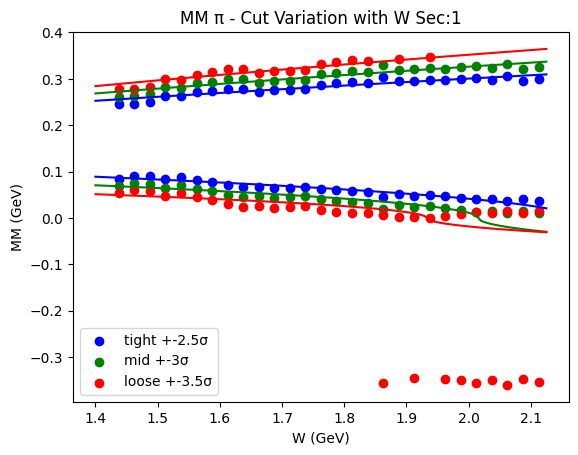

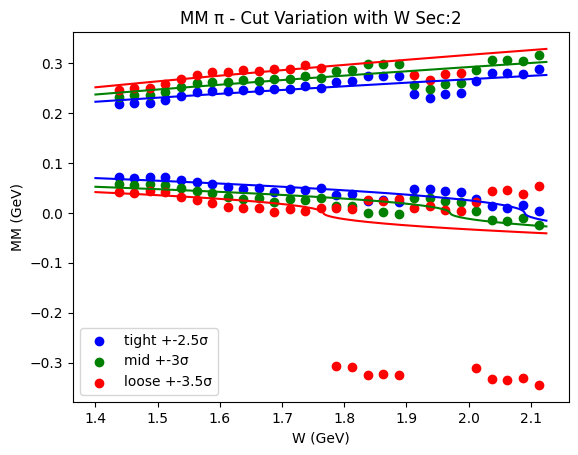

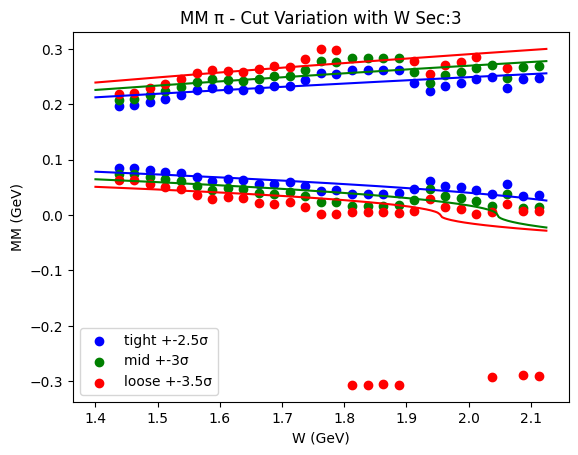

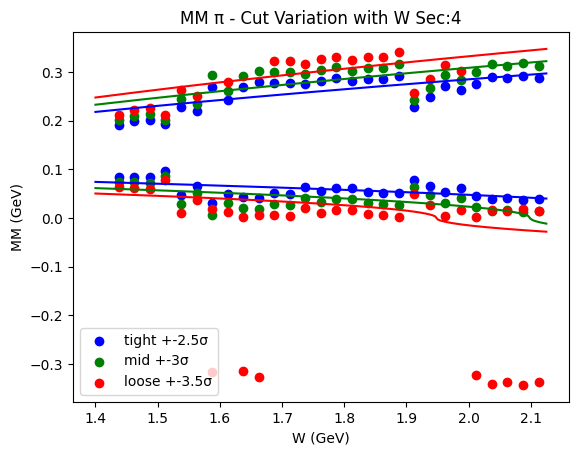

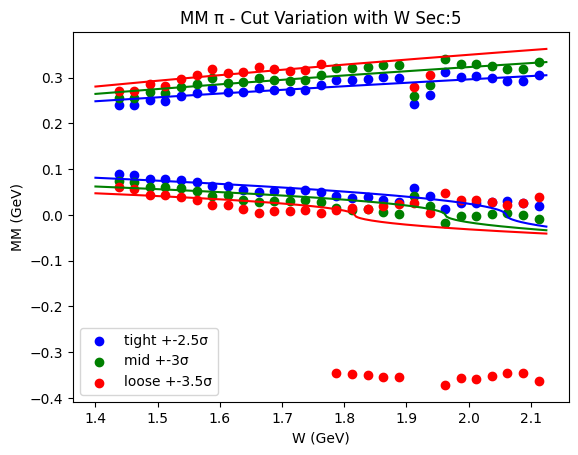

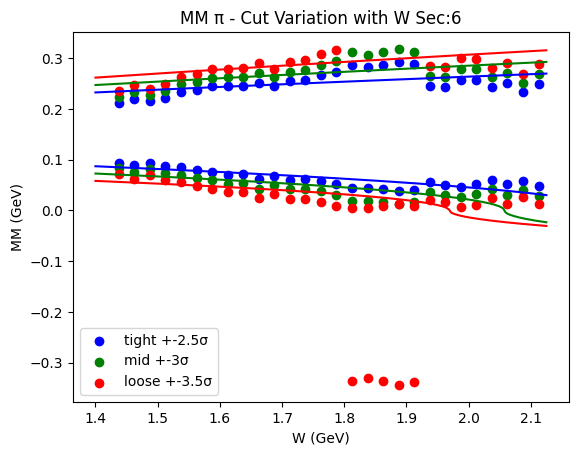

In [13]:
def Linear_sq(x_, a_,b_):
    return [sign(a_*x_[i] + b_)*math.sqrt(sign((a_*x_[i] + b_))*(a_*x_[i] + b_)) for i in range(len(x_))]

for sec in range(6):
    y_tight_w1 = Remove_Zeros_Y([sign(cut_bounds[sec][Wbin][0][0])*math.sqrt(sign(cut_bounds[sec][Wbin][0][0])*cut_bounds[sec][Wbin][0][0]) for Wbin in range(_W_bins_)])
    y_tight_w2 = Remove_Zeros_Y([math.sqrt(cut_bounds[sec][Wbin][1][0]) for Wbin in range(_W_bins_)])
    y_mid_w1 = Remove_Zeros_Y([sign(cut_bounds[sec][Wbin][0][1])*math.sqrt(sign(cut_bounds[sec][Wbin][0][1])*cut_bounds[sec][Wbin][0][1]) for Wbin in range(_W_bins_)])
    y_mid_w2 = Remove_Zeros_Y([math.sqrt(cut_bounds[sec][Wbin][1][1]) for Wbin in range(_W_bins_)])
    y_loose_w1 = Remove_Zeros_Y([math.sqrt(sign(cut_bounds[sec][Wbin][0][2])*cut_bounds[sec][Wbin][0][2]) for Wbin in range(_W_bins_)])
    y_loose_w2 = Remove_Zeros_Y([sign(cut_bounds[sec][Wbin][0][2])*math.sqrt(cut_bounds[sec][Wbin][1][2]) for Wbin in range(_W_bins_)])
    #x_tight = Remove_Zeros_X(W_bins,[cut_bounds[sec][Wbin][0][0] for Wbin in range(_W_bins_)])
    x = Remove_Zeros_X(W_bins,[cut_bounds[sec][Wbin][0][1] for Wbin in range(_W_bins_)])
    #x_loose = Remove_Zeros_X(W_bins,[cut_bounds[sec][Wbin][0][2] for Wbin in range(_W_bins_)])
    plt.scatter(x,y_tight_w1,color='b',label="tight +-{}\u03C3".format(tight))
    plt.scatter(x,y_tight_w2,color='b',)
    plt.scatter(x,y_mid_w1,color='g',label="mid +-{}\u03C3".format(mid))
    plt.scatter(x,y_mid_w2,color='g')
    plt.scatter(x,y_loose_w1,color='r',label="loose +-{}\u03C3".format(loose))
    plt.scatter(x,y_loose_w2,color='r')
    plt.plot(cont_x,Linear_sq(cont_x,*cut_pars[sec][0][0]),color='b')
    plt.plot(cont_x,Linear_sq(cont_x,*cut_pars[sec][1][0]),color='b')
    plt.plot(cont_x,Linear_sq(cont_x,*cut_pars[sec][0][1]),color='g')
    plt.plot(cont_x,Linear_sq(cont_x,*cut_pars[sec][1][1]),color='g')
    plt.plot(cont_x,Linear_sq(cont_x,*cut_pars[sec][0][2]),color='r')
    plt.plot(cont_x,Linear_sq(cont_x,*cut_pars[sec][1][2]),color='r')
    
    
    plt.legend()
    plt.title("MM {} Cut Variation with W Sec:{}".format(Particle,sec+1))
    plt.xlabel("W (GeV)")
    plt.ylabel("MM (GeV)")
    plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

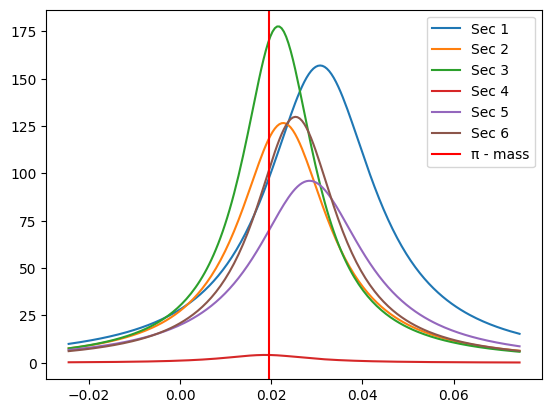

In [14]:
Wbin = 5#_W_bins_
m_par = 0.13957018
for sec in range(6):
    plt.plot(tmp_x1,BW_e2(tmp_x1,*bw_pars[sec][Wbin]),label="Sec {}".format(sec+1))
plt.axvline(x=m_par*m_par,label="{} mass".format(Particle),color='r')
plt.legend()
plt.show

In [15]:
# print("MM^2 "+Particle+" Cut Bounds [sec][low/high][tight/mid/loose]")
# for sec in range(6):
#     for side in range(2):
#         for t in range(3):
#             if t == 0:
#                 if side ==0:
#                     if sec==0:
#                         print("{\t{\t{",cut_bounds[sec][_W_bins_][side][t],end=",")
#                     else:
#                         print("\t{\t{",cut_bounds[sec][_W_bins_][side][t],end=",")
#                 else:
#                     print("\t\t{",cut_bounds[sec][_W_bins_][side][t],end=",")
#             elif t == 2:
#                 if side == 1:
#                     if sec == 5:
#                         print(cut_bounds[sec][_W_bins_][side][t],"}}}")
#                     else:
#                         print(cut_bounds[sec][_W_bins_][side][t],"}},")
#                 else: 
#                     print(cut_bounds[sec][_W_bins_][side][t],"},")
#             else: 
#                 print(cut_bounds[sec][_W_bins_][side][t],end=",")



In [16]:
print("MM ^2 "+Particle+" Linear Cut Bounds [sec][low/high][tight/mid/loose][slope,intercept]")
for sec in range(6):
    for side in range(2):
        for t in range(3):
            for a in range(2):
                if a == 0:
                    if t == 0:
                        if side ==0:
                            if sec==0:
                                print("{\t{\t{\t{",cut_pars[sec][side][t][a],end=",")
                            else:
                                print("\t{\t{\t{",cut_pars[sec][side][t][a],end=",")
                        else:
                            print("\t\t{\t{",cut_pars[sec][side][t][a],end=",")
                    else:
                        print("\t{",cut_pars[sec][side][t][a],end=",")
                elif a ==1:
                    if t == 2:
                        if side == 1:
                            if sec == 5:
                                print(cut_pars[sec][side][t][a],"}}}}")
                            else:
                                print(cut_pars[sec][side][t][a],"}}},")
                        else: 
                            print(cut_pars[sec][side][t][a],"}},")
                    else: 
                        print(cut_pars[sec][side][t][a],end="},")
                else:
                    print(cut_pars[sec][side][t][a],end=",")

MM ^2 π - Linear Cut Bounds [sec][low/high][tight/mid/loose][slope,intercept]
{	{	{	{ -0.0103234495456908,0.02237305117424857},	{ -0.00808668870788617,0.016300434405299574},	{ -0.004935894528240997,0.009539514869581458 }},
		{	{ 0.0441178417178445,0.0020604857182547633},	{ 0.057242860590385906,-0.00807464374341765},	{ 0.07176440559217201,-0.01968320594046122 }}},
	{	{	{ -0.007023681562348262,0.014677819190676893},	{ -0.004777319873920555,0.009411069501108172},	{ -0.004708071493847194,0.008315608417108728 }},
		{	{ 0.036899483026689155,-0.002121417231485989},	{ 0.048551372448566076,-0.011768029421598164},	{ 0.06152318303882323,-0.022863128304544816 }}},
	{	{	{ -0.007498656631921983,0.016619657821647666},	{ -0.006452334348158333,0.01320382218939796},	{ -0.004678011453968162,0.009141576098192274 }},
		{	{ 0.028002325849970564,0.005949625064313707},	{ 0.0361488445935714,0.00039978298587432445},	{ 0.0451310761650841,-0.005965120716940331 }}},
	{	{	{ -0.005360629333689223,0.01296710545289532